Import Required Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
import xgboost as xgb
from pyswarm import pso  # PSO library
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import ccxt
import time
import math
from tqdm import tqdm
import os

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import normaltest
import cleaning

from scipy import stats
from statsmodels.tsa.stattools import adfuller
from scipy.stats import pearsonr

**Data Collection and Preprocessing**

In [3]:
def fetch_ohlcv(symbol, timeframe, since, until, limit=1000, exchange_name='binance', max_retries=3):
    """
    Fetch OHLCV data from Binance while respecting API rate limits, using retry logic and showing a progress bar.
    
    :param symbol: Trading pair symbol, e.g., 'BTC/USDT'.
    :param timeframe: Timeframe string, e.g., '1s', '1d'.
    :param since: Unix timestamp in milliseconds to start fetching data from.
    :param until: Unix timestamp in milliseconds to end fetching data.
    :param limit: Number of data points to fetch per call (default is 1000).
    :param exchange_name: Name of the exchange, e.g., 'binance'.
    :param max_retries: Maximum number of retries in case of failure.
    :return: DataFrame with OHLCV data.
    """
    exchange_class = getattr(ccxt, exchange_name)
    exchange = exchange_class()
    data = []
    rate_limit_per_minute = 1200  # Binance API rate limit
    max_rows_per_request = 1000  # Maximum rows per request
    request_weight = 1  # Weight per request as per Binance documentation

    # Calculate time interval per request based on the timeframe
    time_per_request = {
        '1s': 1000,       # 1 second
        '1m': 60 * 1000,  # 1 minute
        '5m': 5 * 60 * 1000,
        '15m': 15 * 60 * 1000,
        '30m': 30 * 60 * 1000,
        '1h': 60 * 60 * 1000,
        '2h': 2 * 60 * 60 * 1000,
        '4h': 4 * 60 * 60 * 1000,
        '1d': 24 * 60 * 60 * 1000,
    }[timeframe]
    
    total_requests_needed = math.ceil((until - since) / (time_per_request * max_rows_per_request))
    delay_between_requests = 60 / rate_limit_per_minute  # Delay in seconds to respect the rate limit

    # Initialize the progress bar
    with tqdm(total=total_requests_needed, desc=f"Fetching data for {symbol} ({timeframe})", unit="request") as pbar:
        while since < until:
            for attempt in range(max_retries):
                try:
                    # Fetch OHLCV data
                    ohlcv = exchange.fetch_ohlcv(symbol, timeframe, since=since, limit=limit)
                    if not ohlcv:
                        break
                    data.extend(ohlcv)
                    since = ohlcv[-1][0] + 1
                    if since >= until:
                        break
                    # Update the progress bar
                    pbar.update(1)
                    # Respect the rate limit by adding a delay
                    time.sleep(delay_between_requests)
                    break  # Exit retry loop if successful
                except ccxt.NetworkError as e:
                    print(f"Network error for {symbol}: {e}. Retrying {attempt + 1}/{max_retries}...")
                    time.sleep(2 ** attempt)  # Exponential backoff
                except ccxt.ExchangeError as e:
                    print(f"Exchange error for {symbol}: {e}. Retrying {attempt + 1}/{max_retries}...")
                    time.sleep(2 ** attempt)  # Exponential backoff
                except Exception as e:
                    print(f"Error fetching data for {symbol}: {e}")
                    return pd.DataFrame(data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
    
    df = pd.DataFrame(data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
    return df

In [4]:
# List of symbols to fetch
symbols = ['BTC/USDT', 'ETH/USDT', 'ADA/USDT', 'DOGE/USDT', 'XRP/USDT', 
           'LTC/USDT', 'LINK/USDT', 'XLM/USDT']

In [5]:
# Prepare the parameter do fetch data for each symbol
data_dict = {}
timeframe = '4h'  # used timeframe

# Define the Dates parameters for stard and end of the data colection.
since = int(pd.Timestamp('2022-01-01').timestamp() * 1000)  # Start date: January 1, 2022
until = int(pd.Timestamp('2024-08-31').timestamp() * 1000)  # End date: August 31, 2024

In [6]:
# Dictionary to store whether the file exists for each symbol
file_existence_dict = {}

# Combined loop: Check if file exists, load it if true, otherwise fetch data and save it
for symbol in symbols:
    # Create the file name based on symbol and timeframe
    file_name = f'{symbol.replace("/", "_")}_{timeframe}.csv'
    
    # Check if the file exists
    if os.path.exists(file_name):
        # If the file exists, load the data from the CSV files that were saved during the data collection phase.
        df = pd.read_csv(file_name)
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        file_existence_dict[symbol] = True  # Mark that the file existed
        print(f"Data for {symbol} loaded from {file_name}.")
    else:
        # If the file does not exist, fetch the data using the API
        df = fetch_ohlcv(symbol, timeframe, since, until)
        df.to_csv(file_name, index=False)  # Save the fetched data to CSV
        file_existence_dict[symbol] = False  # Mark that the file didn't exist and was fetched
        print(f"Data for {symbol} fetched and saved to {file_name}.")

    # Store the data in the data_dict for later use
    data_dict[symbol] = df

Data for BTC/USDT loaded from BTC_USDT_4h.csv.
Data for ETH/USDT loaded from ETH_USDT_4h.csv.
Data for ADA/USDT loaded from ADA_USDT_4h.csv.
Data for DOGE/USDT loaded from DOGE_USDT_4h.csv.
Data for XRP/USDT loaded from XRP_USDT_4h.csv.
Data for LTC/USDT loaded from LTC_USDT_4h.csv.
Data for LINK/USDT loaded from LINK_USDT_4h.csv.
Data for XLM/USDT loaded from XLM_USDT_4h.csv.


In [7]:
# Print out the file existence dictionary for reference
print("File existence dictionary:")
print(file_existence_dict)

File existence dictionary:
{'BTC/USDT': True, 'ETH/USDT': True, 'ADA/USDT': True, 'DOGE/USDT': True, 'XRP/USDT': True, 'LTC/USDT': True, 'LINK/USDT': True, 'XLM/USDT': True}


In [8]:
# Define the start and end dates for filtering
start_date = pd.Timestamp('2022-01-01')
end_date = pd.Timestamp('2024-08-31')

In [9]:
# Define the start and end dates for filtering
start_date = pd.Timestamp('2022-01-01')
end_date = pd.Timestamp('2024-08-31')

# Align timestamps across all coins
# Create a common timestamp index by finding the intersection of timestamps
# Collect the timestamps from each DataFrame in the `aligned_data_dict`
common_timestamps = set(data_dict[list(data_dict.keys())[0]]['timestamp'])  # Start with the first coin's timestamps

# Find the intersection of all timestamps across all coins
for symbol, df in data_dict.items():
    common_timestamps = common_timestamps.intersection(set(df['timestamp']))

# Convert back to a sorted list of common timestamps
common_timestamps = sorted(list(common_timestamps))

# Filter each DataFrame to include only the common timestamps and the specified date range
aligned_data_dict = {}
for symbol, df in data_dict.items():
    # Filter by common timestamps and specified date range
    df_filtered = df[df['timestamp'].isin(common_timestamps)]  # Filter by common timestamps
    df_filtered = df_filtered[(df_filtered['timestamp'] >= start_date) & (df_filtered['timestamp'] <= end_date)]  # Filter by date range
    
    # Optional: Reindex to ensure timestamps are aligned across all DataFrames
    df_filtered = df_filtered.set_index('timestamp').reindex(common_timestamps).reset_index()
    
    # Save each filtered DataFrame into the dictionary and CSV
    coin_filename = f'{symbol.replace("/", "_")}_{timeframe}_aligned_2022_2024.csv'
    df_filtered.to_csv(coin_filename, index=False)
    
    aligned_data_dict[symbol] = df_filtered

# Combine the data for all coins into a single DataFrame
# Start with 'timestamp' column from one of the coins (e.g., BTC/USDT)
combined_df = aligned_data_dict['BTC/USDT'][['timestamp']].copy()

for symbol, df in aligned_data_dict.items():
    # Merge the 'close' prices of each coin based on the common timestamps
    combined_df = combined_df.merge(df[['timestamp', 'close']], on='timestamp', how='inner', suffixes=('', f'_{symbol.replace("/", "_")}'))

# Save the combined DataFrame into a single CSV file
combined_df.to_csv('aligned_memecoin_data_2022_2024_combined.csv', index=False)

print("Aligned data saved to separate CSV files and combined in 'aligned_memecoin_data_2022_2024_combined.csv'.")


Aligned data saved to separate CSV files and combined in 'aligned_memecoin_data_2022_2024_combined.csv'.


In [10]:
def identify_data_quality_issues(df):
    """
    Identify and summarize data quality issues such as missing values, duplicates, and irrelevant columns.
    
    Parameters:
    df (pd.DataFrame): Input DataFrame
    
    Returns:
    None: Prints out data quality issues and their impact on analysis.
    """
    print("### Data Quality Issues ###")
    
    # Check for missing values
    missing_values = df.isnull().sum()
    print(f"Missing values:\n{missing_values}\n")
    if missing_values.any():
        print("Impact: Missing values can distort model training or affect accuracy. Imputation or removal is needed.")
    
    # Check for duplicates
    duplicate_rows = df.duplicated().sum()
    print(f"Duplicate rows: {duplicate_rows}\n")
    if duplicate_rows > 0:
        print("Impact: Duplicates can bias the analysis, leading to incorrect conclusions or overfitting.")
    
    # Check for irrelevant columns (example: columns with constant values)
    constant_columns = [col for col in df.columns if df[col].nunique() == 1]
    print(f"Irrelevant columns (constant values): {constant_columns}\n")
    if constant_columns:
        print("Impact: Constant columns do not contribute useful information to the analysis and can be removed.")

    print("### Data Quality Summary Completed ###")

In [11]:
def comprehensive_data_cleaning(df):
    """
    Clean the data by addressing all identified data quality issues.
    - Handles missing values
    - Removes duplicates
    - Drops unnecessary columns
    - Formats data appropriately
    
    Parameters:
    df (pd.DataFrame): Input DataFrame
    
    Returns:
    pd.DataFrame: Cleaned DataFrame
    """
    # Handle missing values (fill forward and backward)
    df = df.ffill()  # Forward fill
    df = df.bfill()  # Backward fill

    # Remove duplicate rows
    df = df.drop_duplicates()
    
    # Drop irrelevant columns
    irrelevant_columns = [col for col in df.columns if df[col].nunique() == 1]
    df.drop(columns=irrelevant_columns, inplace=True)
    
    # Convert timestamp to datetime format
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    
    return df

In [12]:
def impute_missing_values(df):
    """
    Impute missing values in the DataFrame using appropriate strategies.
    - Numeric columns: Fill with the mean value
    - Time-series columns: Forward and backward fill
    
    Parameters:
    df (pd.DataFrame): Input DataFrame
    
    Returns:
    pd.DataFrame: DataFrame with imputed missing values
    """
    # Handle missing numeric data by filling with the mean
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())
    
    # For time series data, apply forward and backward fill
    df = df.ffill()  # Forward fill
    df = df.bfill()  # Backward fill
    
    return df


In [13]:
# Loop through each symbol in the aligned_data_dict and apply the functions
for symbol, df in aligned_data_dict.items():
    
    print(f"Processing {symbol}...")

    # Step 1: Identify and summarize data quality issues for the current DataFrame
    print(f"Data Quality Issues for {symbol}:")
    identify_data_quality_issues(df)
    
    # Step 2: Clean the data by addressing all identified data quality issues
    cleaned_df = comprehensive_data_cleaning(df)
    print(f"Data Cleaning Completed for {symbol}.")

    # Step 3: Impute missing values in the cleaned DataFrame
    df_imputed = impute_missing_values(cleaned_df)
    print(f"Missing Data Imputation Completed for {symbol}.")
    
    # Store the cleaned and imputed DataFrame back into aligned_data_dict
    aligned_data_dict[symbol] = df_imputed

    print(f"Completed processing for {symbol}.\n")


Processing BTC/USDT...
Data Quality Issues for BTC/USDT:
### Data Quality Issues ###
Missing values:
timestamp     0
open         62
high         62
low          62
close        62
volume       62
dtype: int64

Impact: Missing values can distort model training or affect accuracy. Imputation or removal is needed.
Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###
Data Cleaning Completed for BTC/USDT.
Missing Data Imputation Completed for BTC/USDT.
Completed processing for BTC/USDT.

Processing ETH/USDT...
Data Quality Issues for ETH/USDT:
### Data Quality Issues ###
Missing values:
timestamp     0
open         62
high         62
low          62
close        62
volume       62
dtype: int64

Impact: Missing values can distort model training or affect accuracy. Imputation or removal is needed.
Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###
Data Cleaning Completed for ETH/USDT.
Missing Data

In [14]:
def plot_correlation_matrix(df):
    """
    Plot a correlation matrix for the DataFrame.

    Parameters:
    df (pd.DataFrame): Input DataFrame

    Returns:
    None: Displays a heatmap of the correlation matrix
    """
    plt.figure(figsize=(10, 8))
    corr_matrix = df.corr()  # Compute correlation matrix
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Matrix')
    plt.show()

In [15]:
def univariate_analysis(df):
    """
    Perform univariate analysis on the dataset (e.g., histograms, summary statistics).
    
    Parameters:
    df (pd.DataFrame): Input DataFrame
    
    Returns:
    None: Displays plots and prints summary statistics
    """
    print(df.describe())
    df.hist(figsize=(12, 10))
    plt.show()

In [16]:
def bivariate_analysis(df, col1, col2):
    """
    Perform bivariate analysis (e.g., scatter plots, correlation).
    
    Parameters:
    df (pd.DataFrame): Input DataFrame
    col1 (str): Column 1
    col2 (str): Column 2
    
    Returns:
    None: Displays scatter plot and prints correlation
    """
    corr_value = df[col1].corr(df[col2])
    print(f"Correlation between {col1} and {col2}: {corr_value}")
    sns.scatterplot(x=df[col1], y=df[col2])
    plt.show()

In [17]:
def multivariate_analysis(df):
    """
    Perform multivariate analysis (e.g., correlation matrix, pair plots).
    
    Parameters:
    df (pd.DataFrame): Input DataFrame
    
    Returns:
    None: Displays pair plots and heatmap
    """
    sns.pairplot(df)
    plt.show()
    plot_correlation_matrix(df)

In [18]:
# Function for performing normality test
def normality_test(df, column):
    """
    Perform a normality test on a specific column of the DataFrame using D'Agostino's K-squared test.
    """
    data = df[column].dropna()  # Drop NaN values
    test_statistic, p_value = stats.normaltest(data)
    print(f"Normality Test on '{column}':")
    print(f"Test Statistic: {test_statistic:.2f}, p-value: {p_value:.5f}")
    alpha = 0.05  # 5% significance level
    if p_value > alpha:
        print(f"Fail to reject H0: '{column}' follows a normal distribution (p > {alpha}).\n")
    else:
        print(f"Reject H0: '{column}' does not follow a normal distribution (p <= {alpha}).\n")

In [19]:
# Function for performing stationarity test
def stationarity_test(df, column):
    """
    Perform a stationarity test on a specific column using the Augmented Dickey-Fuller Test.
    """
    data = df[column].dropna()  # Drop NaN values
    result = adfuller(data)
    print(f"Stationarity Test on '{column}':")
    print(f"ADF Statistic: {result[0]:.2f}, p-value: {result[1]:.5f}")
    print(f"Critical Values: {result[4]}")
    alpha = 0.05  # 5% significance level
    if result[1] > alpha:
        print(f"Fail to reject H0: '{column}' has a unit root, meaning it's non-stationary (p > {alpha}).\n")
    else:
        print(f"Reject H0: '{column}' does not have a unit root, meaning it's stationary (p <= {alpha}).\n")

In [20]:
# Function for performing correlation test
def correlation_test(df1, df2, column1, column2):
    """
    Perform a Pearson correlation test between two DataFrames' specified columns.
    """
    data1 = df1[column1].dropna()
    data2 = df2[column2].dropna()
    
    # Ensure the two columns have the same length
    common_length = min(len(data1), len(data2))
    data1 = data1[:common_length]
    data2 = data2[:common_length]
    
    corr, p_value = pearsonr(data1, data2)
    print(f"Correlation Test between '{column1}' and '{column2}':")
    print(f"Pearson Correlation: {corr:.2f}, p-value: {p_value:.5f}")
    alpha = 0.05  # 5% significance level
    if p_value > alpha:
        print(f"Fail to reject H0: No significant correlation (p > {alpha}).\n")
    else:
        print(f"Reject H0: Significant correlation exists (p <= {alpha}).\n")

In [21]:
# Function to create a correlation matrix between symbols
def correlation_matrix(aligned_data_dict):
    """
    Create and plot a correlation matrix for the close prices of all symbols in aligned_data_dict.
    """
    combined_df = pd.DataFrame()

    # Combine all 'close' prices in one DataFrame
    for symbol, df in aligned_data_dict.items():
        combined_df[symbol] = df['close']

    # Calculate the correlation matrix
    corr_matrix = combined_df.corr()

    # Plot the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Matrix for Coin Close Prices')
    plt.show()

In [22]:
# Main function to loop through all coins and perform all tests
def perform_all_tests(aligned_data_dict):
    """
    Perform normality, stationarity, and correlation tests for all symbols in aligned_data_dict.
    """
    # Perform correlation matrix
    print("### Correlation Matrix for All Symbols ###")
    correlation_matrix(aligned_data_dict)

    # Loop through each symbol and perform normality and stationarity tests
    for symbol, df in aligned_data_dict.items():
        print(f"### Testing for {symbol} ###")
        
        # Perform normality test on 'close' prices
        normality_test(df, 'close')
        
        # Perform stationarity test on 'close' prices
        stationarity_test(df, 'close')
        
        print(f"### Correlation Tests for {symbol} ###")
        for other_symbol, other_df in aligned_data_dict.items():
            if symbol != other_symbol:
                # Perform correlation test between 'close' prices of current symbol and another symbol
                correlation_test(df, other_df, 'close', 'close')

In [23]:
def data_pipeline(aligned_data_dict, symbols):
    """
    Perform the entire data wrangling, cleaning, and EDA process.
    
    Parameters:
    df (pd.DataFrame): Input DataFrame
    
    Returns:
    pd.DataFrame: Cleaned and analyzed DataFrame
    """

    for symbol, df in aligned_data_dict.items():
        print("### Step 1: Identifying Data Quality Issues ###")
        identify_data_quality_issues(df)
    
        print("\n### Step 2: Cleaning the Data ###")
        df = comprehensive_data_cleaning(df)
    
        print("\n### Step 3: Handling Missing Data ###")
        df = impute_missing_values(df)
        
        print("\n### Step 4: Performing EDA ###")
        univariate_analysis(df)
        multivariate_analysis(df)
    
    print("\n### Step 5: Hypothesis Testing ###")
    # Call the main function to perform all tests
    perform_all_tests(aligned_data_dict)
    
    return df

### Step 1: Identifying Data Quality Issues ###
### Data Quality Issues ###
Missing values:
timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###

### Step 2: Cleaning the Data ###

### Step 3: Handling Missing Data ###

### Step 4: Performing EDA ###
                 timestamp          open          high           low  \
count                 5901   5901.000000   5901.000000   5901.000000   
mean   2023-05-07 16:00:00  36622.105930  36911.848548  36324.722896   
min    2022-01-01 00:00:00  15721.510000  15824.160000  15476.000000   
25%    2022-09-03 20:00:00  23431.390000  23638.840000  23296.300000   
50%    2023-05-07 16:00:00  30160.710000  30349.740000  29921.540000   
75%    2024-01-08 12:00:00  43968.320000  44324.800000  43638.680000   
max    2024-09-10 08:00:00  73349.240000  73777.000000  72820.000000   
std                   

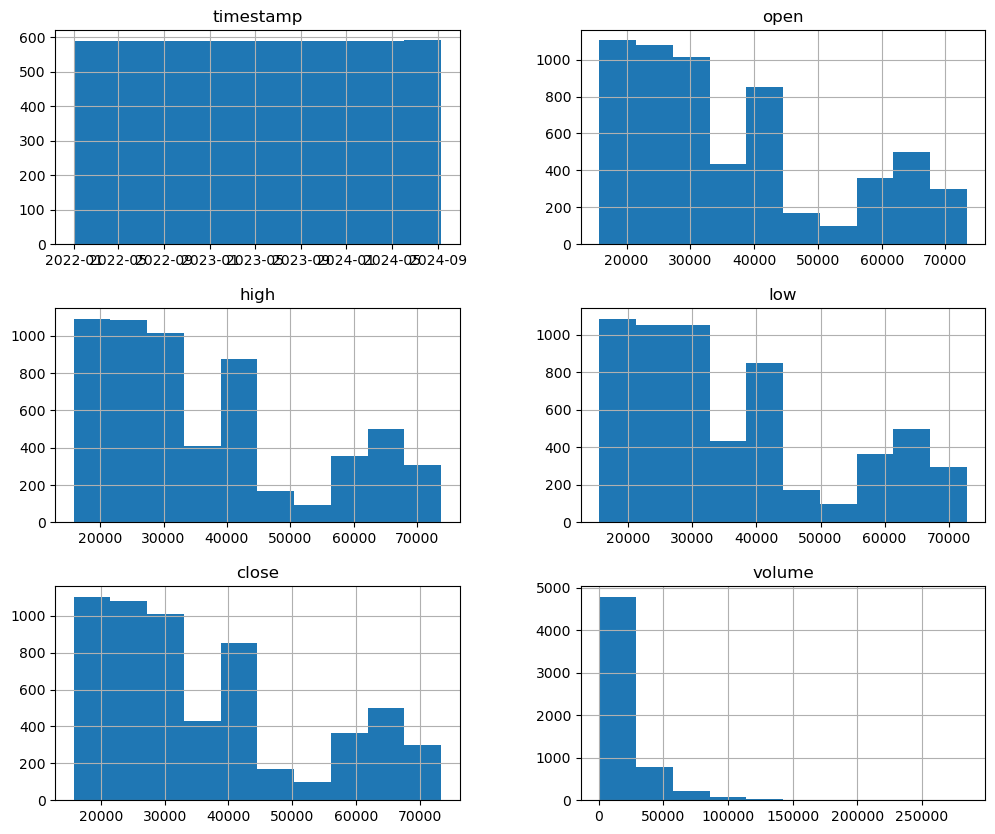

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

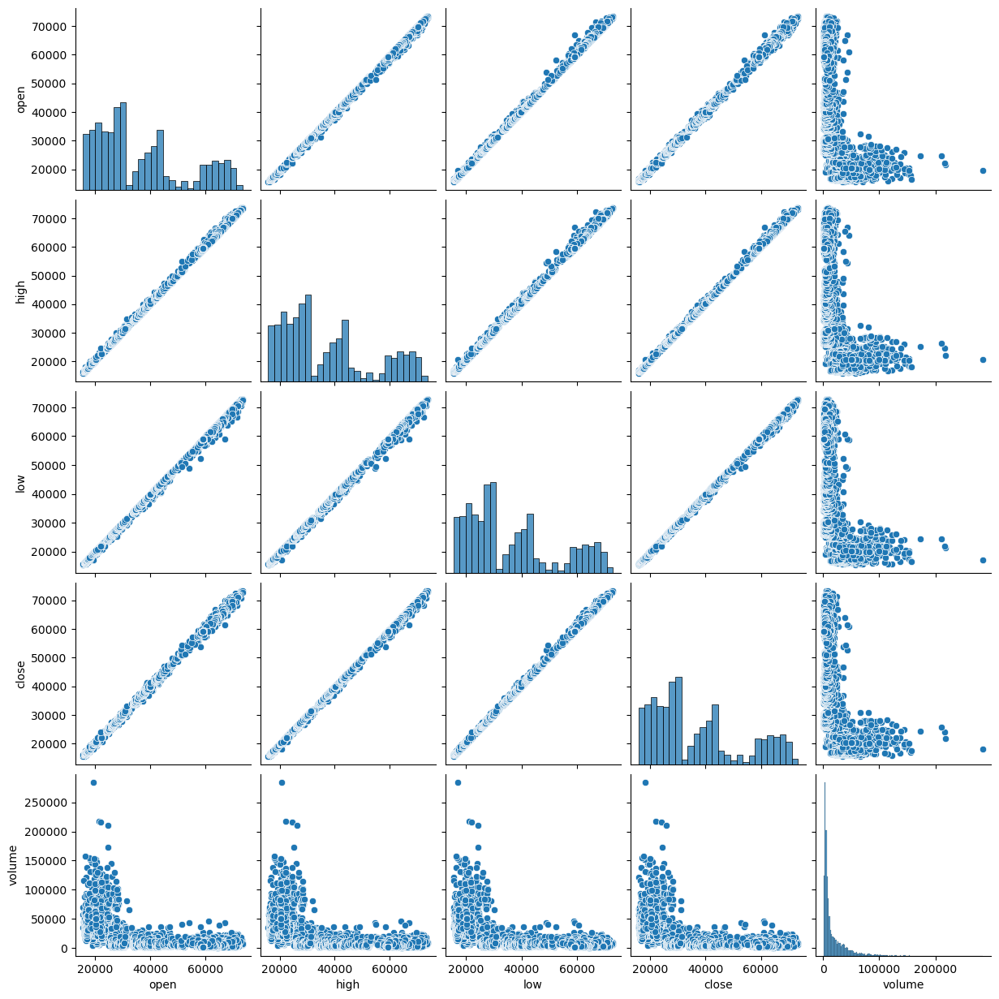

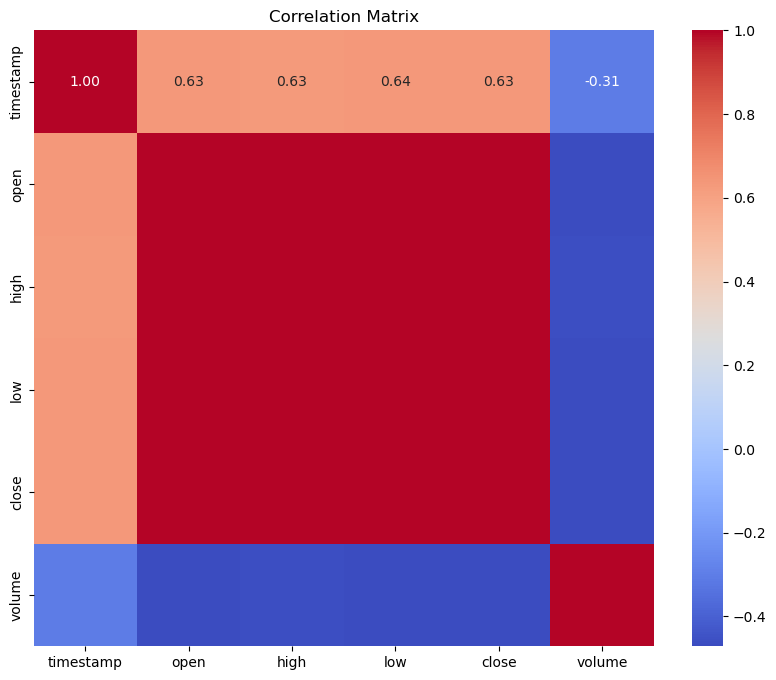

### Step 1: Identifying Data Quality Issues ###
### Data Quality Issues ###
Missing values:
timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###

### Step 2: Cleaning the Data ###

### Step 3: Handling Missing Data ###

### Step 4: Performing EDA ###
                 timestamp         open         high          low  \
count                 5901  5901.000000  5901.000000  5901.000000   
mean   2023-05-07 16:00:00  2196.725860  2217.421622  2174.373533   
min    2022-01-01 00:00:00   915.160000   973.560000   881.560000   
25%    2022-09-03 20:00:00  1626.020000  1636.910000  1610.140000   
50%    2023-05-07 16:00:00  1897.940000  1910.370000  1884.220000   
75%    2024-01-08 12:00:00  2861.390000  2895.370000  2826.130000   
max    2024-09-10 08:00:00  4064.800000  4093.920000  4038.090000   
std                    NaN   760.748325   767.

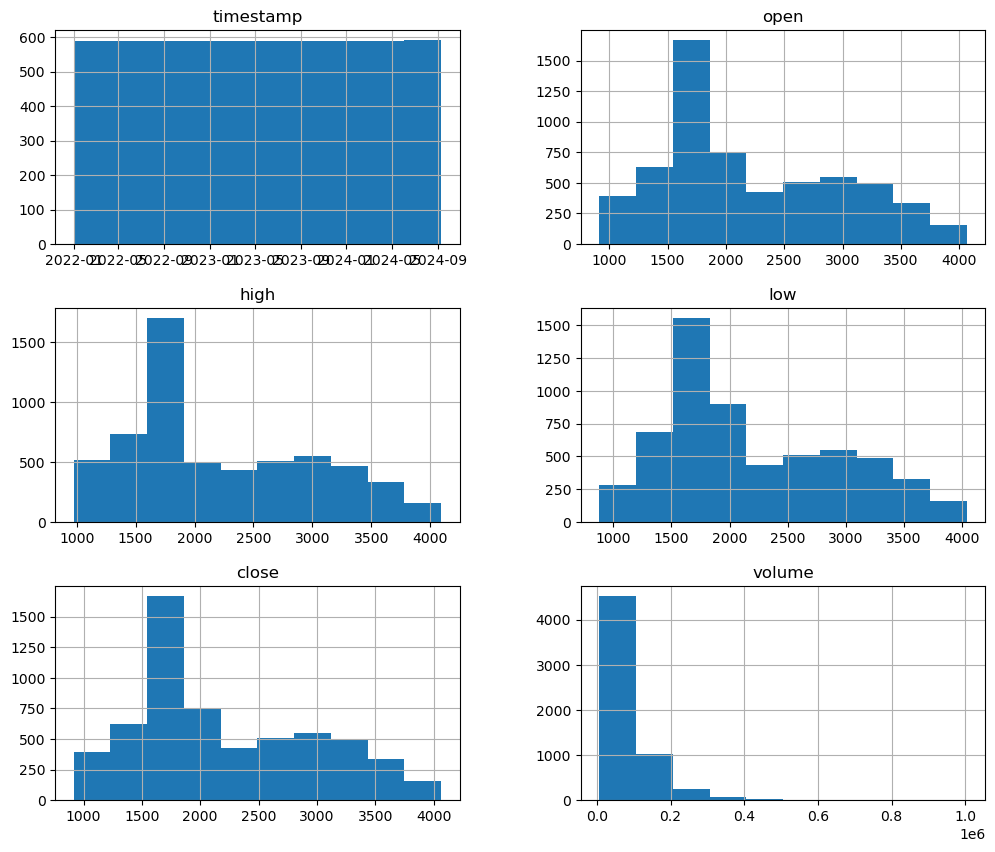

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

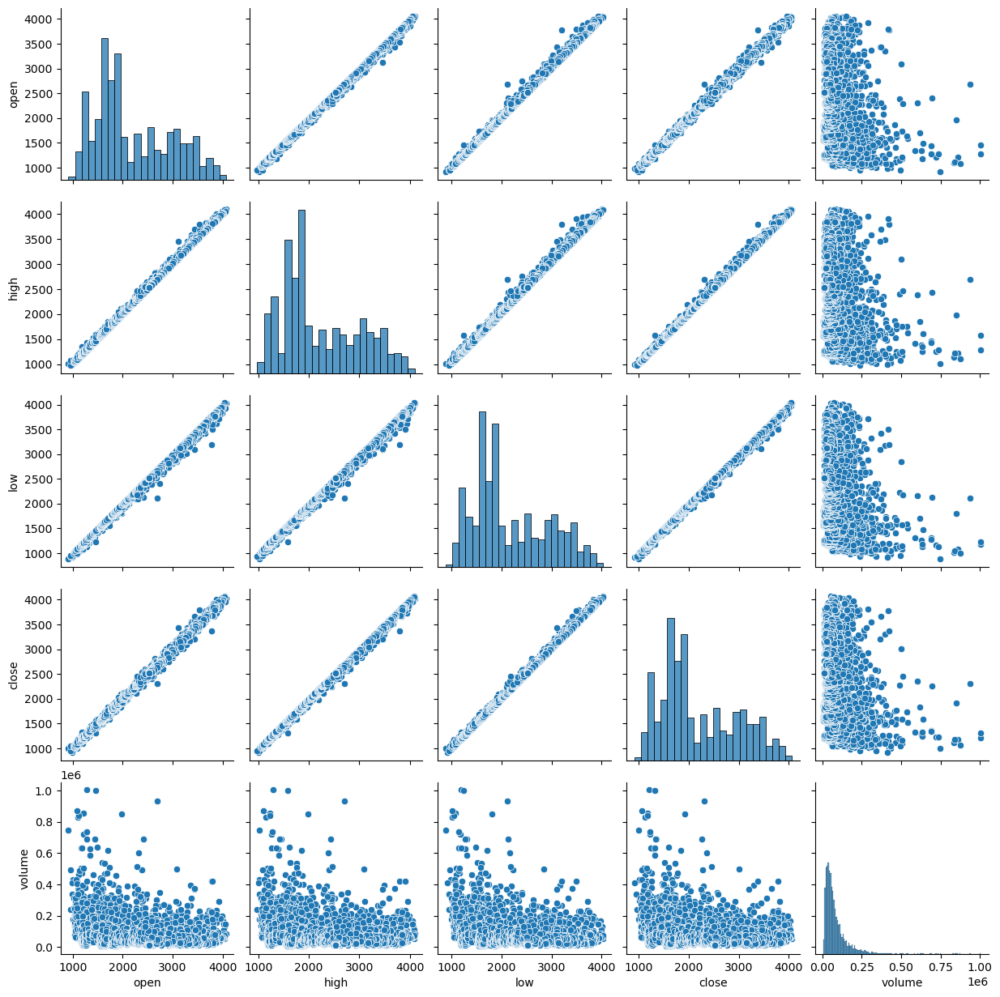

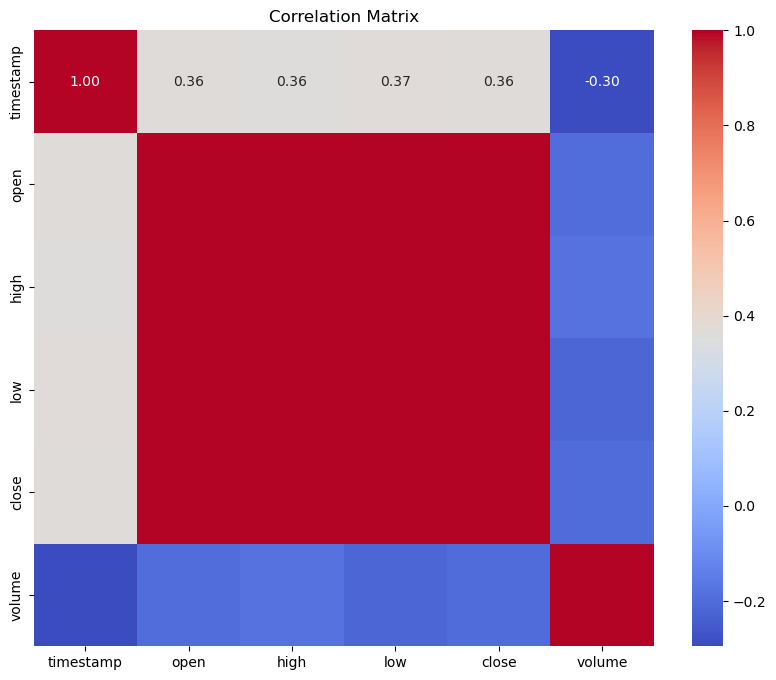

### Step 1: Identifying Data Quality Issues ###
### Data Quality Issues ###
Missing values:
timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###

### Step 2: Cleaning the Data ###

### Step 3: Handling Missing Data ###

### Step 4: Performing EDA ###
                 timestamp         open         high          low  \
count                 5901  5901.000000  5901.000000  5901.000000   
mean   2023-05-07 16:00:00     0.492867     0.499244     0.485936   
min    2022-01-01 00:00:00     0.238100     0.242300     0.220000   
25%    2022-09-03 20:00:00     0.343400     0.347500     0.338500   
50%    2023-05-07 16:00:00     0.420700     0.424200     0.415500   
75%    2024-01-08 12:00:00     0.542000     0.549500     0.533600   
max    2024-09-10 08:00:00     1.602000     1.638000     1.562000   
std                    NaN     0.240366     0.

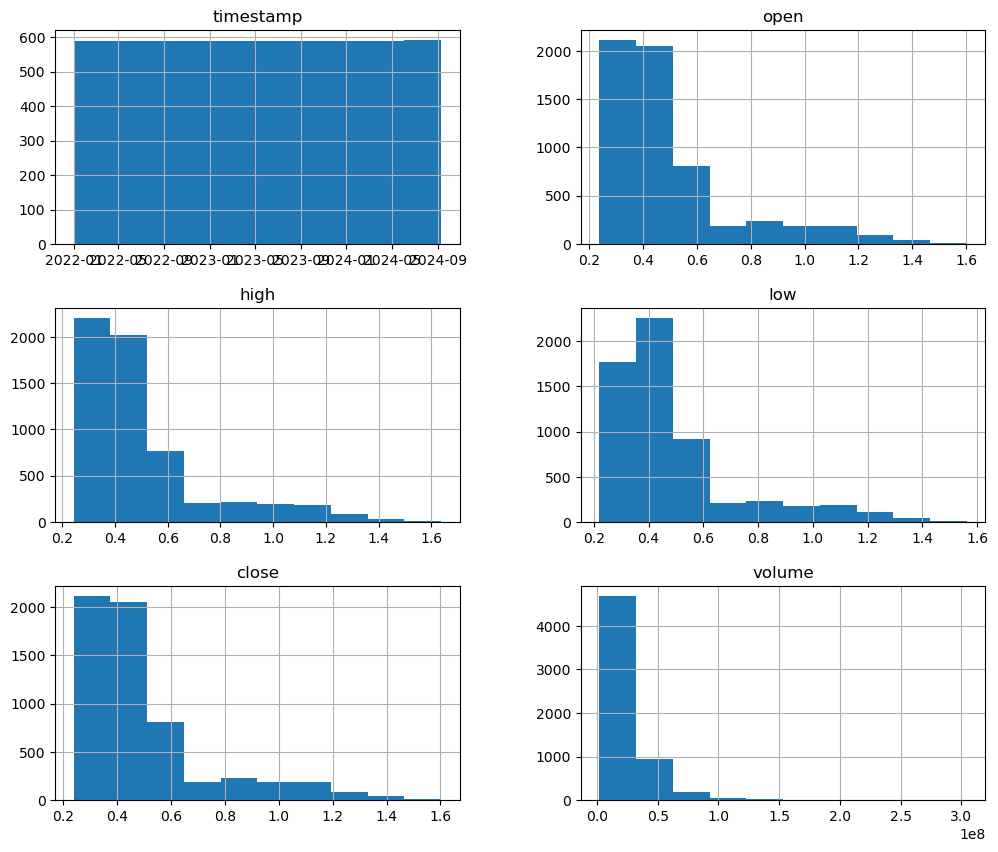

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

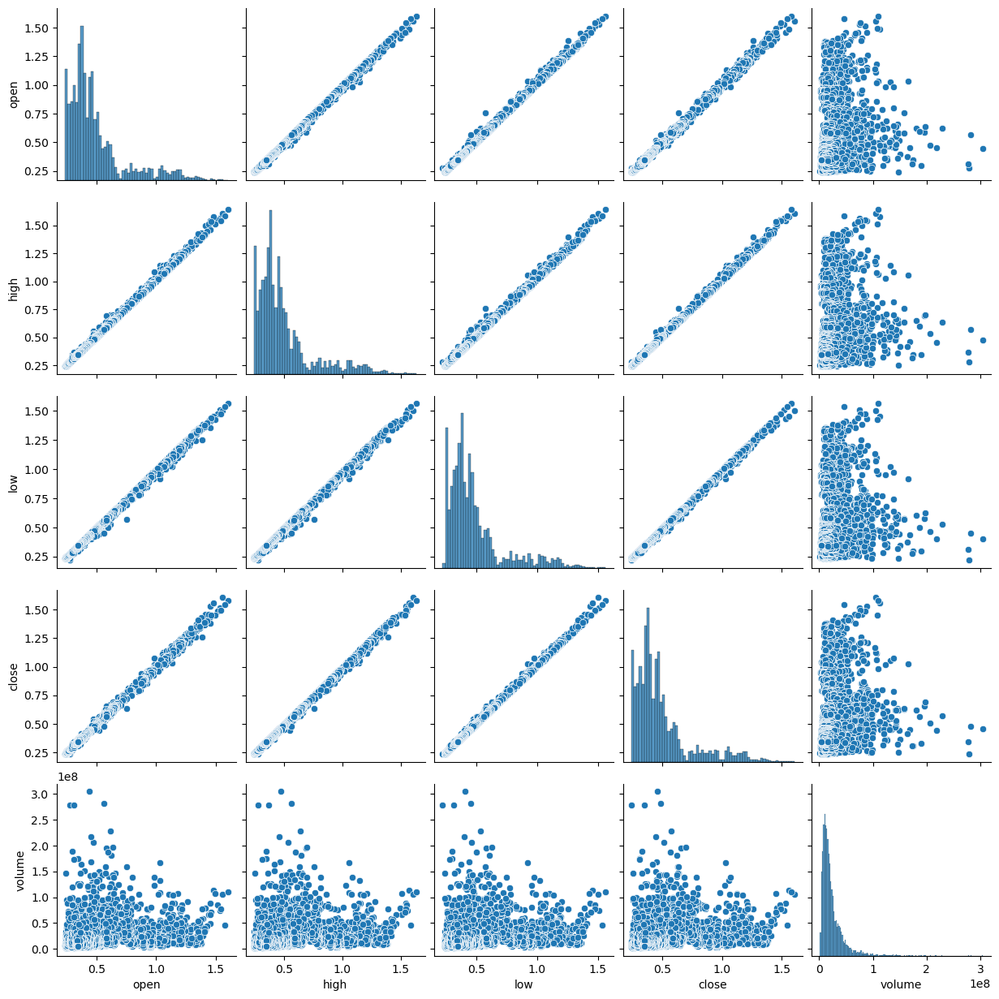

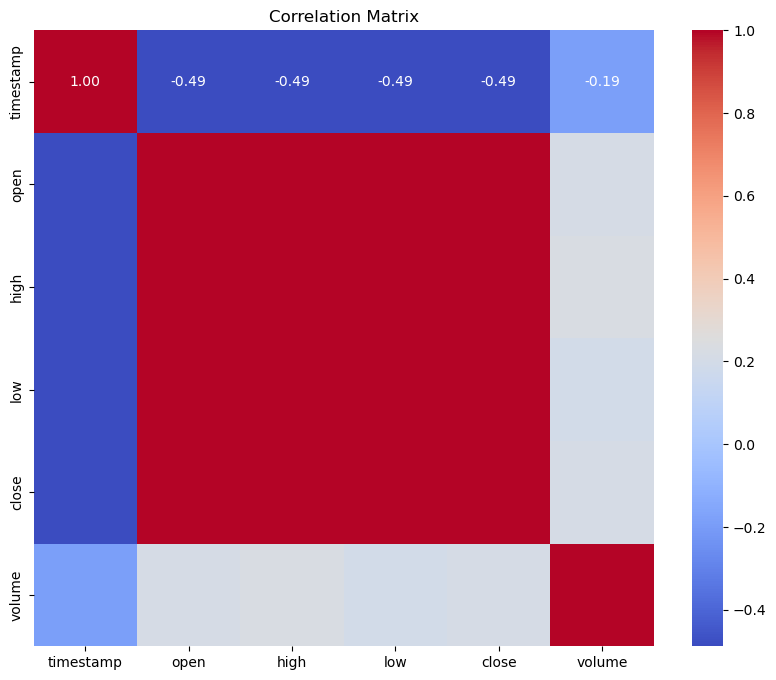

### Step 1: Identifying Data Quality Issues ###
### Data Quality Issues ###
Missing values:
timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###

### Step 2: Cleaning the Data ###

### Step 3: Handling Missing Data ###

### Step 4: Performing EDA ###
                 timestamp         open         high          low  \
count                 5901  5901.000000  5901.000000  5901.000000   
mean   2023-05-07 16:00:00     0.096869     0.098260     0.095404   
min    2022-01-01 00:00:00     0.050330     0.053460     0.049140   
25%    2022-09-03 20:00:00     0.070000     0.070870     0.068990   
50%    2023-05-07 16:00:00     0.082860     0.083900     0.081590   
75%    2024-01-08 12:00:00     0.123510     0.125000     0.121800   
max    2024-09-10 08:00:00     0.227180     0.228880     0.217500   
std                    NaN     0.035004     0.

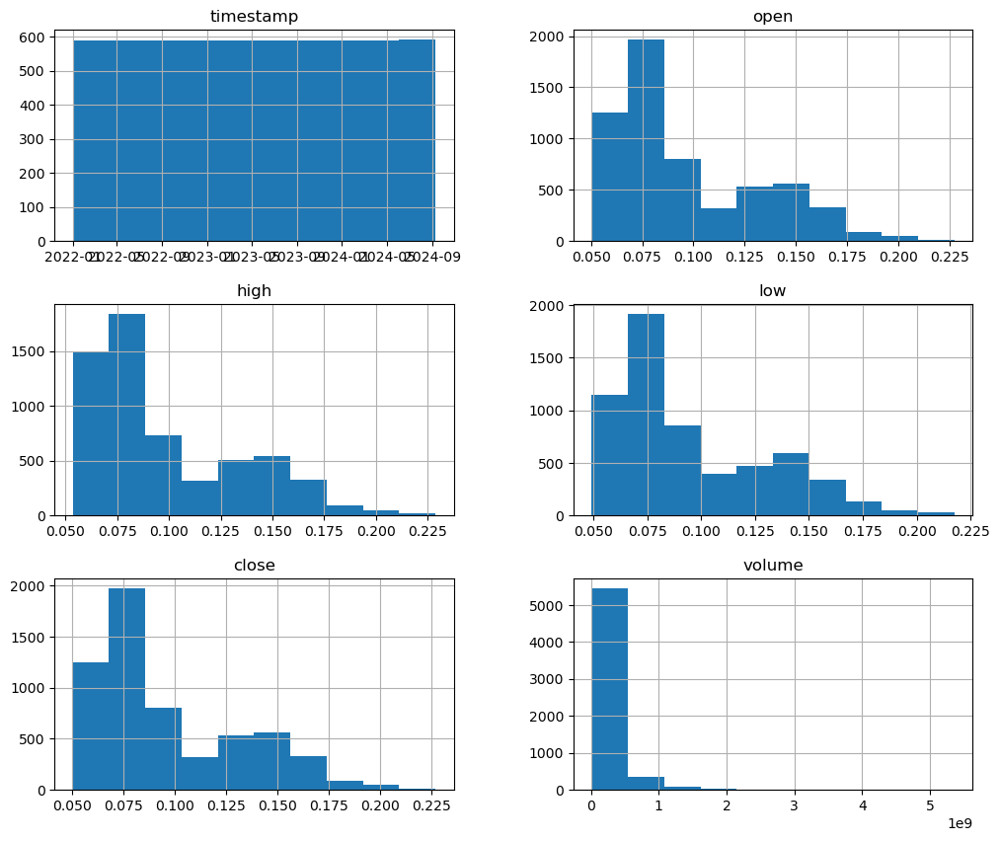

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

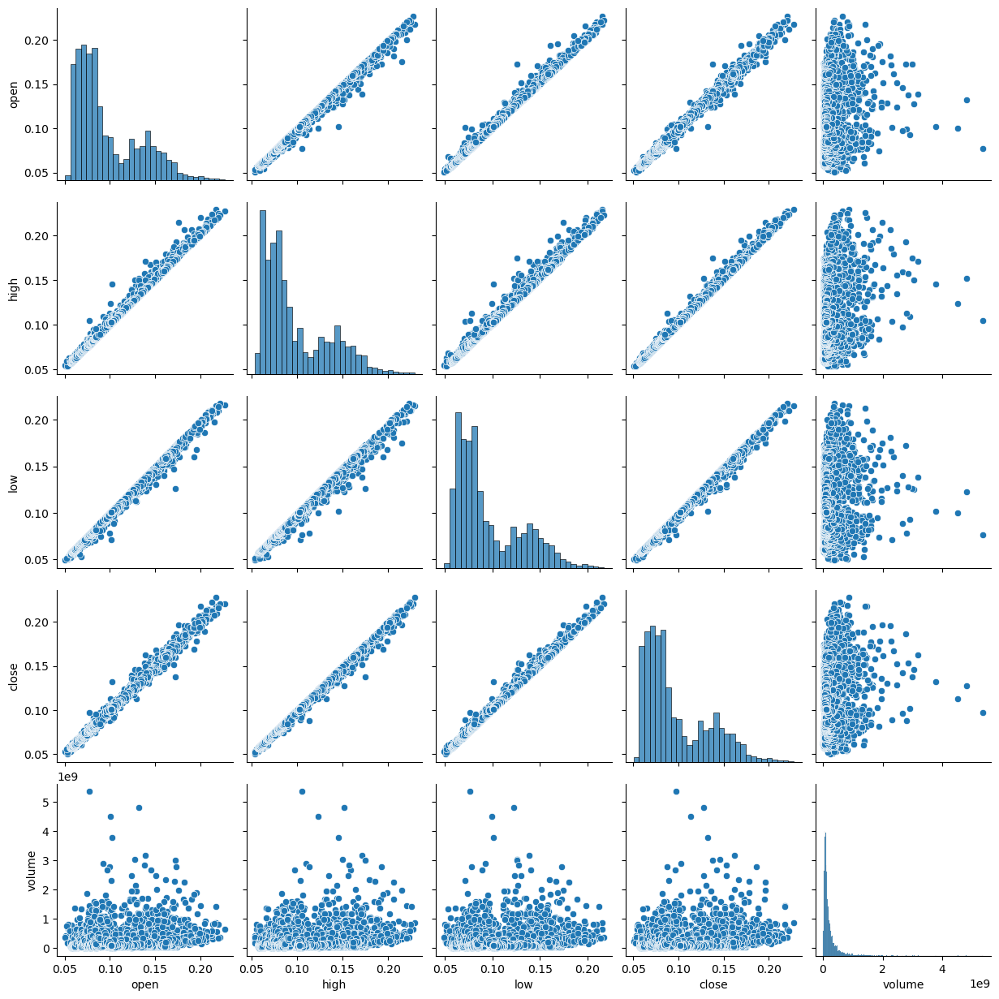

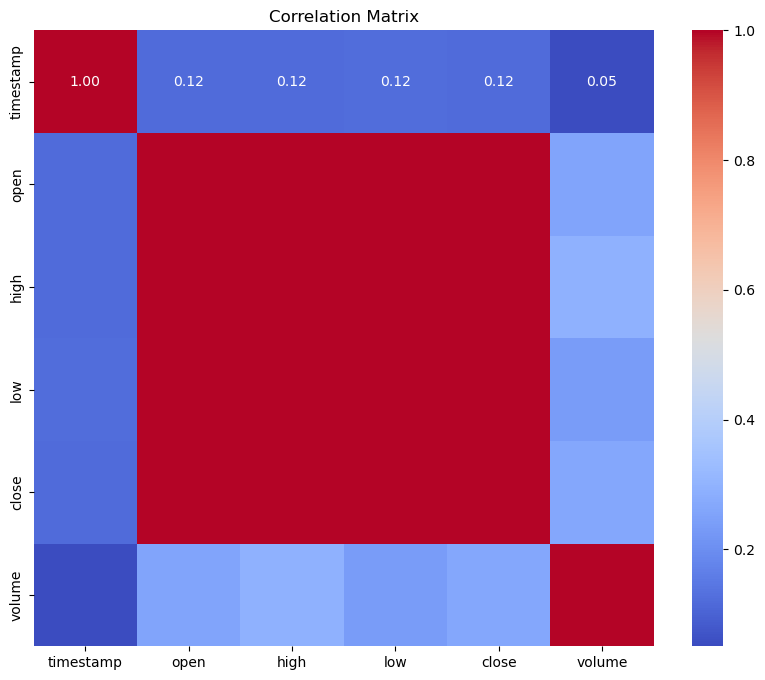

### Step 1: Identifying Data Quality Issues ###
### Data Quality Issues ###
Missing values:
timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###

### Step 2: Cleaning the Data ###

### Step 3: Handling Missing Data ###

### Step 4: Performing EDA ###
                 timestamp         open         high          low  \
count                 5901  5901.000000  5901.000000  5901.000000   
mean   2023-05-07 16:00:00     0.521753     0.527408     0.515487   
min    2022-01-01 00:00:00     0.295600     0.307300     0.287200   
25%    2022-09-03 20:00:00     0.410100     0.413800     0.404600   
50%    2023-05-07 16:00:00     0.509400     0.514000     0.503600   
75%    2024-01-08 12:00:00     0.607400     0.613500     0.598500   
max    2024-09-10 08:00:00     0.898000     0.938000     0.875400   
std                    NaN     0.130213     0.

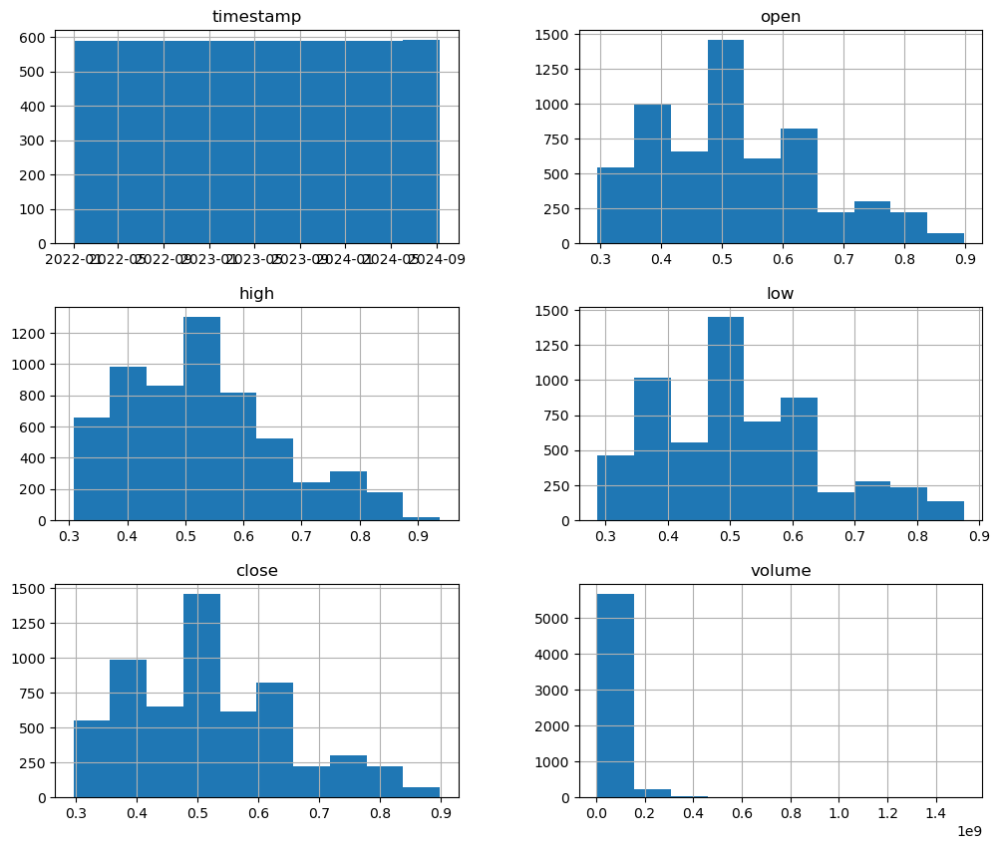

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

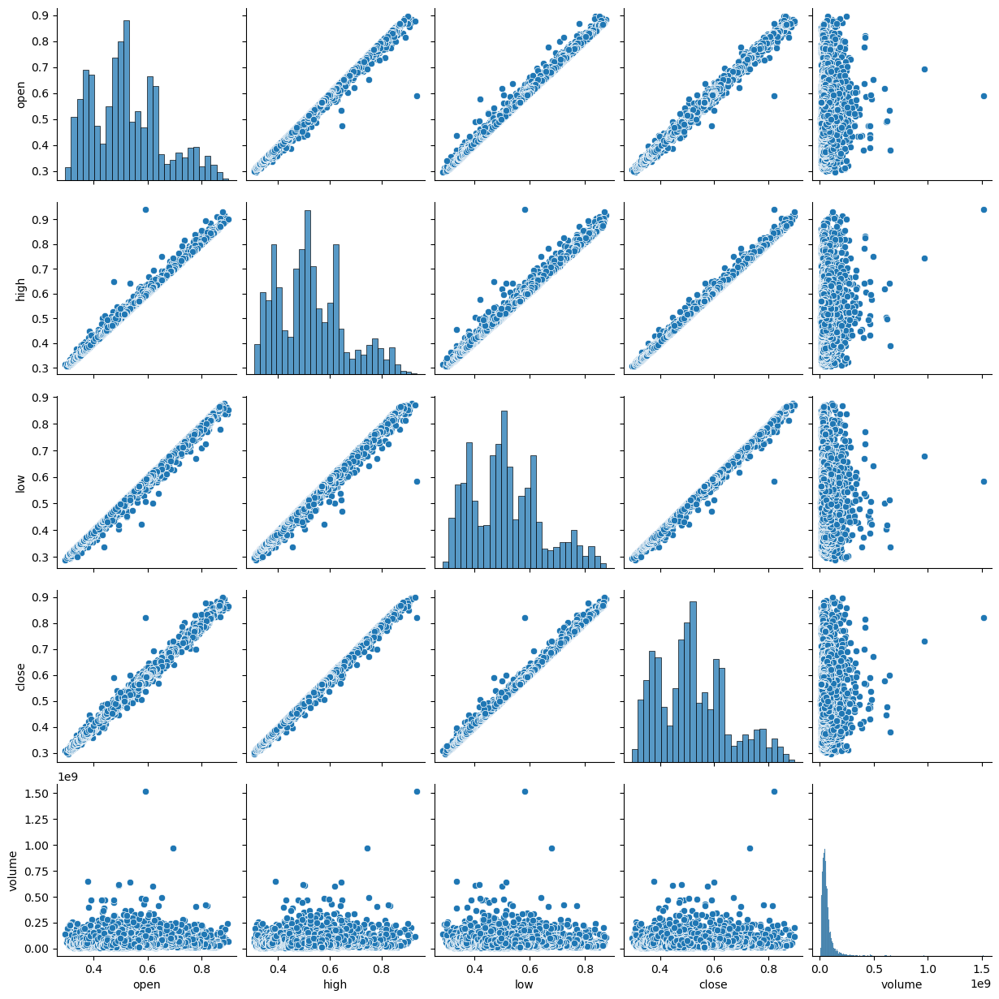

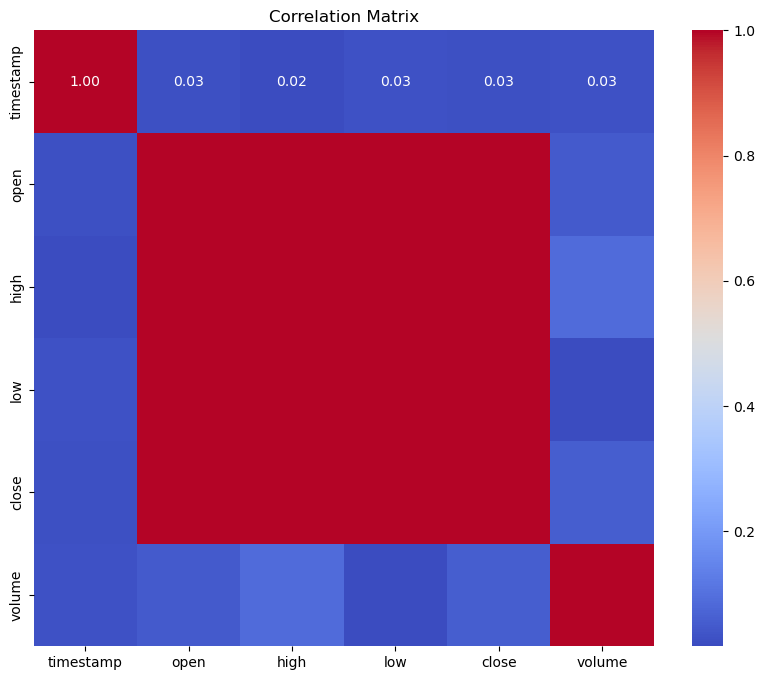

### Step 1: Identifying Data Quality Issues ###
### Data Quality Issues ###
Missing values:
timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###

### Step 2: Cleaning the Data ###

### Step 3: Handling Missing Data ###

### Step 4: Performing EDA ###
                 timestamp         open         high          low  \
count                 5901  5901.000000  5901.000000  5901.000000   
mean   2023-05-07 16:00:00    79.456131    80.333667    78.487402   
min    2022-01-01 00:00:00    42.100000    43.800000    40.300000   
25%    2022-09-03 20:00:00    64.920000    65.500000    64.290000   
50%    2023-05-07 16:00:00    74.940000    75.680000    74.120000   
75%    2024-01-08 12:00:00    90.920000    91.760000    90.090000   
max    2024-09-10 08:00:00   151.500000   153.900000   150.400000   
std                    NaN    20.031286    20.

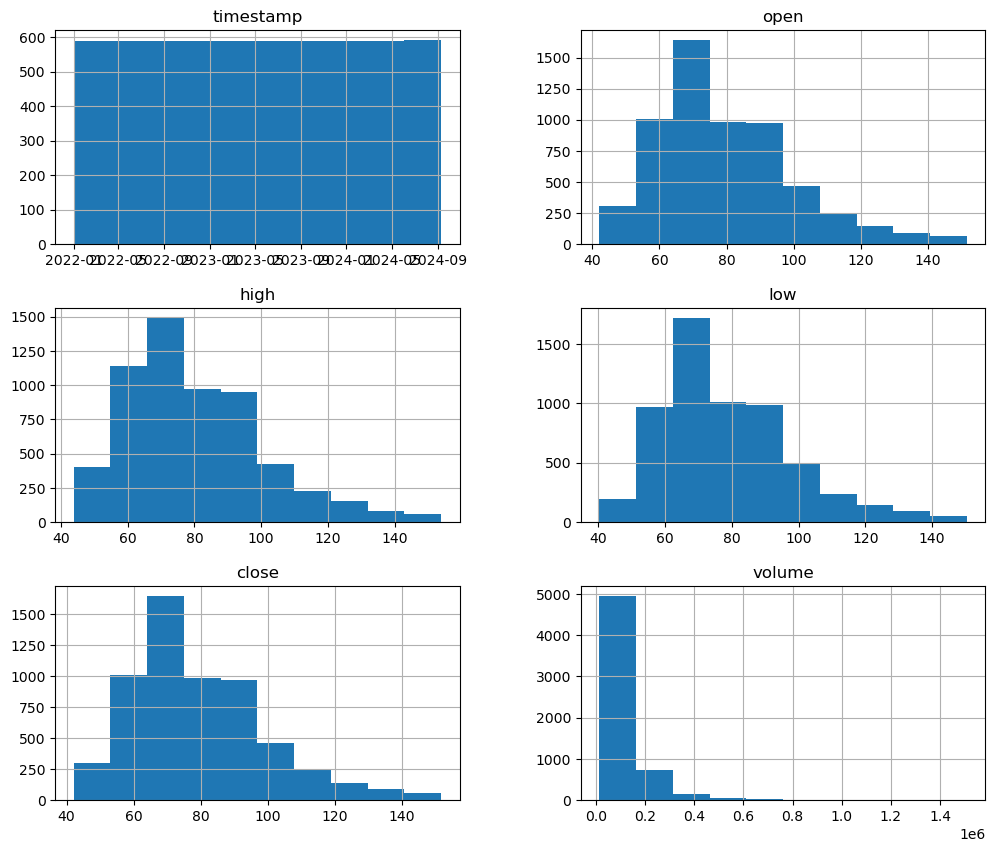

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

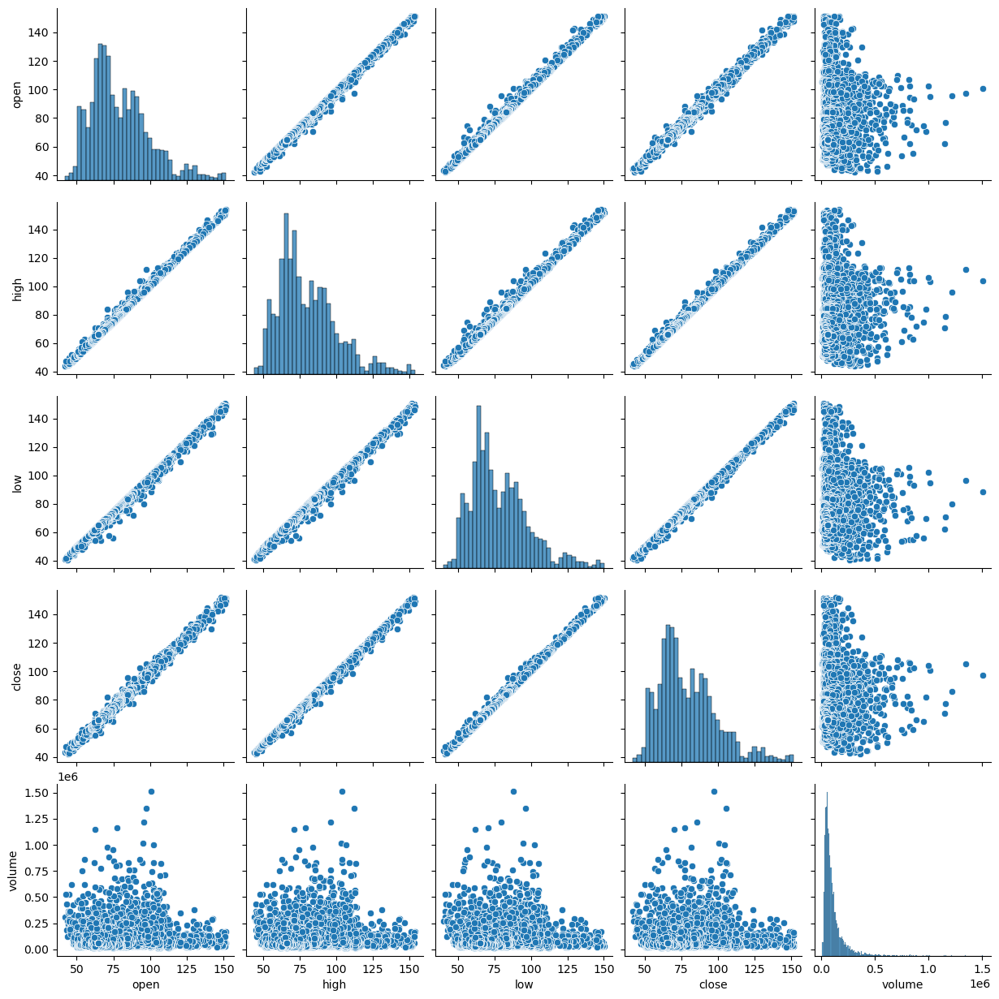

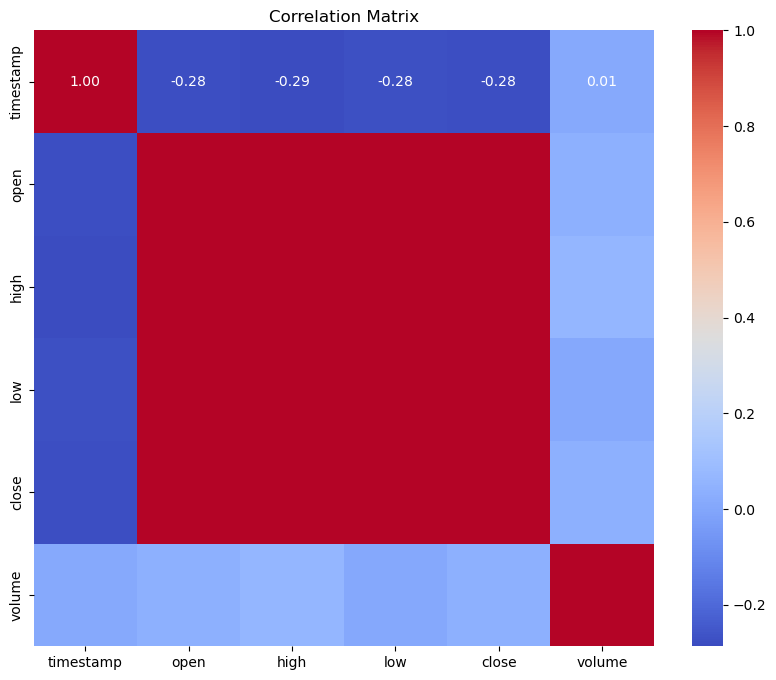

### Step 1: Identifying Data Quality Issues ###
### Data Quality Issues ###
Missing values:
timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###

### Step 2: Cleaning the Data ###

### Step 3: Handling Missing Data ###

### Step 4: Performing EDA ###
                 timestamp         open         high          low  \
count                 5901  5901.000000  5901.000000  5901.000000   
mean   2023-05-07 16:00:00    10.836750    10.986087    10.677265   
min    2022-01-01 00:00:00     5.016000     5.088000     4.761000   
25%    2022-09-03 20:00:00     6.907000     6.985000     6.818000   
50%    2023-05-07 16:00:00     7.970000     8.083000     7.854000   
75%    2024-01-08 12:00:00    14.535000    14.754000    14.313000   
max    2024-09-10 08:00:00    28.270000    28.710000    27.590000   
std                    NaN     4.790528     4.

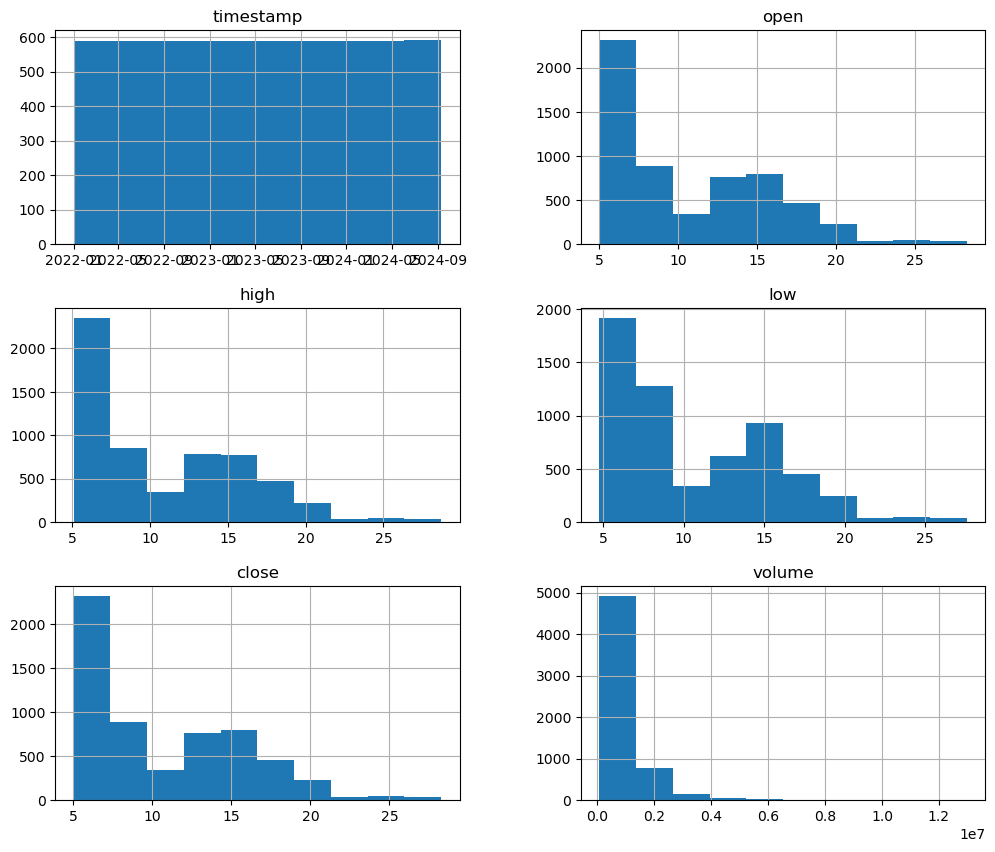

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

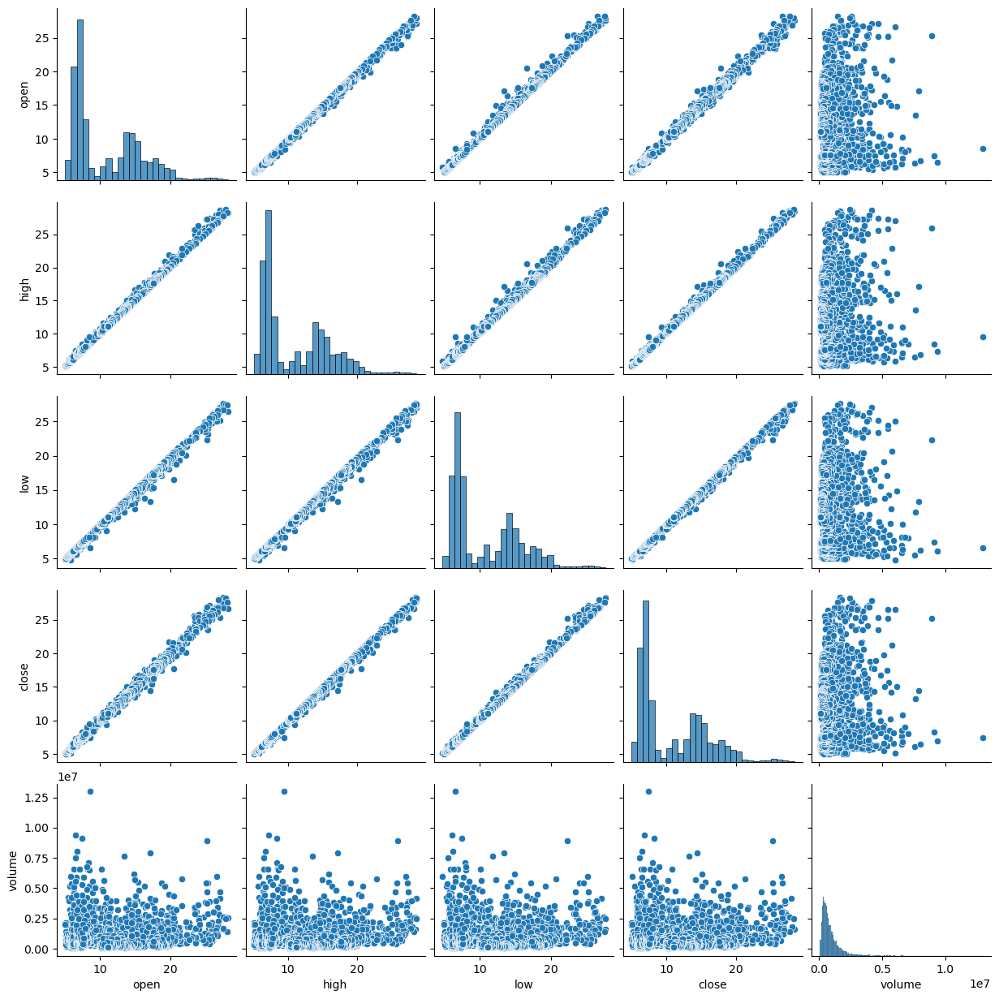

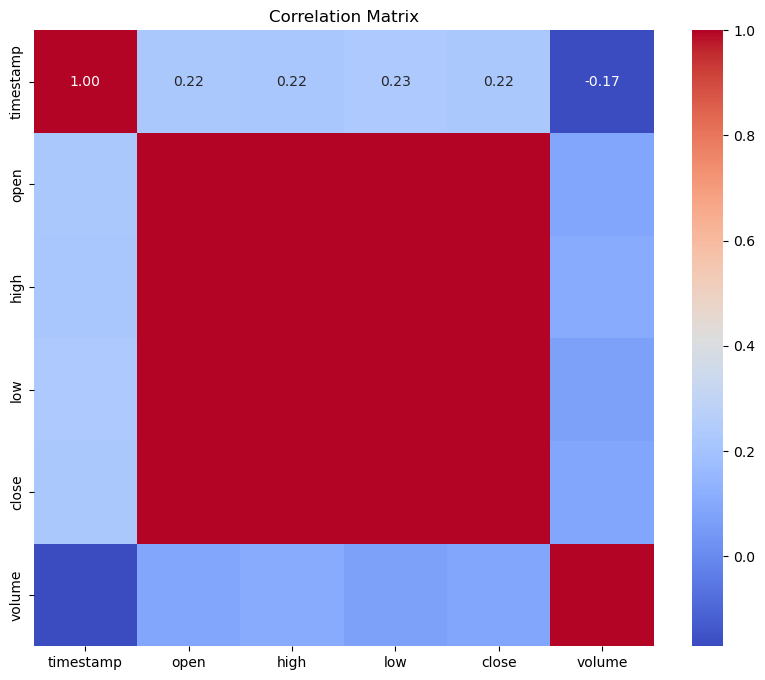

### Step 1: Identifying Data Quality Issues ###
### Data Quality Issues ###
Missing values:
timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###

### Step 2: Cleaning the Data ###

### Step 3: Handling Missing Data ###

### Step 4: Performing EDA ###
                 timestamp         open         high          low  \
count                 5901  5901.000000  5901.000000  5901.000000   
mean   2023-05-07 16:00:00     0.121719     0.123025     0.120299   
min    2022-01-01 00:00:00     0.071000     0.071200     0.070200   
25%    2022-09-03 20:00:00     0.094900     0.095800     0.094000   
50%    2023-05-07 16:00:00     0.112000     0.113100     0.110900   
75%    2024-01-08 12:00:00     0.127700     0.129400     0.126000   
max    2024-09-10 08:00:00     0.292800     0.297600     0.289300   
std                    NaN     0.039390     0.

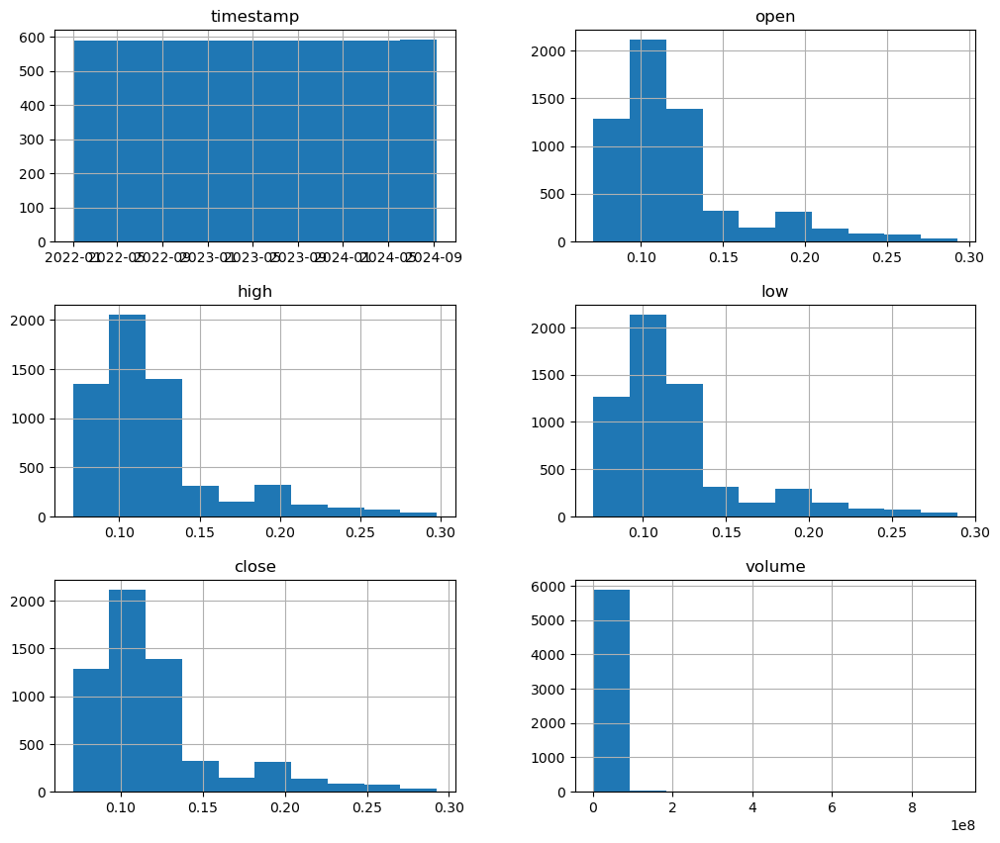

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

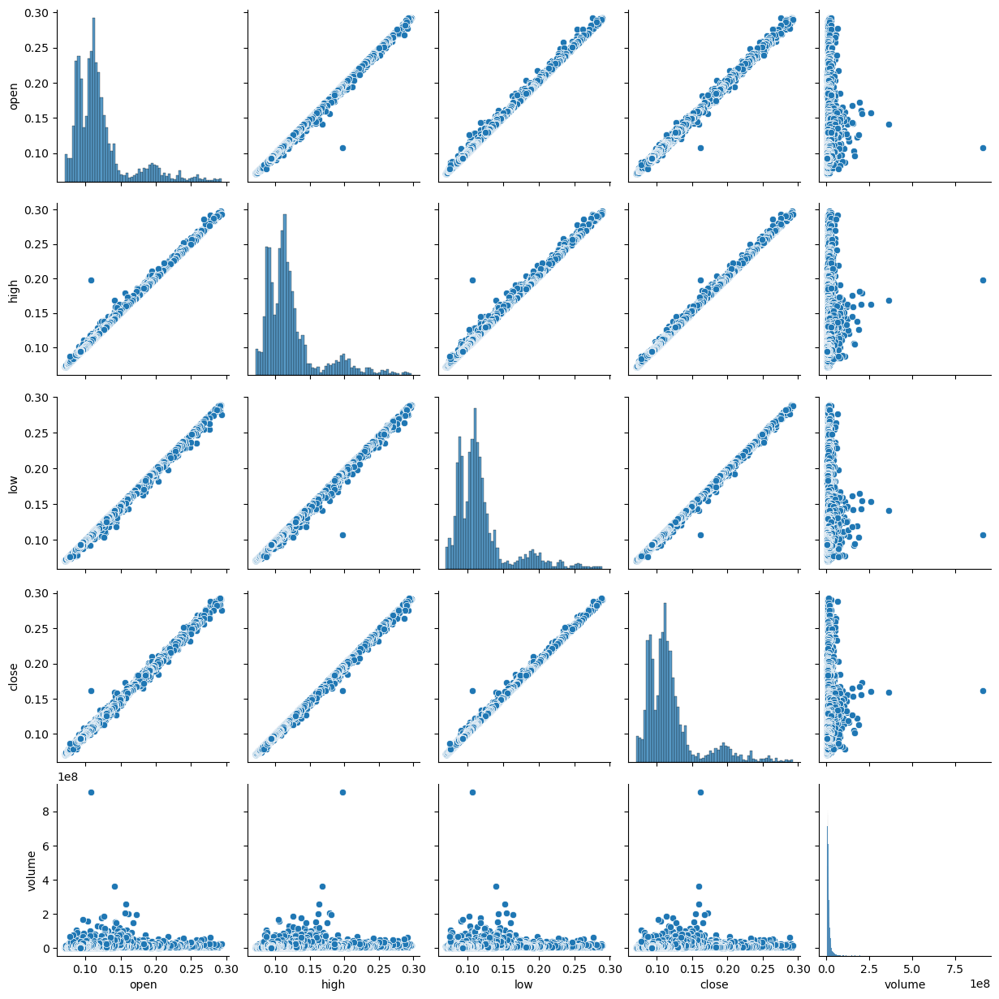

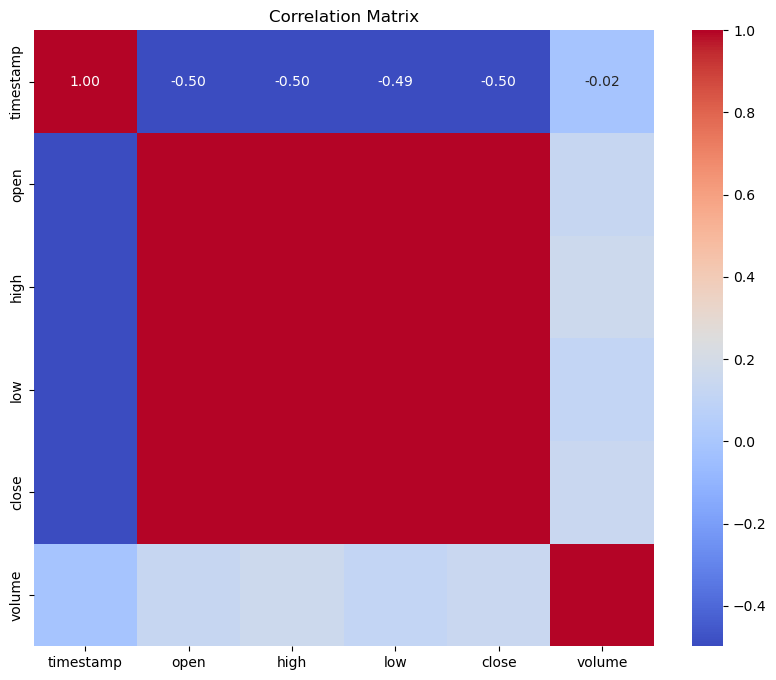


### Step 5: Hypothesis Testing ###
### Correlation Matrix for All Symbols ###


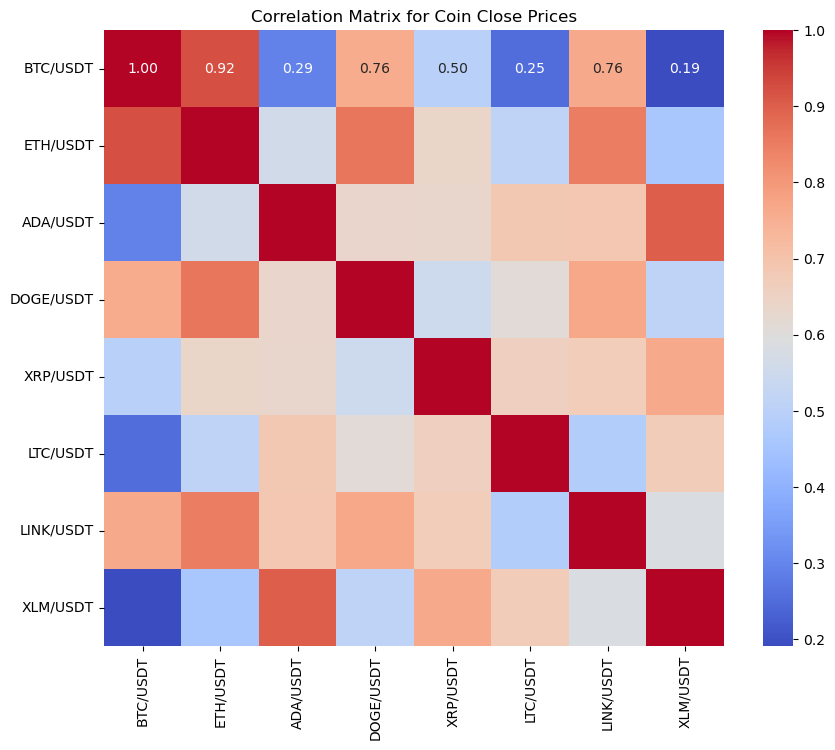

### Testing for BTC/USDT ###
Normality Test on 'close':
Test Statistic: 741.47, p-value: 0.00000
Reject H0: 'close' does not follow a normal distribution (p <= 0.05).

Stationarity Test on 'close':
ADF Statistic: -0.75, p-value: 0.83241
Critical Values: {'1%': -3.431462422474605, '5%': -2.862031586652487, '10%': -2.5670316693827337}
Fail to reject H0: 'close' has a unit root, meaning it's non-stationary (p > 0.05).

### Correlation Tests for BTC/USDT ###
Correlation Test between 'close' and 'close':
Pearson Correlation: 0.92, p-value: 0.00000
Reject H0: Significant correlation exists (p <= 0.05).

Correlation Test between 'close' and 'close':
Pearson Correlation: 0.29, p-value: 0.00000
Reject H0: Significant correlation exists (p <= 0.05).

Correlation Test between 'close' and 'close':
Pearson Correlation: 0.76, p-value: 0.00000
Reject H0: Significant correlation exists (p <= 0.05).

Correlation Test between 'close' and 'close':
Pearson Correlation: 0.50, p-value: 0.00000
Reject H0: Si

In [24]:
final_cleaned_df = data_pipeline(aligned_data_dict, symbol)

In [25]:
# Function to check the number of rows and columns for each symbol's DataFrame
def check_df_shape(data_dict):
    df_shapes = {}
    for symbol, df in aligned_data_dict.items():
        rows, columns = df.shape
        df_shapes[symbol] = {
            'Rows': rows,
            'Columns': columns
        }
    return pd.DataFrame(df_shapes)

# Run the function
df_shapes = check_df_shape(aligned_data_dict)
print(df_shapes)

         BTC/USDT  ETH/USDT  ADA/USDT  DOGE/USDT  XRP/USDT  LTC/USDT  \
Rows         5901      5901      5901       5901      5901      5901   
Columns         6         6         6          6         6         6   

         LINK/USDT  XLM/USDT  
Rows          5901      5901  
Columns          6         6  


**Decomposition of Time Series for All Coins`**

Next, decompose each time series into trend, seasonal, and residual components:

Decomposing time series for BTC/USDT


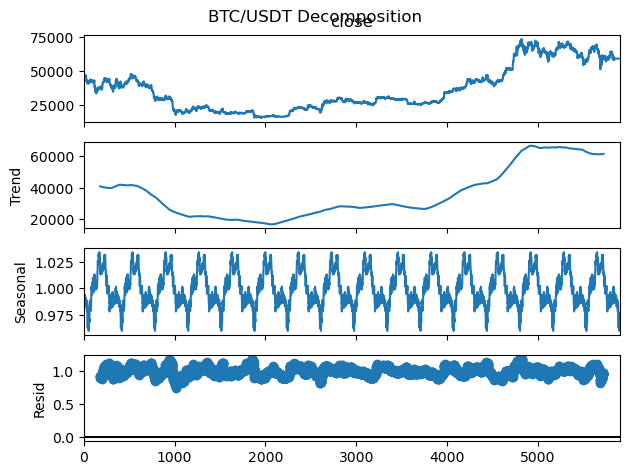

Decomposing time series for ETH/USDT


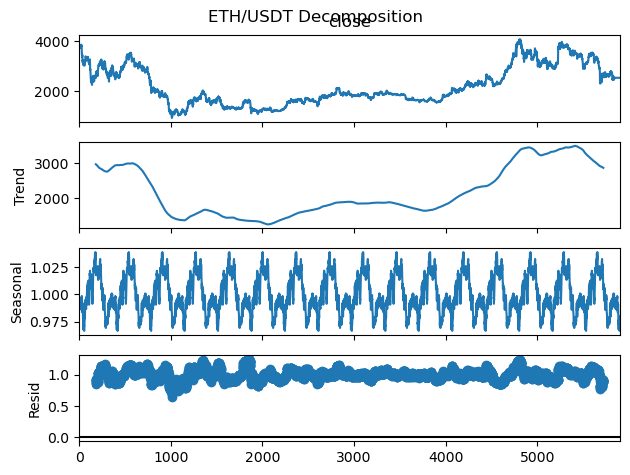

Decomposing time series for ADA/USDT


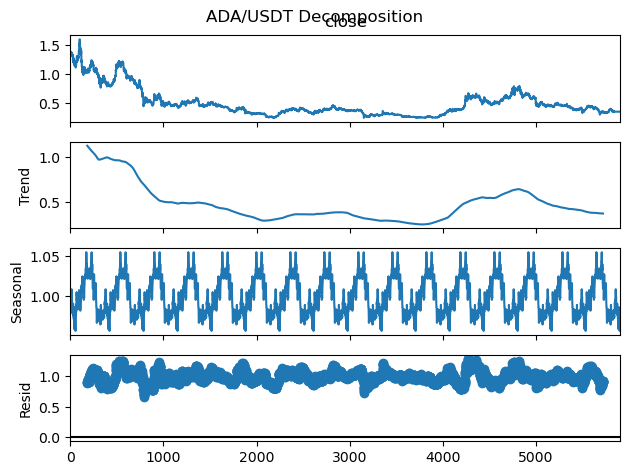

Decomposing time series for DOGE/USDT


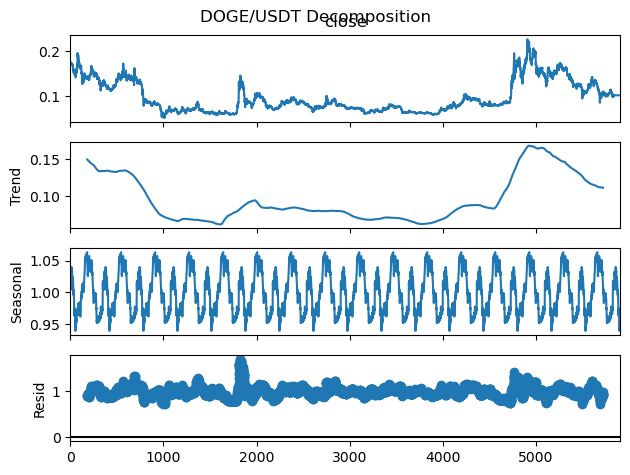

Decomposing time series for XRP/USDT


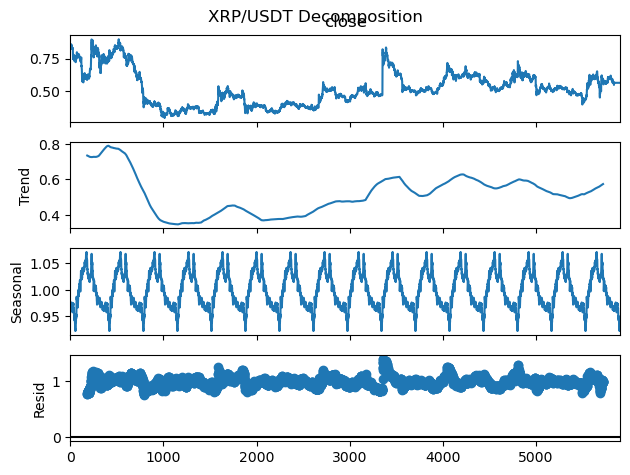

Decomposing time series for LTC/USDT


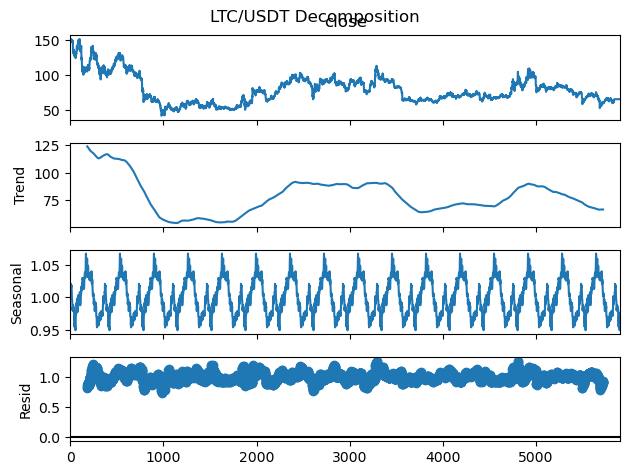

Decomposing time series for LINK/USDT


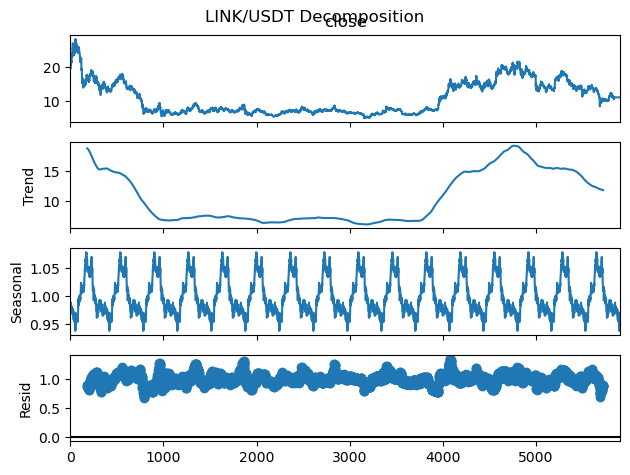

Decomposing time series for XLM/USDT


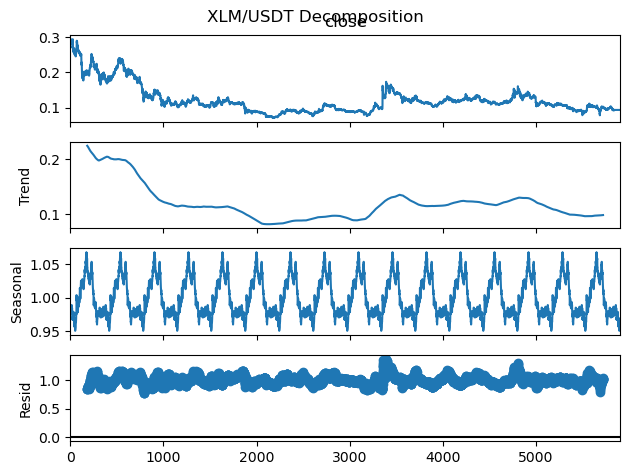

In [26]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

for coin, df in aligned_data_dict.items():
    print(f"Decomposing time series for {coin}")
    result = seasonal_decompose(df['close'], model='multiplicative', period=365)
    result.plot()
    plt.suptitle(f'{coin} Decomposition')
    plt.show()

**Feature Engineering**

We’ll generate technical indicators: Moving Averages, RSI, and Bollinger Bands. These indicators will be useful for both correlation analysis and predictive modeling.

In [39]:
def add_technical_indicators(df):
    """
    Add technical indicators: Moving Averages, RSI, and Bollinger Bands to the DataFrame.
    """
    # Simple Moving Averages
    df['SMA_20'] = df['close'].rolling(window=20).mean()
    df['SMA_50'] = df['close'].rolling(window=50).mean()

    # Exponential Moving Averages
    df['EMA_20'] = df['close'].ewm(span=20, adjust=False).mean()
    df['EMA_50'] = df['close'].ewm(span=50, adjust=False).mean()

    # Relative Strength Index (RSI)
    delta = df['close'].diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['RSI_14'] = 100 - (100 / (1 + rs))

    # Bollinger Bands
    df['BB_middle'] = df['close'].rolling(window=20).mean()
    df['BB_upper'] = df['BB_middle'] + 2 * df['close'].rolling(window=20).std()
    df['BB_lower'] = df['BB_middle'] - 2 * df['close'].rolling(window=20).std()

    return df

In [28]:
# Apply technical indicators to each symbol
for symbol, df in aligned_data_dict.items():
    df = add_technical_indicators(df)
    aligned_data_dict[symbol] = df

In [40]:
# Function to check the number of rows and columns for each symbol's DataFrame
def check_df_shape(aligned_data_dict):
    df_shapes = {}
    for symbol, df in aligned_data_dict.items():
        rows, columns = df.shape
        df_shapes[symbol] = {
            'Rows': rows,
            'Columns': columns
        }
    return pd.DataFrame(df_shapes)

# Run the function
df_shapes = check_df_shape(aligned_data_dict)
print(df_shapes)

         BTC/USDT  ETH/USDT  ADA/USDT  DOGE/USDT  XRP/USDT  LTC/USDT  \
Rows         5900      5900      5900       5900      5900      5900   
Columns        15        15        15         15        15        15   

         LINK/USDT  XLM/USDT  
Rows          5900      5900  
Columns         15        15  


In [30]:
# Display the first few rows of BTC/USDT with technical indicators
print(aligned_data_dict['BTC/USDT'].head())

            timestamp      open      high       low     close      volume  \
0 2022-01-01 00:00:00  46216.93  46949.99  46208.37  46813.20  3495.20465   
1 2022-01-01 04:00:00  46813.21  47555.55  46591.23  47194.73  3522.79888   
2 2022-01-01 08:00:00  47194.73  47344.69  46715.39  46758.87  2729.67811   
3 2022-01-01 12:00:00  46758.87  47491.14  46756.30  47219.04  3055.90946   
4 2022-01-01 16:00:00  47219.04  47954.63  47186.07  47329.78  4061.67681   

   SMA_20  SMA_50        EMA_20        EMA_50  RSI_14  BB_middle  BB_upper  \
0     NaN     NaN  46813.200000  46813.200000     NaN        NaN       NaN   
1     NaN     NaN  46849.536190  46828.161961     NaN        NaN       NaN   
2     NaN     NaN  46840.901315  46825.444629     NaN        NaN       NaN   
3     NaN     NaN  46876.914523  46840.879742     NaN        NaN       NaN   
4     NaN     NaN  46920.044569  46860.052301     NaN        NaN       NaN   

   BB_lower  
0       NaN  
1       NaN  
2       NaN  
3       NaN 

In [31]:
# Loop through each symbol in the aligned_data_dict and apply the functions
for symbol, df in aligned_data_dict.items():
    
    print(f"Processing {symbol}...")

    # Step 1: Identify and summarize data quality issues for the current DataFrame
    print(f"Data Quality Issues for {symbol}:")
    identify_data_quality_issues(df)
    
    # Step 2: Clean the data by addressing all identified data quality issues
    cleaned_df = comprehensive_data_cleaning(df)
    print(f"Data Cleaning Completed for {symbol}.")

    # Step 3: Impute missing values in the cleaned DataFrame
    df_imputed = impute_missing_values(cleaned_df)
    print(f"Missing Data Imputation Completed for {symbol}.")
    
    # Store the cleaned and imputed DataFrame back into aligned_data_dict
    aligned_data_dict[symbol] = df_imputed

    print(f"Completed processing for {symbol}.\n")

Processing BTC/USDT...
Data Quality Issues for BTC/USDT:
### Data Quality Issues ###
Missing values:
timestamp     0
open          0
high          0
low           0
close         0
volume        0
SMA_20       19
SMA_50       49
EMA_20        0
EMA_50        0
RSI_14       62
BB_middle    19
BB_upper     19
BB_lower     19
dtype: int64

Impact: Missing values can distort model training or affect accuracy. Imputation or removal is needed.
Duplicate rows: 0

Irrelevant columns (constant values): []

### Data Quality Summary Completed ###
Data Cleaning Completed for BTC/USDT.
Missing Data Imputation Completed for BTC/USDT.
Completed processing for BTC/USDT.

Processing ETH/USDT...
Data Quality Issues for ETH/USDT:
### Data Quality Issues ###
Missing values:
timestamp     0
open          0
high          0
low           0
close         0
volume        0
SMA_20       19
SMA_50       49
EMA_20        0
EMA_50        0
RSI_14       62
BB_middle    19
BB_upper     19
BB_lower     19
dtype: int6

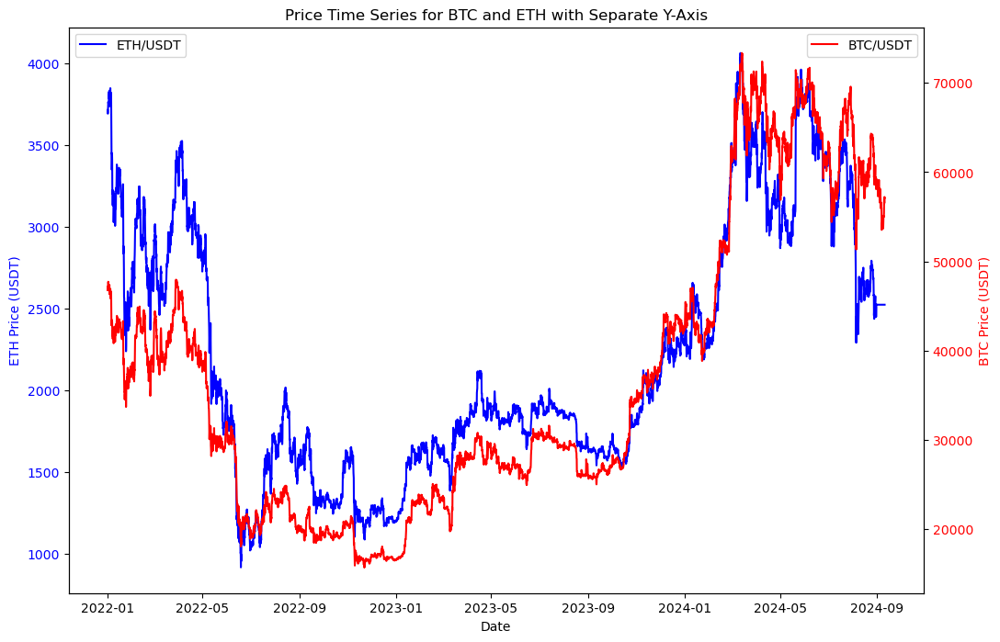

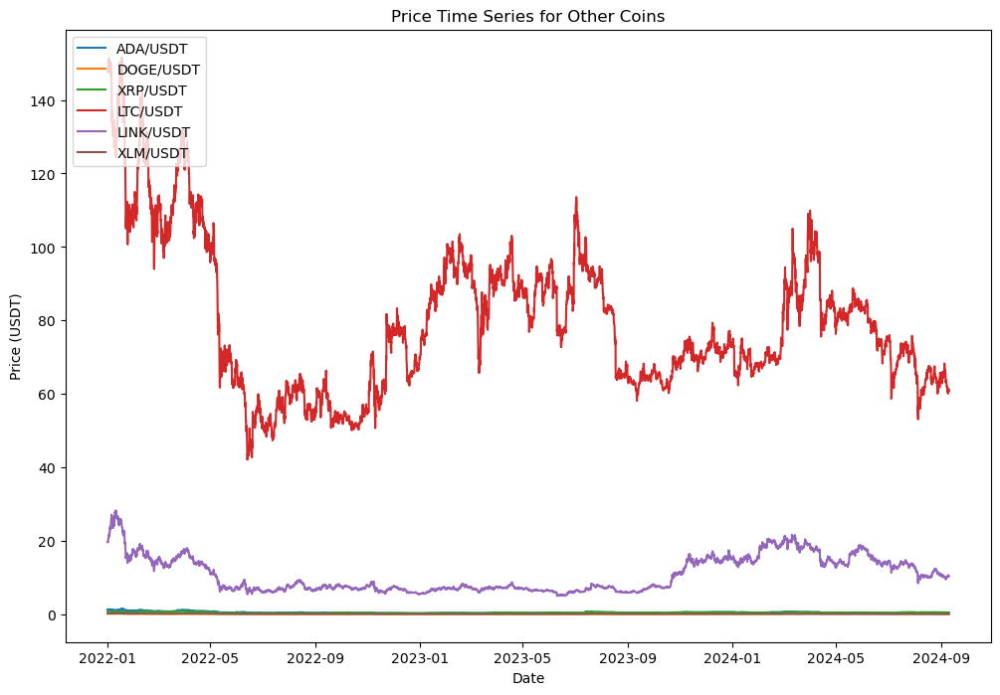

In [41]:
import matplotlib.pyplot as plt

# Step 1: Create the first plot for BTC and ETH
fig, ax1 = plt.subplots(figsize=(12, 8))

# Plot ETH on the first y-axis
eth_df = aligned_data_dict['ETH/USDT']
ax1.plot(eth_df['timestamp'], eth_df['close'], label='ETH/USDT', color='blue')

# Label the first y-axis for ETH
ax1.set_xlabel('Date')
ax1.set_ylabel('ETH Price (USDT)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis for BTC
ax2 = ax1.twinx()

# Plot BTC on the second y-axis
btc_df = data_dict['BTC/USDT']
ax2.plot(btc_df['timestamp'], btc_df['close'], label='BTC/USDT', color='red')

# Label the second y-axis for BTC
ax2.set_ylabel('BTC Price (USDT)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add legends for both axes
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Price Time Series for BTC and ETH with Separate Y-Axis')
plt.show()

# Step 2: Create the second plot for the other coins
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the remaining coins except BTC and ETH
for symbol in data_dict:
    if symbol not in ['BTC/USDT', 'ETH/USDT']:
        df = data_dict[symbol]
        ax.plot(df['timestamp'], df['close'], label=symbol)

# Label the x and y axes
ax.set_xlabel('Date')
ax.set_ylabel('Price (USDT)')
ax.tick_params(axis='y')

# Add legend
ax.legend(loc='upper left')

plt.title('Price Time Series for Other Coins')
plt.show()




**Log Returns:**

Calculate and visualize the log returns to analyze the rate of change of prices.

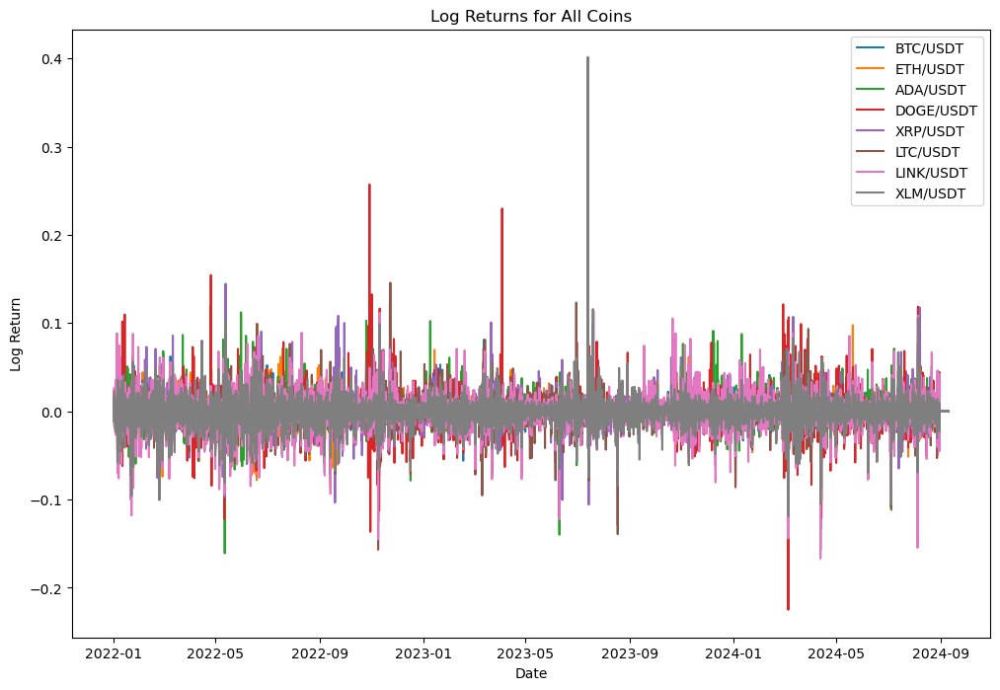

In [42]:
# Step 2.3: Calculate log returns for each symbol
def calculate_log_returns(df):
    df['log_return'] = np.log(df['close'] / df['close'].shift(1))
    df.dropna(inplace=True)
    return df

# Calculate log returns for all symbols
for symbol in aligned_data_dict:
    aligned_data_dict[symbol] = calculate_log_returns(aligned_data_dict[symbol])

# Plot the log returns
plt.figure(figsize=(12, 8))

for symbol, df in aligned_data_dict.items():
    plt.plot(df['timestamp'], df['log_return'], label=symbol)

plt.title('Log Returns for All Coins')
plt.xlabel('Date')
plt.ylabel('Log Return')
plt.legend()
plt.show()


**Correlation Matrix:**

Analyze the correlation between the log returns of the different coins to understand how they move in relation to one another.

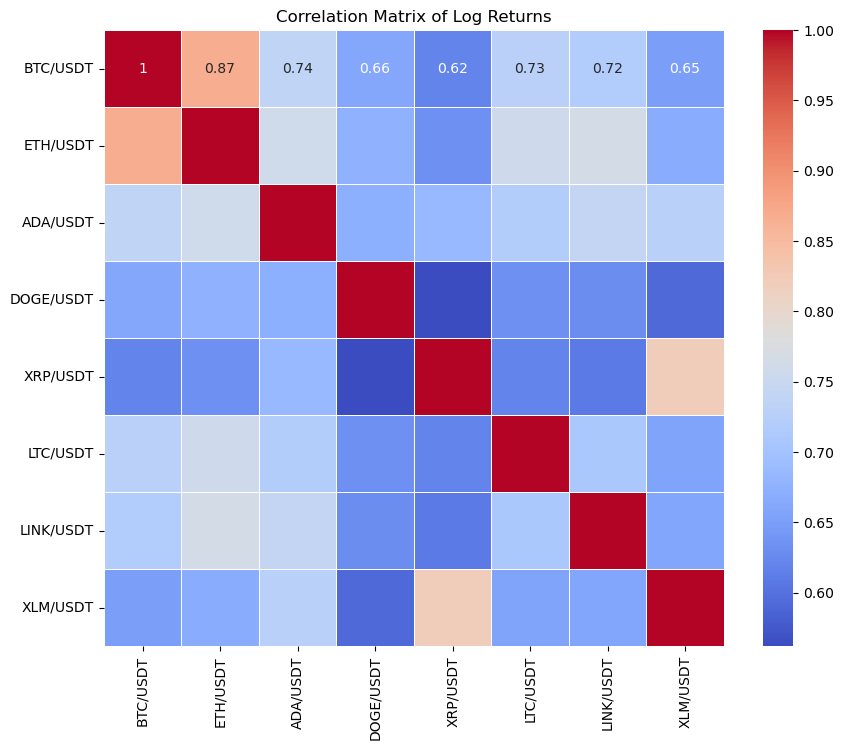

In [44]:
# Step 2.4: Create a DataFrame of log returns for correlation analysis
log_returns_df = pd.DataFrame()

for symbol, df in aligned_data_dict.items():
    log_returns_df[symbol] = df.set_index('timestamp')['log_return']

# Drop any remaining NaN values (due to shifting)
log_returns_df.dropna(inplace=True)

# Calculate the correlation matrix
correlation_matrix = log_returns_df.corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Log Returns')
plt.show()


**Handling Outliers**

You can identify outliers in the log returns (or price data) using visualization techniques like box plots or z-scores.

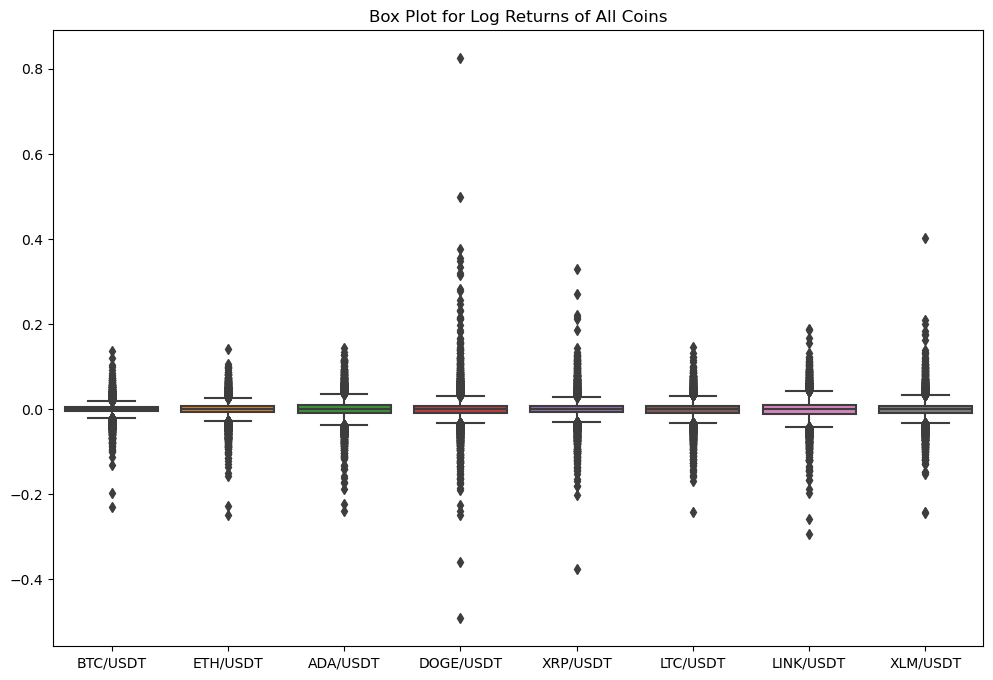

In [ ]:
# Step 3: Identifying Outliers using Box Plot for Log Returns
plt.figure(figsize=(12, 8))
sns.boxplot(data=log_returns_df)
plt.title('Box Plot for Log Returns of All Coins')
plt.show()

# Optionally, remove outliers based on z-scores or a defined threshold.


**Decomposition of Time Series for All Coins`**
Next, decompose each time series into trend, seasonal, and residual components:

Decomposing time series for BTC/USDT


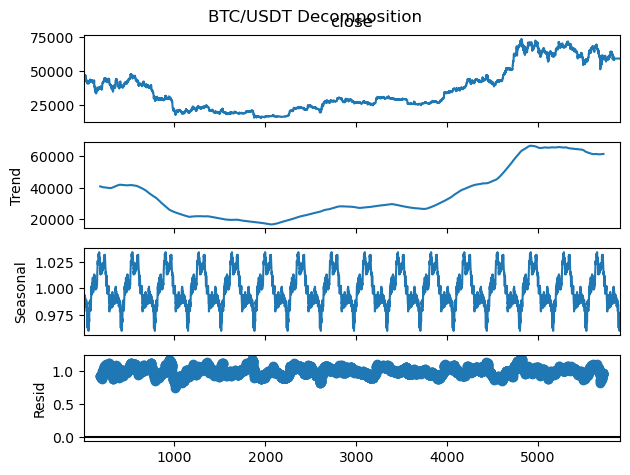

Decomposing time series for ETH/USDT


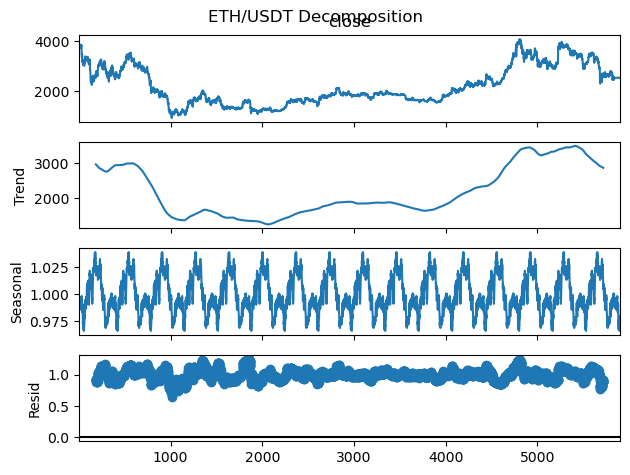

Decomposing time series for ADA/USDT


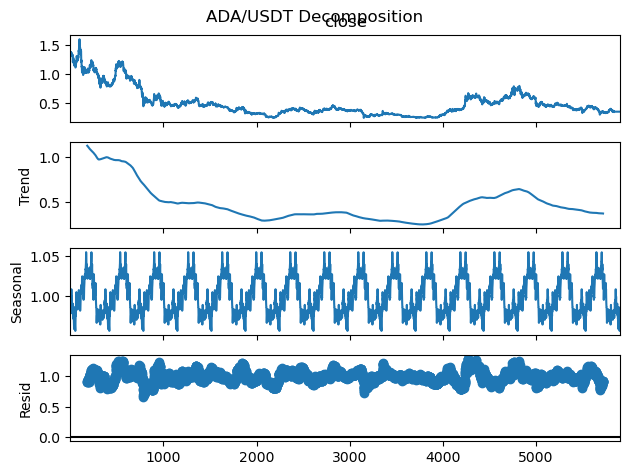

Decomposing time series for DOGE/USDT


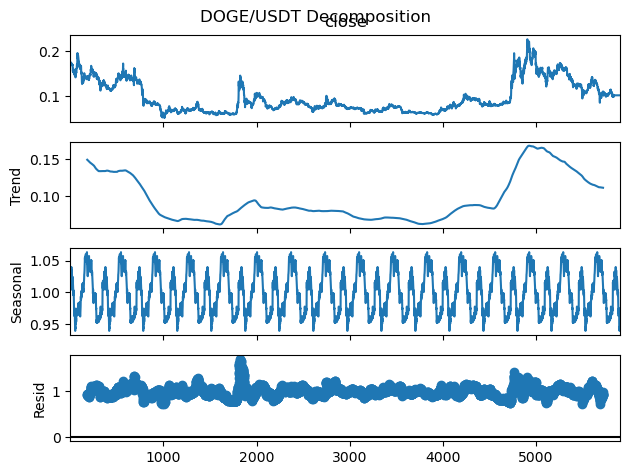

Decomposing time series for XRP/USDT


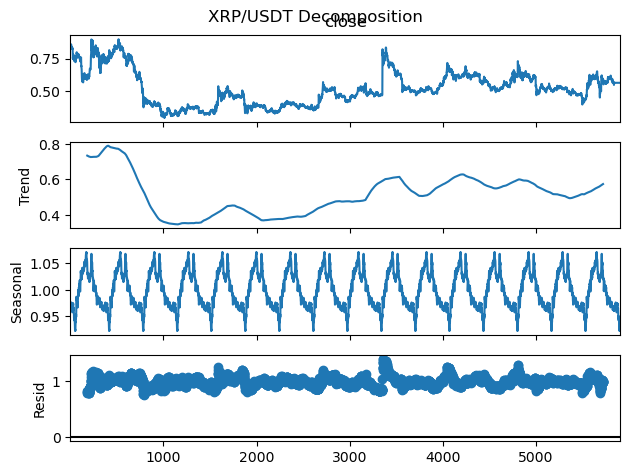

Decomposing time series for LTC/USDT


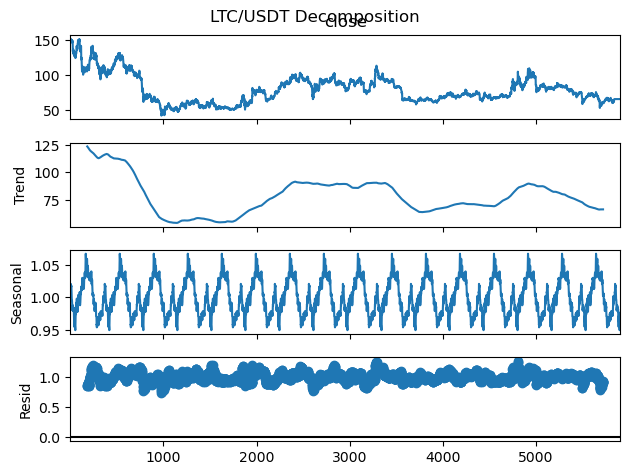

Decomposing time series for LINK/USDT


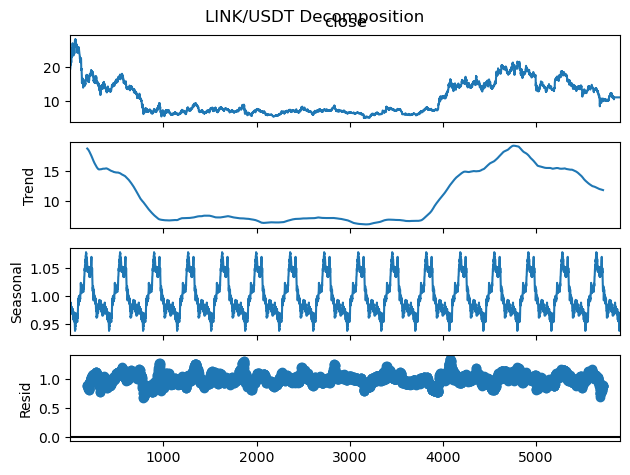

Decomposing time series for XLM/USDT


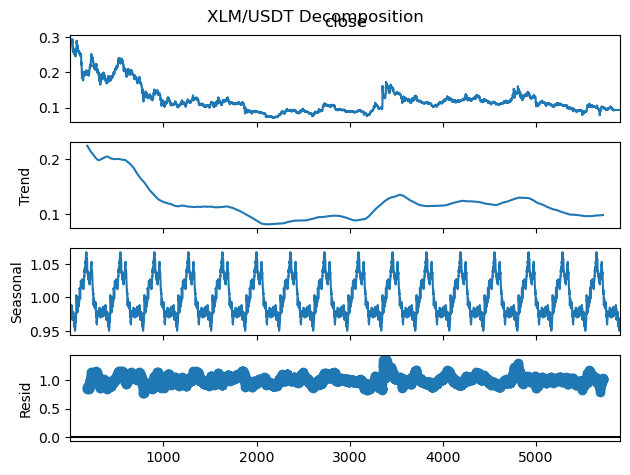

In [48]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

for coin, df in aligned_data_dict.items():
    print(f"Decomposing time series for {coin}")
    result = seasonal_decompose(df['close'], model='multiplicative', period=365)
    result.plot()
    plt.suptitle(f'{coin} Decomposition')
    plt.show()


**Feature Engineering**

We’ll generate technical indicators: Moving Averages, RSI, and Bollinger Bands. These indicators will be useful for both correlation analysis and predictive modeling.

In [50]:
aligned_data_dict

{'BTC/USDT':                timestamp      open      high       low     close      volume  \
 2    2022-01-01 08:00:00  47194.73  47344.69  46715.39  46758.87  2729.67811   
 3    2022-01-01 12:00:00  46758.87  47491.14  46756.30  47219.04  3055.90946   
 4    2022-01-01 16:00:00  47219.04  47954.63  47186.07  47329.78  4061.67681   
 5    2022-01-01 20:00:00  47329.79  47814.00  47222.22  47722.65  2739.19534   
 6    2022-01-02 00:00:00  47722.66  47750.00  47269.47  47329.47  2387.90724   
 ...                  ...       ...       ...       ...       ...         ...   
 5896 2024-09-09 16:00:00  59123.99  59462.38  59070.40  59232.01  1647.80492   
 5897 2024-09-09 20:00:00  59123.99  59462.38  59070.40  59232.01  1647.80492   
 5898 2024-09-10 00:00:00  59123.99  59462.38  59070.40  59232.01  1647.80492   
 5899 2024-09-10 04:00:00  59123.99  59462.38  59070.40  59232.01  1647.80492   
 5900 2024-09-10 08:00:00  59123.99  59462.38  59070.40  59232.01  1647.80492   
 
          SMA_

In [51]:
# Function to check the number of rows and columns for each symbol's DataFrame
def check_df_shape(aligned_data_dict):
    df_shapes = {}
    for symbol, df in aligned_data_dict.items():
        rows, columns = df.shape
        df_shapes[symbol] = {
            'Rows': rows,
            'Columns': columns
        }
    return pd.DataFrame(df_shapes)

# Run the function
df_shapes = check_df_shape(aligned_data_dict)
print(df_shapes)

         BTC/USDT  ETH/USDT  ADA/USDT  DOGE/USDT  XRP/USDT  LTC/USDT  \
Rows         5899      5899      5899       5899      5899      5899   
Columns        15        15        15         15        15        15   

         LINK/USDT  XLM/USDT  
Rows          5899      5899  
Columns         15        15  


In [52]:
# Display the first few rows of BTC/USDT with technical indicators
print(aligned_data_dict['BTC/USDT'].head())

            timestamp      open      high       low     close      volume  \
2 2022-01-01 08:00:00  47194.73  47344.69  46715.39  46758.87  2729.67811   
3 2022-01-01 12:00:00  46758.87  47491.14  46756.30  47219.04  3055.90946   
4 2022-01-01 16:00:00  47219.04  47954.63  47186.07  47329.78  4061.67681   
5 2022-01-01 20:00:00  47329.79  47814.00  47222.22  47722.65  2739.19534   
6 2022-01-02 00:00:00  47722.66  47750.00  47269.47  47329.47  2387.90724   

      SMA_20      SMA_50        EMA_20        EMA_50     RSI_14  BB_middle  \
2  46994.859  44831.4796  46840.901315  46825.444629  52.933338  46994.859   
3  46994.859  44831.4796  46876.914523  46840.879742  52.933338  46994.859   
4  46994.859  44831.4796  46920.044569  46860.052301  52.933338  46994.859   
5  46994.859  44831.4796  46996.483181  46893.879661  52.933338  46994.859   
6  46994.859  44831.4796  47028.196212  46910.961636  52.933338  46994.859   

       BB_upper      BB_lower  log_return  
2  47773.736693  46215.9

**Normalization/Scaling**

To use machine learning models later, normalize or scale the features to ensure that all features contribute equally to the model.

In [54]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Function to create lagged features (useful for many time series models)
def create_lagged_features(data, n_lags=4):
    df = pd.DataFrame(data, columns=['close'])
    for lag in range(1, n_lags + 1):
        df[f'lag_{lag}'] = df['close'].shift(lag)
    df.dropna(inplace=True)  # Drop rows with NaN values after lag creation
    return df

# Dictionary to store processed data for all symbols
processed_data = {}

# Iterate over all symbols in data_dict
for symbol, df in aligned_data_dict.items():
    print(f"Processing {symbol}")

    # Ensure 'close' column exists
    if 'close' not in df.columns:
        print(f"Warning: 'close' column missing for {symbol}")
        continue
    
    # Extract the close price and reshape it to (n_samples, 1)
    price_data = df['close'].values.reshape(-1, 1)
    
    # 1. Normalize the close price data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(price_data)
    
    # 2. Create lagged features after normalization
    lagged_df = create_lagged_features(scaled_data, n_lags=3)  # Create 3 lagged features
    
    # Split the data into X (features) and y (target)
    X = lagged_df.drop(columns=['close']).values  # Lagged features
    y = lagged_df['close'].values  # Target is the original 'close' price
    
    # 3. Split the data into training and test sets (80% training, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # 4. Store the processed data and the scaler for inverse transformation later
    processed_data[symbol] = {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'scaler': scaler  # Store the scaler for inverse scaling predictions later
    }

print("Data processing complete for all symbols.")

Processing BTC/USDT
Processing ETH/USDT
Processing ADA/USDT
Processing DOGE/USDT
Processing XRP/USDT
Processing LTC/USDT
Processing LINK/USDT
Processing XLM/USDT
Data processing complete for all symbols.


**Correlation Analysis**

We will analyze the correlation between the different cryptocurrencies to identify how closely their price movements are related. This is important because it helps in understanding market behavior and can be used to inform trading strategies.

1. Combine Data: Merge the preprocessed data for all cryptocurrencies into a single DataFrame.
2. Calculate Correlation Matrix: Compute the correlation matrix to identify relationships between the cryptocurrencies.
3. Visualize the Correlation Matrix on heatmaps to visualize the correlations.

**Combine Data**
We'll combine the closing prices of all cryptocurrencies into a single DataFrame. This allows us to calculate correlations across different assets.

In [55]:
# Combine the closing prices of all symbols into a single DataFrame
combined_df = pd.DataFrame()

for symbol, df in aligned_data_dict.items():
    combined_df[symbol] = df['close']

# Set the index to the timestamp from one of the DataFrames
combined_df.index = aligned_data_dict[symbols[0]]['timestamp']

In [56]:
# Display the first few rows of the combined DataFrame
print(combined_df.head())

                     BTC/USDT  ETH/USDT  ADA/USDT  DOGE/USDT  XRP/USDT  \
timestamp                                                                
2022-01-01 08:00:00  46758.87   3693.37     1.319     0.1705    0.8388   
2022-01-01 12:00:00  47219.04   3725.30     1.333     0.1721    0.8425   
2022-01-01 16:00:00  47329.78   3747.61     1.346     0.1725    0.8521   
2022-01-01 20:00:00  47722.65   3765.54     1.380     0.1732    0.8507   
2022-01-02 00:00:00  47329.47   3758.55     1.356     0.1727    0.8438   

                     LTC/USDT  LINK/USDT  XLM/USDT  
timestamp                                           
2022-01-01 08:00:00     147.5      19.61    0.2685  
2022-01-01 12:00:00     149.2      20.04    0.2726  
2022-01-01 16:00:00     149.8      20.21    0.2742  
2022-01-01 20:00:00     150.8      20.76    0.2765  
2022-01-02 00:00:00     150.3      21.03    0.2829  


In [ ]:
combined_df.isnull().sum()

BTC/USDT     0
ETH/USDT     0
ADA/USDT     0
DOGE/USDT    0
XRP/USDT     0
LTC/USDT     0
LINK/USDT    0
XLM/USDT     0
dtype: int64

In [ ]:
combined_df.shape

(5839, 8)

In [57]:
# Drop columns with more than a threshold of missing values
threshold = 0.5  # Example: drop columns with more than 50% missing values
combined_df_dropped = combined_df.dropna(thresh=int(threshold * combined_df.shape[0]), axis=1)

# Drop rows with any remaining missing values (if needed)
combined_df_cleaned = combined_df_dropped.dropna()

# Final check
print(combined_df_cleaned.isnull().sum())


BTC/USDT     0
ETH/USDT     0
ADA/USDT     0
DOGE/USDT    0
XRP/USDT     0
LTC/USDT     0
LINK/USDT    0
XLM/USDT     0
dtype: int64


In [59]:
combined_df_dropped.shape

(5899, 8)

In [60]:
combined_df_cleaned

,BTC/USDT,ETH/USDT,ADA/USDT,DOGE/USDT,XRP/USDT,LTC/USDT,LINK/USDT,XLM/USDT
timestamp,,,,,,,,
2022-01-01 08:00:00,46758.87,3693.37,1.3190,0.17050,0.8388,147.50,19.61,0.2685
2022-01-01 12:00:00,47219.04,3725.30,1.3330,0.17210,0.8425,149.20,20.04,0.2726
2022-01-01 16:00:00,47329.78,3747.61,1.3460,0.17250,0.8521,149.80,20.21,0.2742
2022-01-01 20:00:00,47722.65,3765.54,1.3800,0.17320,0.8507,150.80,20.76,0.2765
2022-01-02 00:00:00,47329.47,3758.55,1.3560,0.17270,0.8438,150.30,21.03,0.2829
...,...,...,...,...,...,...,...,...
2024-09-09 16:00:00,59232.01,2523.52,0.3475,0.10126,0.5648,65.78,11.11,0.0932
2024-09-09 20:00:00,59232.01,2523.52,0.3475,0.10126,0.5648,65.78,11.11,0.0932
2024-09-10 00:00:00,59232.01,2523.52,0.3475,0.10126,0.5648,65.78,11.11,0.0932


**Calculate Correlation Matrix**
Next, we'll calculate the correlation matrix. This matrix will show the correlation coefficients between every pair of cryptocurrencies.

In [61]:
# Calculate the correlation matrix
correlation_matrix = combined_df_cleaned.corr()

# Display the correlation matrix
print(correlation_matrix)

           BTC/USDT  ETH/USDT  ADA/USDT  DOGE/USDT  XRP/USDT  LTC/USDT  \
BTC/USDT   1.000000  0.924102  0.292361   0.759118  0.496794  0.252589   
ETH/USDT   0.924102  1.000000  0.558033   0.862083  0.637608  0.512014   
ADA/USDT   0.292361  0.558033  1.000000   0.633721  0.631835  0.685438   
DOGE/USDT  0.759118  0.862083  0.633721   1.000000  0.549960  0.607590   
XRP/USDT   0.496794  0.637608  0.631835   0.549960  1.000000  0.660198   
LTC/USDT   0.252589  0.512014  0.685438   0.607590  0.660198  1.000000   
LINK/USDT  0.763935  0.850074  0.687223   0.768695  0.670474  0.483983   
XLM/USDT   0.190711  0.455444  0.899966   0.510722  0.764818  0.671711   

           LINK/USDT  XLM/USDT  
BTC/USDT    0.763935  0.190711  
ETH/USDT    0.850074  0.455444  
ADA/USDT    0.687223  0.899966  
DOGE/USDT   0.768695  0.510722  
XRP/USDT    0.670474  0.764818  
LTC/USDT    0.483983  0.671711  
LINK/USDT   1.000000  0.584882  
XLM/USDT    0.584882  1.000000  


**Print Correlation Coefficients with Interpretation**
We'll calculate the correlation coefficient for each pair and provide a brief interpretation based on the value.

In [62]:
def interpret_correlation(corr_value):
    """
    Provide an interpretation of the correlation coefficient.
    """
    if corr_value == 1:
        return "Perfect Positive Correlation"
    elif 0.7 <= corr_value < 1:
        return "Strong Positive Correlation"
    elif 0.5 <= corr_value < 0.7:
        return "Moderate Positive Correlation"
    elif 0.3 <= corr_value < 0.5:
        return "Weak Positive Correlation"
    elif -0.3 < corr_value < 0.3:
        return "Little to No Correlation"
    elif -0.5 <= corr_value <= -0.3:
        return "Weak Negative Correlation"
    elif -0.7 <= corr_value < -0.5:
        return "Moderate Negative Correlation"
    elif -1 < corr_value < -0.7:
        return "Strong Negative Correlation"
    elif corr_value == -1:
        return "Perfect Negative Correlation"

In [63]:
import itertools

# Generate scatter plots for each pair of cryptocurrencies
pairs = list(itertools.combinations(symbols, 2))  # Generate all possible pairs of symbols

# Calculate and print the correlation coefficient with interpretation
for (sym1, sym2) in pairs:
    corr_value = correlation_matrix.loc[sym1, sym2]
    interpretation = interpret_correlation(corr_value)
    print(f"Correlation between {sym1} and {sym2}: {corr_value:.2f} ({interpretation})")

Correlation between BTC/USDT and ETH/USDT: 0.92 (Strong Positive Correlation)
Correlation between BTC/USDT and ADA/USDT: 0.29 (Little to No Correlation)
Correlation between BTC/USDT and DOGE/USDT: 0.76 (Strong Positive Correlation)
Correlation between BTC/USDT and XRP/USDT: 0.50 (Weak Positive Correlation)
Correlation between BTC/USDT and LTC/USDT: 0.25 (Little to No Correlation)
Correlation between BTC/USDT and LINK/USDT: 0.76 (Strong Positive Correlation)
Correlation between BTC/USDT and XLM/USDT: 0.19 (Little to No Correlation)
Correlation between ETH/USDT and ADA/USDT: 0.56 (Moderate Positive Correlation)
Correlation between ETH/USDT and DOGE/USDT: 0.86 (Strong Positive Correlation)
Correlation between ETH/USDT and XRP/USDT: 0.64 (Moderate Positive Correlation)
Correlation between ETH/USDT and LTC/USDT: 0.51 (Moderate Positive Correlation)
Correlation between ETH/USDT and LINK/USDT: 0.85 (Strong Positive Correlation)
Correlation between ETH/USDT and XLM/USDT: 0.46 (Weak Positive Co

**Visualize the Correlation Matrix**
To better understand the relationships between the cryptocurrencies, we can visualize the correlation matrix using a heatmap.

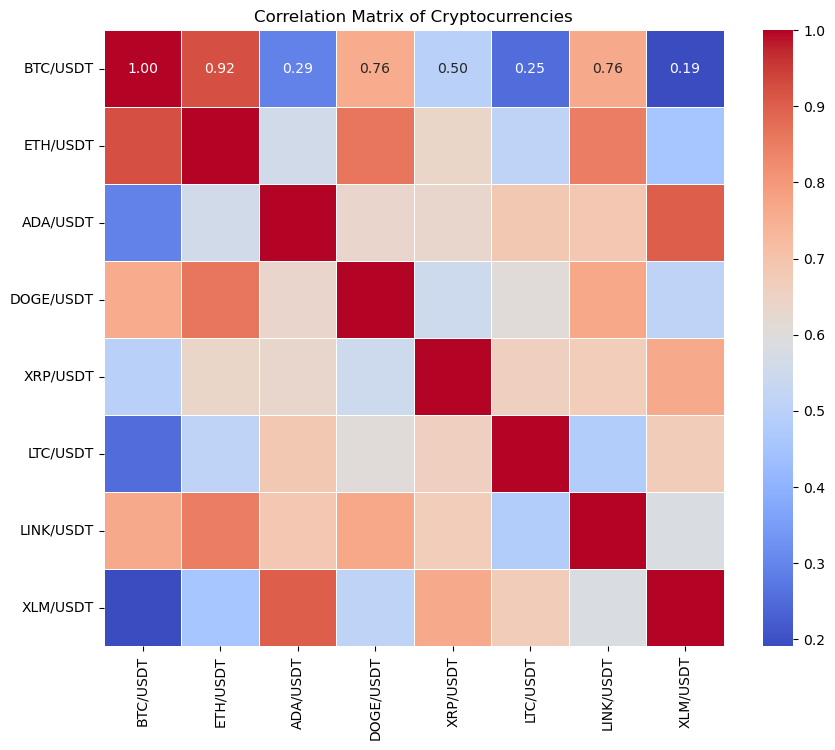

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add title and labels
plt.title('Correlation Matrix of Cryptocurrencies')
plt.show()


**Scatter Plot for Each Pair of Cryptocurrencies**
First, we'll create scatter plots to visualize the relationships between different pairs of cryptocurrencies. Scatter plots can reveal linear relationships, trends, or outliers.

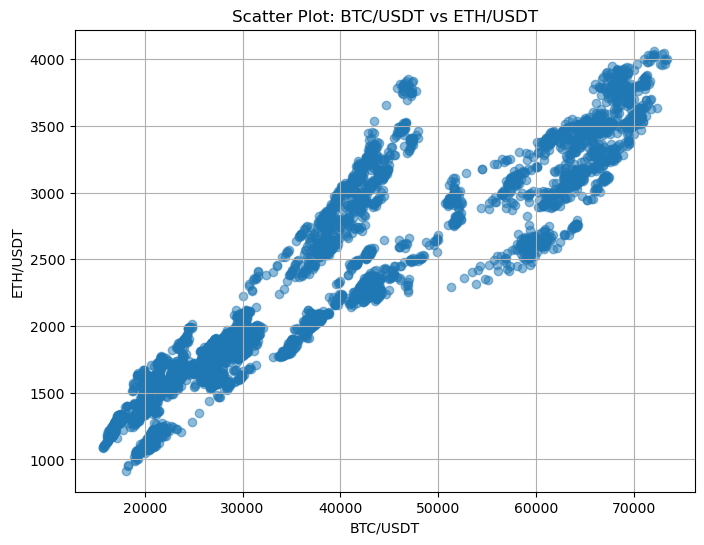

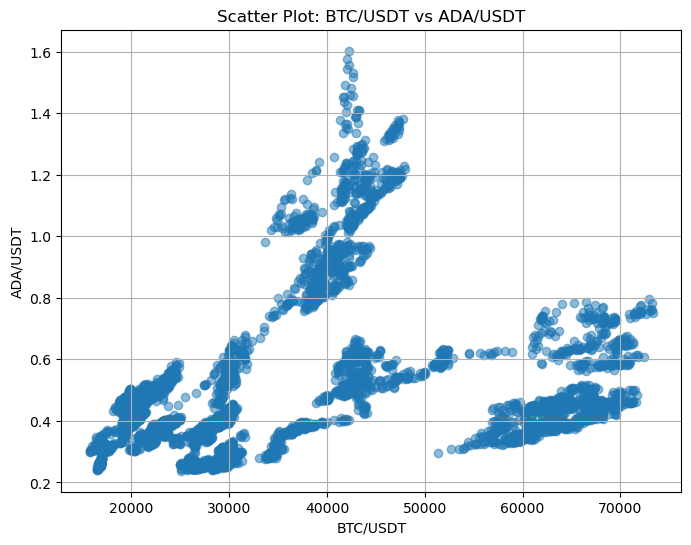

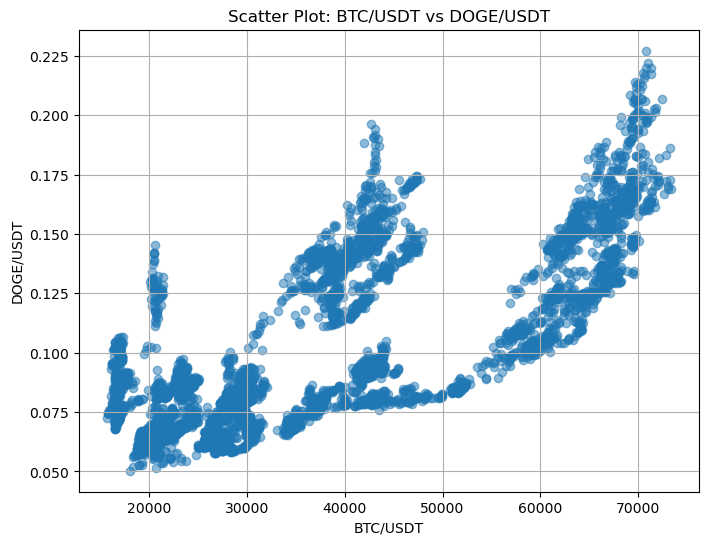

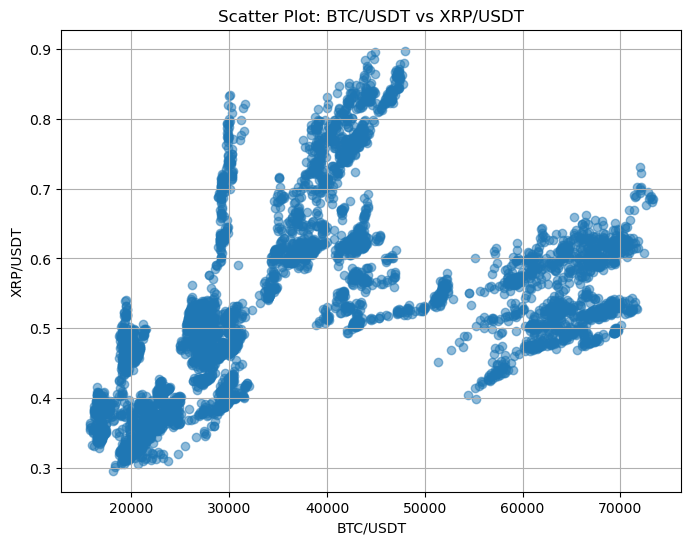

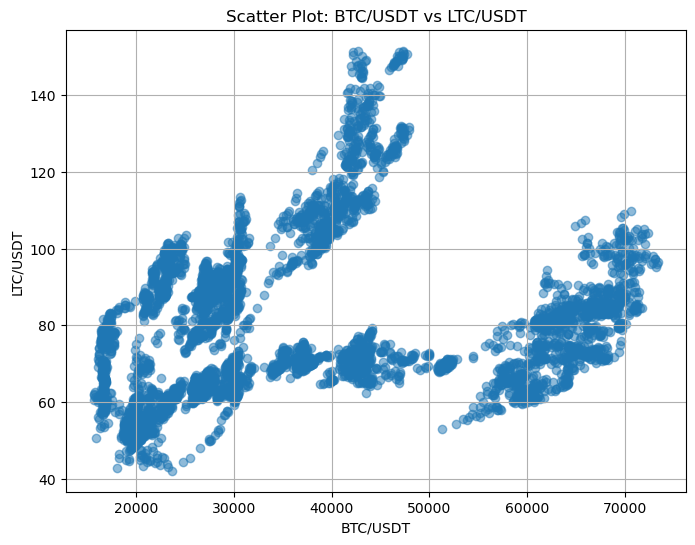

...

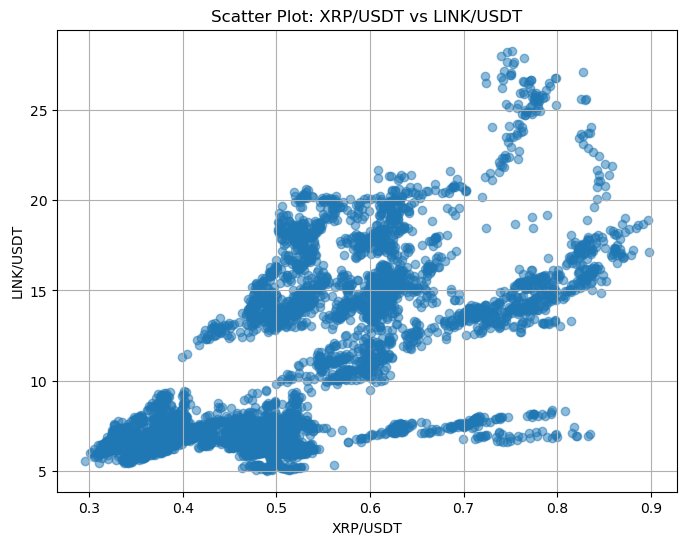

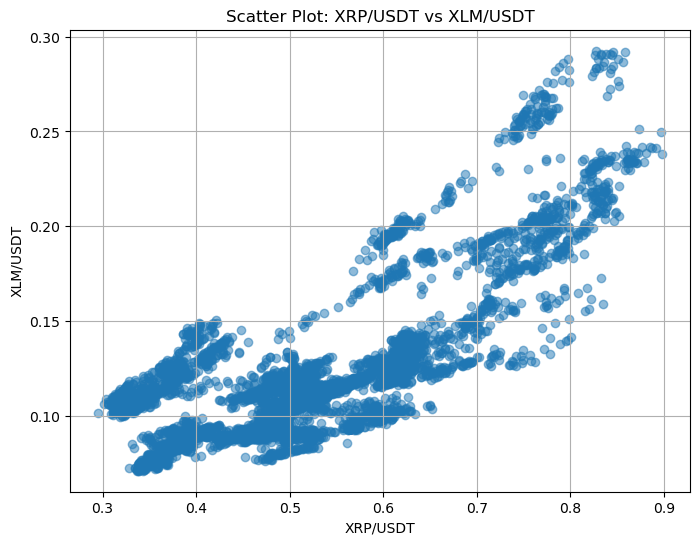

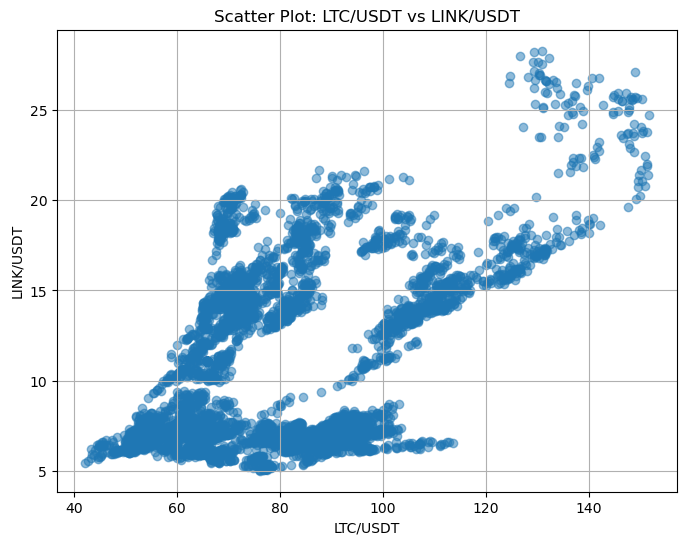

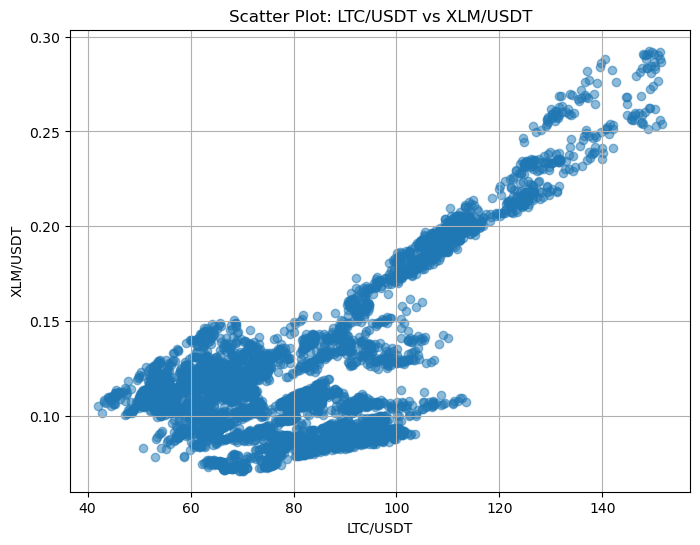

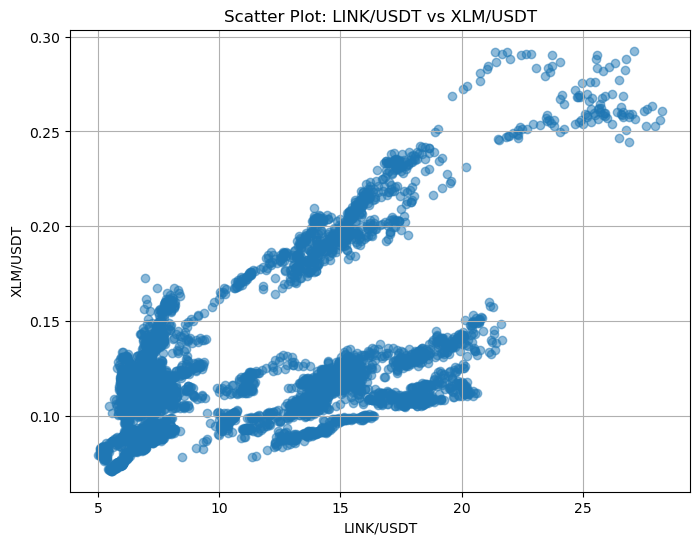

In [65]:
import matplotlib.pyplot as plt
import itertools

# Generate scatter plots for each pair of cryptocurrencies
pairs = list(itertools.combinations(symbols, 2))  # Generate all possible pairs of symbols

for (sym1, sym2) in pairs:
    plt.figure(figsize=(8, 6))
    plt.scatter(combined_df_cleaned[sym1], combined_df_cleaned[sym2], alpha=0.5)
    plt.title(f'Scatter Plot: {sym1} vs {sym2}')
    plt.xlabel(sym1)
    plt.ylabel(sym2)
    plt.grid(True)
    plt.show()


**Predictive Modeling**

**1: Predict BTC Price**
Let's start by predicting the BTC price using historical BTC price data. For simplicity, we'll use a linear regression model. You can replace it with more sophisticated models like ARIMA or LSTM based on your needs.

**Data Preparation** - Prepare the dataset with lag **features**, which we'll use for training all models. **Splitting the Data** into training and testing sets.

In [66]:
# Ensure proper scaling for both features and targets
scalers = {}
n_lags = 4  # Experiment with different numbers of lags

In [67]:
# Step 1: Normalize each coin's 'close' price in aligned_data_dict
for symbol in symbols:
    df = aligned_data_dict[symbol]
    scaler = MinMaxScaler(feature_range=(0, 1))
    df['close_scaled'] = scaler.fit_transform(df['close'].values.reshape(-1, 1))
    scalers[symbol] = scaler  # Store the scaler for each coin

In [68]:
# Function to check the number of rows and columns for each symbol's DataFrame
def check_df_shape(aligned_data_dict):
    df_shapes = {}
    for symbol, df in aligned_data_dict.items():
        rows, columns = df.shape
        df_shapes[symbol] = {
            'Rows': rows,
            'Columns': columns
        }
    return pd.DataFrame(df_shapes)

# Run the function
df_shapes = check_df_shape(aligned_data_dict)
print(df_shapes)

         BTC/USDT  ETH/USDT  ADA/USDT  DOGE/USDT  XRP/USDT  LTC/USDT  \
Rows         5899      5899      5899       5899      5899      5899   
Columns        16        16        16         16        16        16   

         LINK/USDT  XLM/USDT  
Rows          5899      5899  
Columns         16        16  


In [69]:
# Step 2: Create lagged features for each coin
def create_lagged_features(df, n_lags=4):
    for lag in range(1, n_lags + 1):
        df[f'lag_{lag}'] = df['close_scaled'].shift(lag)
    df.dropna(inplace=True)
    return df

n_lags = 4
for symbol in symbols:
    aligned_data_dict[symbol] = create_lagged_features(aligned_data_dict[symbol], n_lags)


In [70]:
# Function to check the number of rows and columns for each symbol's DataFrame
def check_df_shape(aligned_data_dict):
    df_shapes = {}
    for symbol, df in aligned_data_dict.items():
        rows, columns = df.shape
        df_shapes[symbol] = {
            'Rows': rows,
            'Columns': columns
        }
    return pd.DataFrame(df_shapes)

# Run the function
df_shapes = check_df_shape(aligned_data_dict)
print(df_shapes)

         BTC/USDT  ETH/USDT  ADA/USDT  DOGE/USDT  XRP/USDT  LTC/USDT  \
Rows         5895      5895      5895       5895      5895      5895   
Columns        20        20        20         20        20        20   

         LINK/USDT  XLM/USDT  
Rows          5895      5895  
Columns         20        20  


In [71]:
# Step 3: Split the data into train and test sets based on time
def split_data(df):
    X = df[[f'lag_{i}' for i in range(1, n_lags + 1)]].values
    y = df['close_scaled'].values
    train_size = int(0.8 * len(df))  # 80% for training, 20% for testing
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]
    return X_train, X_test, y_train, y_test

In [72]:
# Split data for BTC
btc_data = aligned_data_dict['BTC/USDT']
X_train_btc, X_test_btc, y_train_btc, y_test_btc = split_data(btc_data)

# Store train/test splits for other coins (to be used after BTC prediction)
other_coins_data = {symbol: split_data(aligned_data_dict[symbol]) for symbol in symbols if symbol != 'BTC/USDT'}

In [73]:
btc_data.shape

(5895, 20)

In [74]:
# Function to check the number of rows and columns for each symbol's DataFrame
def check_df_shape(other_coins_data):
    df_shapes = {}
    for symbol, df in aligned_data_dict.items():
        rows, columns = df.shape
        df_shapes[symbol] = {
            'Rows': rows,
            'Columns': columns
        }
    return pd.DataFrame(df_shapes)

# Run the function
df_shapes = check_df_shape(other_coins_data)
print(df_shapes)

         BTC/USDT  ETH/USDT  ADA/USDT  DOGE/USDT  XRP/USDT  LTC/USDT  \
Rows         5895      5895      5895       5895      5895      5895   
Columns        20        20        20         20        20        20   

         LINK/USDT  XLM/USDT  
Rows          5895      5895  
Columns         20        20  


In [75]:
X_train_btc.shape

(4716, 4)

In [76]:
btc_data = create_lagged_features(btc_data, n_lags)

In [77]:
btc_data.shape

(5891, 20)

In [78]:
# Define X (lagged values) and y (actual close prices)
X_btc = btc_data[[f'lag_{i}' for i in range(1, n_lags + 1)]].values
y_btc = btc_data['close_scaled'].values  # Target should be the scaled close price
X_train_btc, X_test_btc, y_train_btc, y_test_btc = train_test_split(X_btc, y_btc, test_size=0.2, shuffle=False)

In [79]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [80]:
# Step 4: Train and predict BTC prices using Random Forest
rf_btc = RandomForestRegressor(n_estimators=100)
rf_btc.fit(X_train_btc, y_train_btc)
y_pred_btc = rf_btc.predict(X_test_btc)

# Inverse transform the predicted BTC prices to the original scale
y_pred_btc_original = scalers['BTC/USDT'].inverse_transform(y_pred_btc.reshape(-1, 1))
y_test_btc_original = scalers['BTC/USDT'].inverse_transform(y_test_btc.reshape(-1, 1))

# Evaluate BTC prediction
mse_btc = mean_squared_error(y_test_btc_original, y_pred_btc_original)
rmse_btc = np.sqrt(mse_btc)
mae_btc = mean_absolute_error(y_test_btc_original, y_pred_btc_original)
r2_btc = r2_score(y_test_btc_original, y_pred_btc_original)

print(f"BTC Prediction - RMSE: {rmse_btc}, MAE: {mae_btc}, R-squared: {r2_btc}")

BTC Prediction - RMSE: 11005.554396147669, MAE: 10178.336652162841, R-squared: -5.835505772343415


In [ ]:
"""# Step 5: Use predicted BTC prices as a feature for other coins
predicted_coins = {}

for symbol, (X_train, X_test, y_train, y_test) in other_coins_data.items():
    # Resize the BTC training prices to match the length of the other coins' training set
    X_train_btc_resized = X_train_btc[:len(X_train)]
    
    # Resize the predicted BTC prices for the test set to match the length of X_test
    y_pred_btc_resized = y_pred_btc[:len(X_test)]  
    
    # Append actual BTC prices to the training features of the other coins
    X_train_coin_with_btc = np.column_stack((X_train, X_train_btc_resized))  # Add BTC prices to training features
    
    # Append predicted BTC prices to the test features of the other coins
    X_test_coin_with_btc = np.column_stack((X_test, y_pred_btc_resized))  # Add BTC predicted prices to test features
    
    # Train the Random Forest Regressor on the coin's data with BTC feature
    rf_coin = LinearRegression(n_estimators=100)
    rf_coin.fit(X_train_coin_with_btc, y_train)
    
    # Use the trained model to predict the coin's prices
    y_pred_coin = rf_coin.predict(X_test_coin_with_btc)
    
    # Inverse transform the predictions back to the original scale
    y_pred_coin_original = scalers[symbol].inverse_transform(y_pred_coin.reshape(-1, 1))
    y_test_original = scalers[symbol].inverse_transform(y_test.reshape(-1, 1))
    
    # Store the results
    predicted_coins[symbol] = {
        'y_pred': y_pred_coin_original,
        'y_test': y_test_original
    }
    
    # Evaluate and print the results for the coin
    mse_coin = mean_squared_error(y_test_original, y_pred_coin_original)
    rmse_coin = np.sqrt(mse_coin)
    mae_coin = mean_absolute_error(y_test_original, y_pred_coin_original)
    r2_coin = r2_score(y_test_original, y_pred_coin_original)
    
    print(f"{symbol} Prediction - RMSE: {rmse_coin}, MAE: {mae_coin}, R-squared: {r2_coin}")"""

'# Step 5: Use predicted BTC prices as a feature for other coins\npredicted_coins = {}\n\nfor symbol, (X_train, X_test, y_train, y_test) in other_coins_data.items():\n    # Resize the BTC training prices to match the length of the other coins\' training set\n    X_train_btc_resized = X_train_btc[:len(X_train)]\n    \n    # Resize the predicted BTC prices for the test set to match the length of X_test\n    y_pred_btc_resized = y_pred_btc[:len(X_test)]  \n    \n    # Append actual BTC prices to the training features of the other coins\n    X_train_coin_with_btc = np.column_stack((X_train, X_train_btc_resized))  # Add BTC prices to training features\n    \n    # Append predicted BTC prices to the test features of the other coins\n    X_test_coin_with_btc = np.column_stack((X_test, y_pred_btc_resized))  # Add BTC predicted prices to test features\n    \n    # Train the Random Forest Regressor on the coin\'s data with BTC feature\n    rf_coin = LinearRegression(n_estimators=100)\n    rf_coi

In [81]:
other_coins_data.keys()

dict_keys(['ETH/USDT', 'ADA/USDT', 'DOGE/USDT', 'XRP/USDT', 'LTC/USDT', 'LINK/USDT', 'XLM/USDT'])

In [82]:
predicted_coins_no_btc = {}

# Iterate over each coin and predict its price without using BTC as a feature
for symbol, (X_train, X_test, y_train, y_test) in other_coins_data.items():
    # Train the model (using Linear Regression or Random Forest)
    model_coin = LinearRegression()  # You can replace this with RandomForestRegressor if preferred
    model_coin.fit(X_train, y_train)

    # Predict the coin's prices using the test set
    y_pred_coin = model_coin.predict(X_test)
    
    # Inverse transform the predictions back to the original scale
    y_pred_coin_original = scalers[symbol].inverse_transform(y_pred_coin.reshape(-1, 1))
    y_test_original = scalers[symbol].inverse_transform(y_test.reshape(-1, 1))
    
    # Store the results
    predicted_coins_no_btc[symbol] = {
        'y_pred': y_pred_coin_original,
        'y_test': y_test_original
    }
    
    # Evaluate and print the results for the coin
    mse_coin = mean_squared_error(y_test_original, y_pred_coin_original)
    rmse_coin = np.sqrt(mse_coin)
    mae_coin = mean_absolute_error(y_test_original, y_pred_coin_original)
    r2_coin = r2_score(y_test_original, y_pred_coin_original)
    
    print(f"{symbol} Prediction (No BTC) - RMSE: {rmse_coin}, MAE: {mae_coin}, R-squared: {r2_coin}")

ETH/USDT Prediction (No BTC) - RMSE: 45.311526967680166, MAE: 28.97177671333053, R-squared: 0.9878139860107985
ADA/USDT Prediction (No BTC) - RMSE: 0.00940255753242272, MAE: 0.00546618844241273, R-squared: 0.9936211404497791
DOGE/USDT Prediction (No BTC) - RMSE: 0.003529810017463429, MAE: 0.002202617288446677, R-squared: 0.9851826294199094
XRP/USDT Prediction (No BTC) - RMSE: 0.009063754651485007, MAE: 0.005558087414184063, R-squared: 0.9748634425377101
LTC/USDT Prediction (No BTC) - RMSE: 1.3001267547993094, MAE: 0.7834815721215509, R-squared: 0.9864307352823662
LINK/USDT Prediction (No BTC) - RMSE: 0.28400413921291034, MAE: 0.17779709899748514, R-squared: 0.9910833750627136
XLM/USDT Prediction (No BTC) - RMSE: 0.0017692178123770229, MAE: 0.0010608176740464286, R-squared: 0.9881652180373006


In [83]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming you have the following available:
# - `y_pred_btc`: The predicted BTC prices
# - `other_coins_test_data`: A dictionary containing the testing data for other coins (y_test).
# - `scalers`: Dictionary with scalers for inverse transformation of the predictions

predicted_coins_with_btc = {}

# Iterate over each coin and predict its price based on predicted BTC prices and correlation with BTC
for symbol, (X_train, X_test, y_train, y_test) in other_coins_data.items():
    # Get the correlation between BTC and the current coin from the matrix
    correlation_with_btc = correlation_matrix.loc[symbol, 'BTC/USDT']
    
    # Ensure predicted BTC prices match the length of y_test
    y_pred_btc_resized = y_pred_btc[:len(y_test)]  # Resize to match the length of test data
    
    # Predict the coin's price based on the predicted BTC price and its correlation with BTC
    y_pred_coin = y_pred_btc_resized * correlation_with_btc
    
    # Inverse transform the predictions back to the original scale
    y_pred_coin_original = scalers[symbol].inverse_transform(y_pred_coin.reshape(-1, 1))
    y_test_original = scalers[symbol].inverse_transform(y_test.reshape(-1, 1))
    
    # Store the results
    predicted_coins_with_btc[symbol] = {
        'y_pred': y_pred_coin_original,
        'y_test': y_test_original
    }
    
    # Evaluate and print the results for the coin
    mse_coin = mean_squared_error(y_test_original, y_pred_coin_original)
    rmse_coin = np.sqrt(mse_coin)
    mae_coin = mean_absolute_error(y_test_original, y_pred_coin_original)
    r2_coin = r2_score(y_test_original, y_pred_coin_original)
    
    print(f"{symbol} Prediction (Using Predicted BTC) - RMSE: {rmse_coin}, MAE: {mae_coin}, R-squared: {r2_coin}")


ETH/USDT Prediction (Using Predicted BTC) - RMSE: 566.5413860948237, MAE: 491.42835369218295, R-squared: -0.9050551738776125
ADA/USDT Prediction (Using Predicted BTC) - RMSE: 0.12233993774871947, MAE: 0.10689085360111526, R-squared: -0.07990997166348279
DOGE/USDT Prediction (Using Predicted BTC) - RMSE: 0.028989361702804535, MAE: 0.02451504474603842, R-squared: 0.0005851777793655089
XRP/USDT Prediction (Using Predicted BTC) - RMSE: 0.08073476880659496, MAE: 0.06555713664371583, R-squared: -0.9943929449115143
LTC/USDT Prediction (Using Predicted BTC) - RMSE: 20.954101839806636, MAE: 17.86887921865889, R-squared: -2.5247070285404427
LINK/USDT Prediction (Using Predicted BTC) - RMSE: 3.567877131337058, MAE: 3.089831911267037, R-squared: -0.4072489706485529
XLM/USDT Prediction (Using Predicted BTC) - RMSE: 0.01890954409831944, MAE: 0.013600347965768693, R-squared: -0.351947326842319


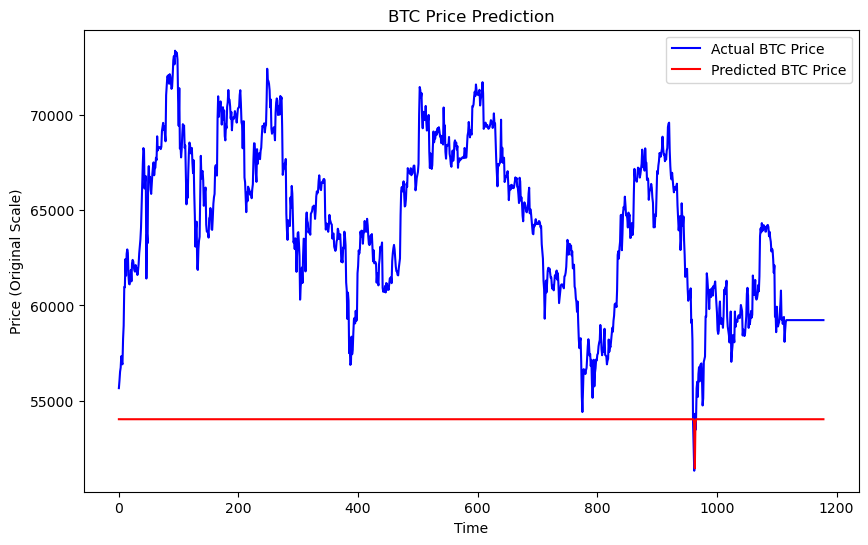

In [84]:
# Step 6: Plot BTC Predictions
plt.figure(figsize=(10, 6))
plt.plot(y_test_btc_original, label='Actual BTC Price', color='blue')
plt.plot(y_pred_btc_original, label='Predicted BTC Price', color='red')
plt.title('BTC Price Prediction')
plt.xlabel('Time')
plt.ylabel('Price (Original Scale)')
plt.legend()
plt.show()

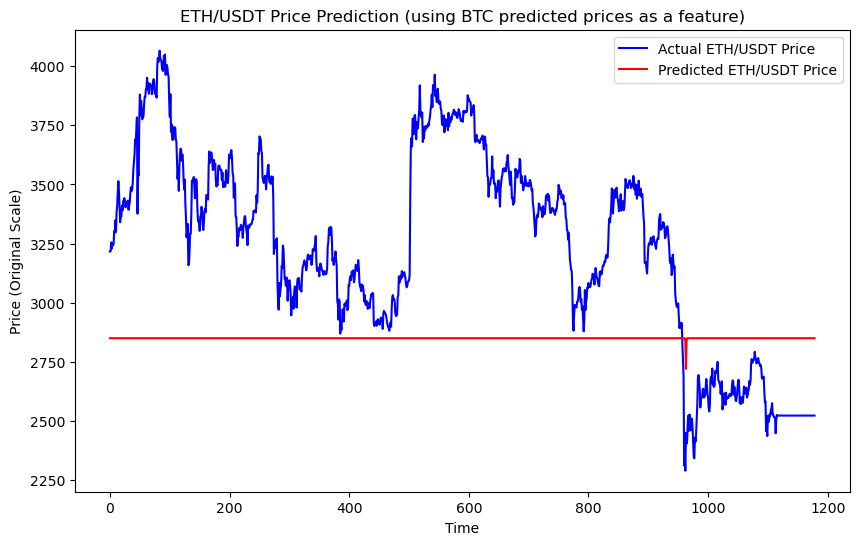

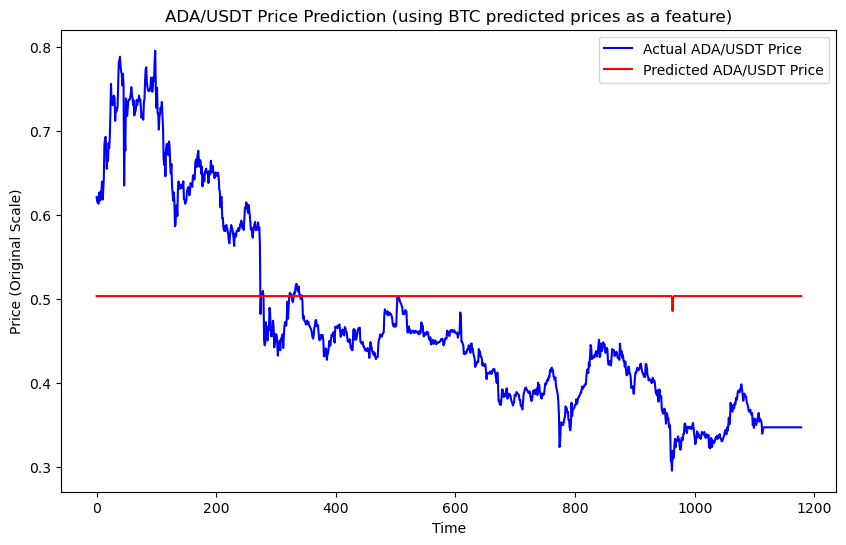

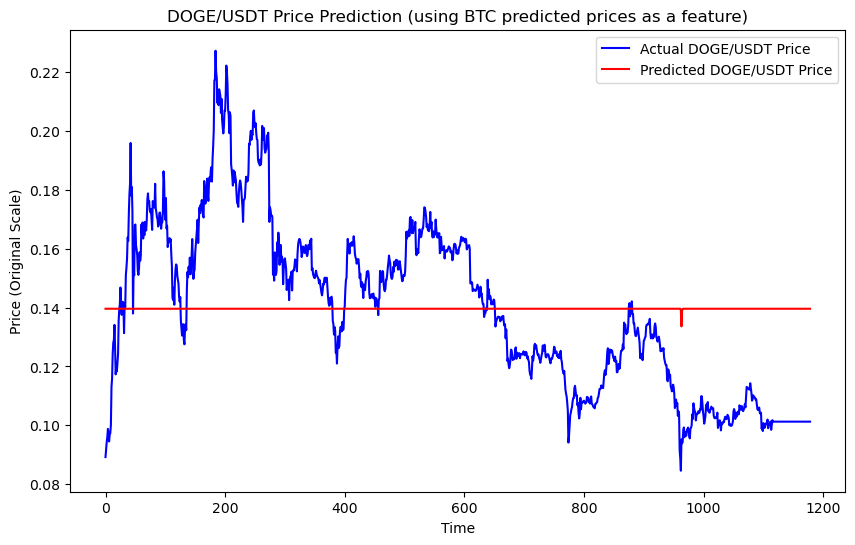

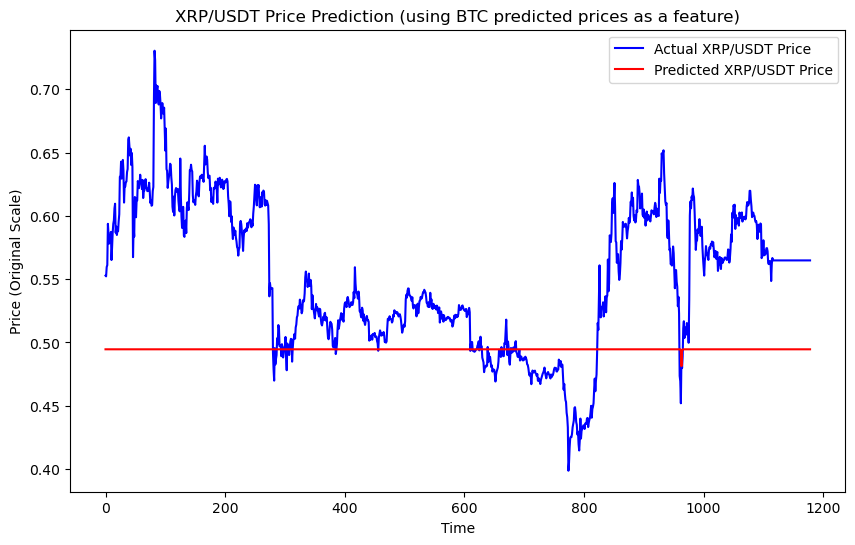

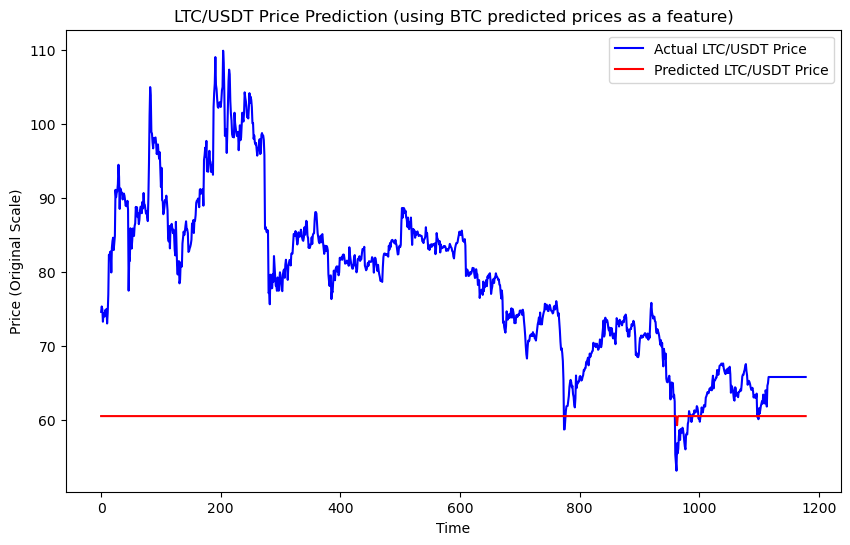

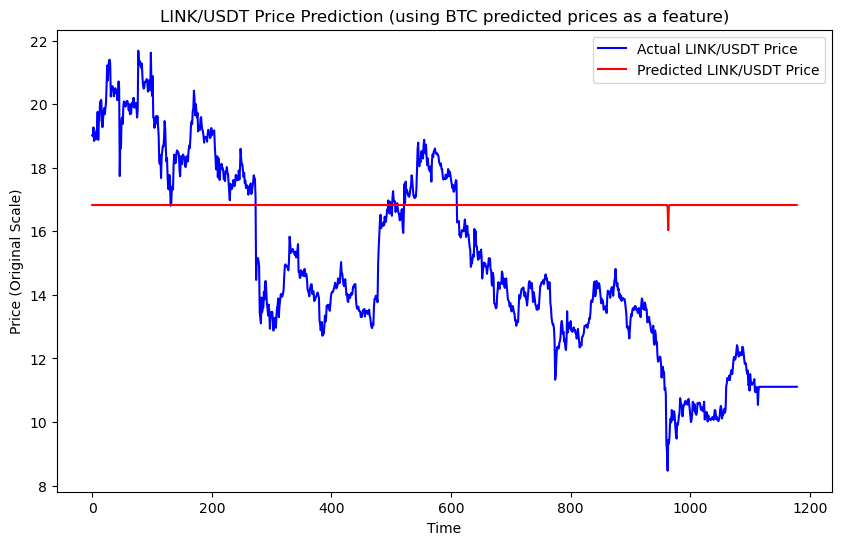

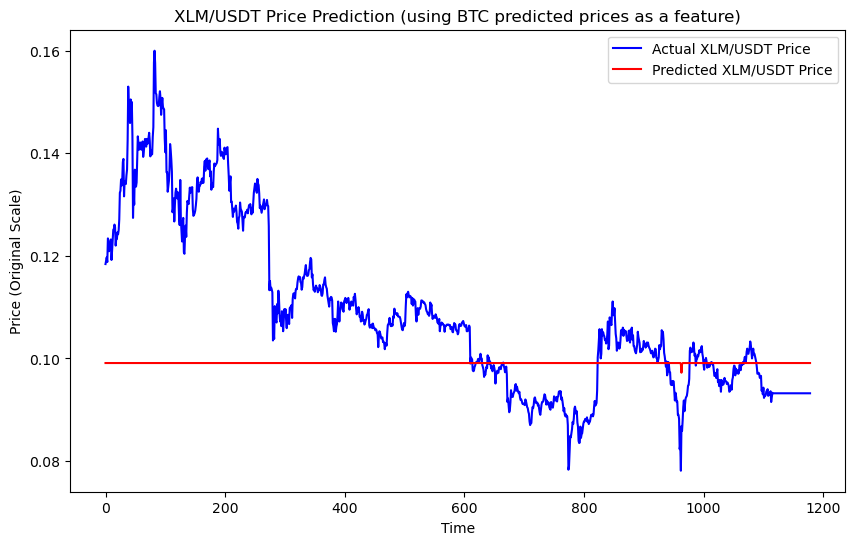

In [85]:
# Step 7: Plot Predictions for Other Coins
for symbol, result in predicted_coins_with_btc.items():
    plt.figure(figsize=(10, 6))
    plt.plot(result['y_test'], label=f'Actual {symbol} Price', color='blue')
    plt.plot(result['y_pred'], label=f'Predicted {symbol} Price', color='red')
    plt.title(f'{symbol} Price Prediction (using BTC predicted prices as a feature)')
    plt.xlabel('Time')
    plt.ylabel('Price (Original Scale)')
    plt.legend()
    plt.show()

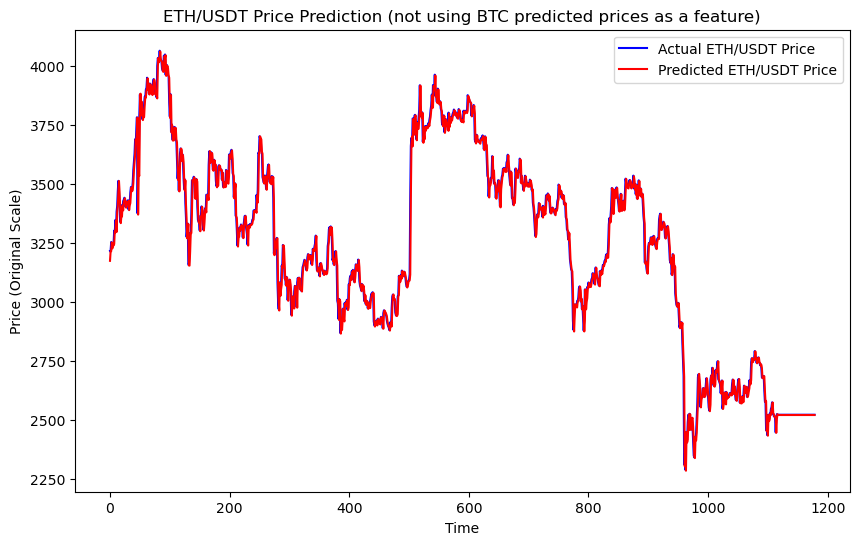

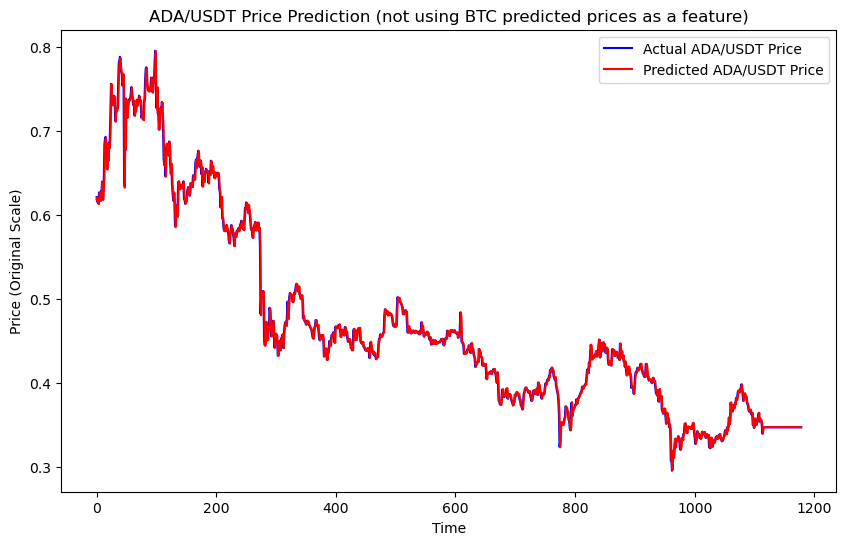

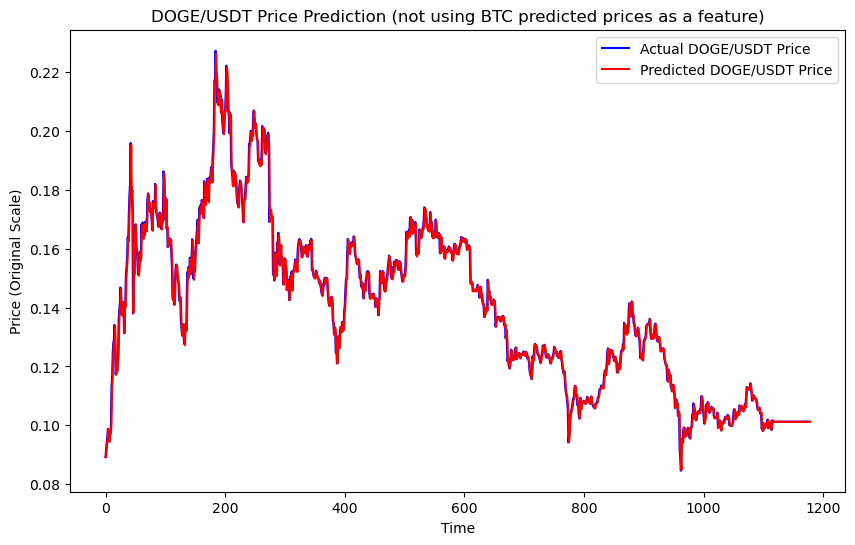

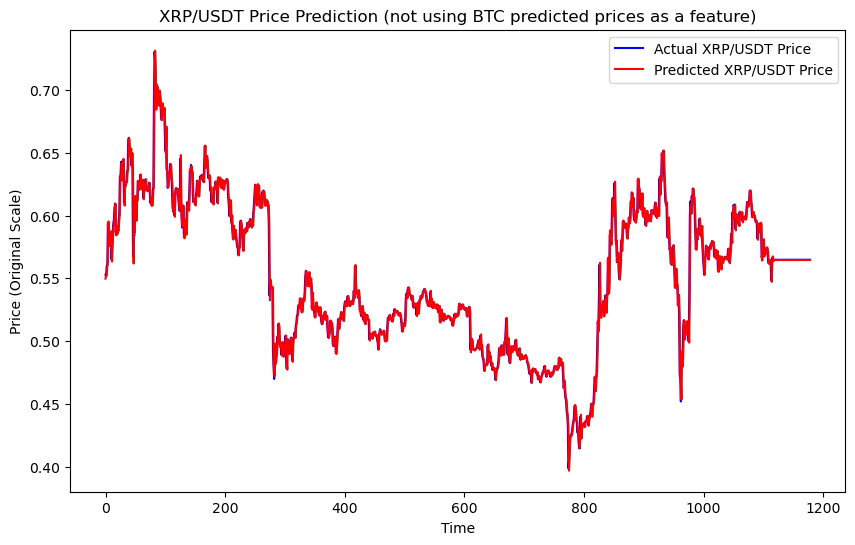

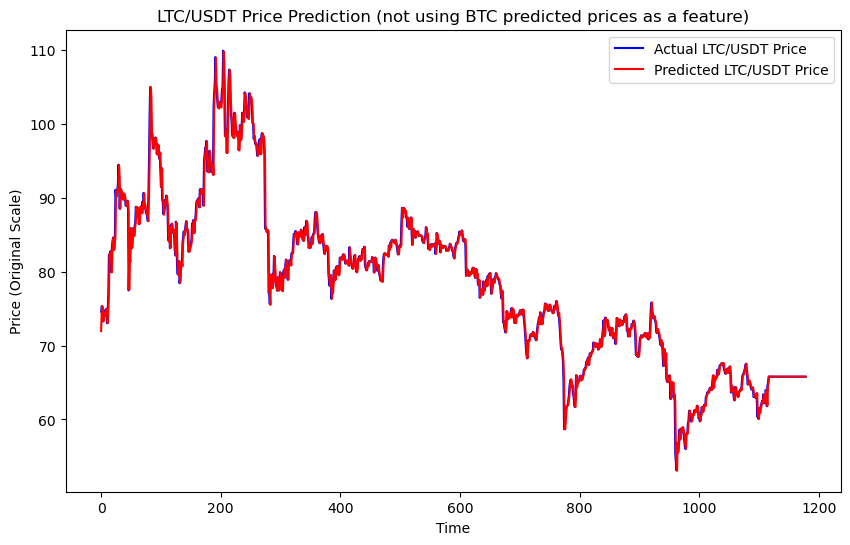

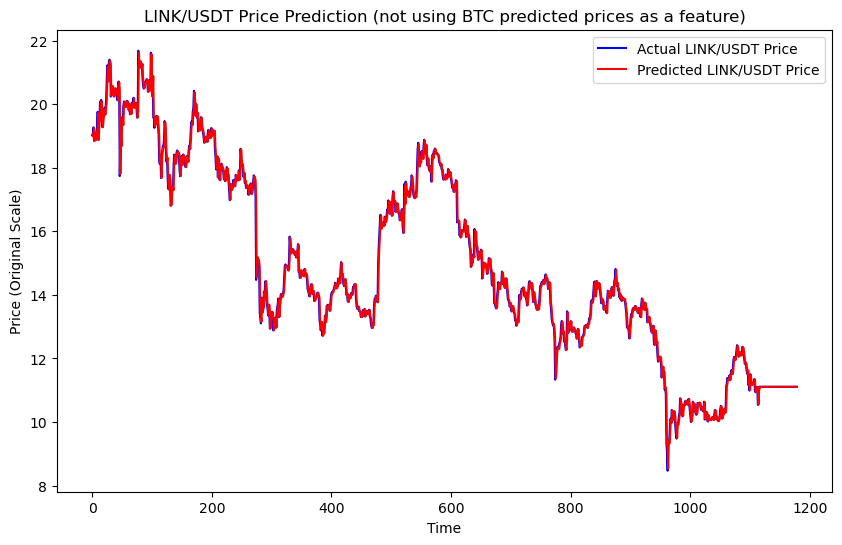

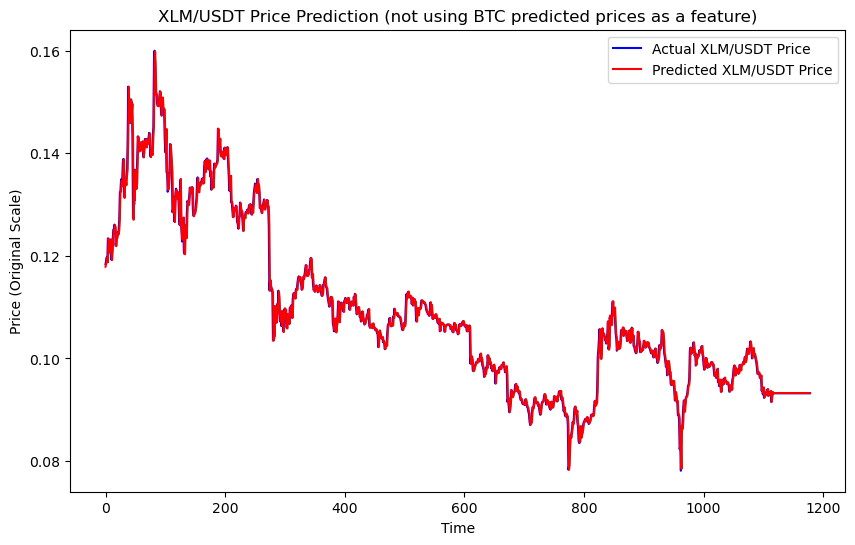

In [86]:
# Step 7: Plot Predictions for Other Coins
for symbol, result in predicted_coins_no_btc.items():
    plt.figure(figsize=(10, 6))
    plt.plot(result['y_test'], label=f'Actual {symbol} Price', color='blue')
    plt.plot(result['y_pred'], label=f'Predicted {symbol} Price', color='red')
    plt.title(f'{symbol} Price Prediction (not using BTC predicted prices as a feature)')
    plt.xlabel('Time')
    plt.ylabel('Price (Original Scale)')
    plt.legend()
    plt.show()

In [ ]:
aligned_data_dict['BTC/USDT']

,timestamp,open,high,low,close,volume,log_return,SMA_20,SMA_50,EMA_20,EMA_50,RSI_14,BB_middle,BB_upper,BB_lower,close_scaled,lag_1,lag_2,lag_3,lag_4
8,2022-01-02 08:00:00,47173.44,47499.45,46970.05,47235.50,2119.84865,0.001314,46994.859,44831.4796,47060.455629,46933.578619,52.933338,46994.859,47773.736693,46215.981307,0.546843,0.545766,0.548474,0.555297,0.548479
9,2022-01-02 12:00:00,47238.89,47447.00,47013.50,47340.47,2780.32874,0.002220,46994.859,44831.4796,47087.123664,46949.535143,52.933338,46994.859,47773.736693,46215.981307,0.548665,0.546843,0.545766,0.548474,0.555297
10,2022-01-02 16:00:00,47340.47,47990.00,46654.00,46907.68,5597.88593,-0.009184,46994.859,44831.4796,47070.033791,46947.893765,52.933338,46994.859,47773.736693,46215.981307,0.541154,0.548665,0.546843,0.545766,0.548474
11,2022-01-02 20:00:00,46907.67,47469.34,46815.17,47286.18,2436.02157,0.008037,46994.859,44831.4796,47090.619145,46961.159892,52.933338,46994.859,47773.736693,46215.981307,0.547723,0.541154,0.548665,0.546843,0.545766
12,2022-01-03 00:00:00,47286.18,47289.11,46722.39,46793.26,2994.31942,-0.010479,46994.859,44831.4796,47062.299226,46954.575583,52.933338,46994.859,47773.736693,46215.981307,0.539169,0.547723,0.541154,0.548665,0.546843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5834,2024-08-30 08:00:00,59271.11,59674.42,59271.00,59396.00,3176.58551,0.002105,59976.617,61752.1254,60129.508565,60853.120794,48.465693,59976.617,62551.700559,57401.533441,0.757867,0.755699,0.751550,0.757225,0.755472
5835,2024-08-30 12:00:00,59396.00,59944.07,57946.01,58094.99,10365.98684,-0.022147,59736.251,61694.3390,59935.744893,60744.958802,46.783816,59736.251,62045.173611,57427.328389,0.735290,0.757867,0.755699,0.751550,0.757225
5836,2024-08-30 16:00:00,58095.00,59371.00,57701.10,58700.02,6417.58601,0.010361,59550.402,61641.6176,59818.056808,60664.765123,41.348433,59550.402,61524.945234,57575.858766,0.745789,0.735290,0.757867,0.755699,0.751550
5837,2024-08-30 20:00:00,58700.02,59298.89,58700.00,59123.99,1671.15824,0.007197,59421.145,61615.9494,59751.955207,60604.342569,50.935591,59421.145,61119.873494,57722.416506,0.753146,0.745789,0.735290,0.757867,0.755699


In [88]:
from sklearn.metrics import mean_squared_error, r2_score

# Function to evaluate models
def evaluate_model(y_test, y_pred, model_name):
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"{model_name} - MSE: {mse}, RMSE: {rmse}, MAE: {mae}, R-squared: {r2}")
    
    return {
        'model_name': model_name,
        'mse': mse,
        'rmse': rmse,
        'mae': mae,
        'r2': r2
    }

In [89]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import joblib
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import xgboost as xgb
from pyswarm import pso

In [90]:
# 1. Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train_btc, y_train_btc)
y_pred_lr = lr_model.predict(X_test_btc)
lr_results = evaluate_model(y_test_btc, y_pred_lr, "Linear Regression")


Linear Regression - MSE: 0.00016328955954765387, RMSE: 0.012778480330135265, MAE: 0.008478261860679154, R-squared: 0.9693982620874249


In [91]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Define the LSTM model with the input shape passed
def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))  # input_shape is now passed
    model.add(Dropout(0.2))  # Dropout to avoid overfitting
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))  # Dense layer with 25 units
    model.add(Dense(1))  # Output layer with 1 unit (prediction)
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Reshape input data for LSTM (samples, time steps, features)
X_train_btc_lstm = X_train_btc.reshape(X_train_btc.shape[0], X_train_btc.shape[1], 1)
X_test_btc_lstm = X_test_btc.reshape(X_test_btc.shape[0], X_test_btc.shape[1], 1)

# Pass the input shape to the build_lstm_model function
input_shape = (X_train_btc_lstm.shape[1], X_train_btc_lstm.shape[2])
lstm_model = build_lstm_model(input_shape)

# Train the LSTM model
lstm_model.fit(X_train_btc_lstm, y_train_btc, epochs=10, batch_size=64)

# Make predictions
y_pred_lstm = lstm_model.predict(X_test_btc_lstm).flatten()

# Evaluate the model
lstm_results = evaluate_model(y_test_btc, y_pred_lstm, "LSTM")


C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0222
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0854e-04
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1089e-04
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8765e-04
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3797e-04
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7222e-04
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2368e-04
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2310e-04
Epoch 9/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9857e-04
Epoch 10/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 3.0917e-04
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
LSTM - MSE: 0.00032317690166921395, RMSE: 0.01797712161802367, MAE: 0.013985807555522945, R-squared: 0.9394341262743553


In [92]:
# 3. Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100)
rf_model.fit(X_train_btc, y_train_btc)
y_pred_rf = rf_model.predict(X_test_btc)
rf_results = evaluate_model(y_test_btc, y_pred_rf, "Random Forest")

Random Forest - MSE: 0.035912593135484, RMSE: 0.18950618231467806, MAE: 0.1750452281154742, R-squared: -5.730300246613748


In [93]:
# 4. XGBoost with PSO
# (Skipping PSO for simplicity, train directly with XGBoost's optimized parameters)
xgb_model = xgb.XGBRegressor(n_estimators=500, learning_rate=0.01)
xgb_model.fit(X_train_btc, y_train_btc)
y_pred_xgb = xgb_model.predict(X_test_btc)
xgb_results = evaluate_model(y_test_btc, y_pred_xgb, "XGBoost")


XGBoost - MSE: 0.05201661866562283, RMSE: 0.22807152094381014, MAE: 0.21608386426671772, R-squared: -8.748320320744124


In [94]:
# 5. Extra Trees Regressor
et_model = ExtraTreesRegressor(n_estimators=100)
et_model.fit(X_train_btc, y_train_btc)
y_pred_et = et_model.predict(X_test_btc)
et_results = evaluate_model(y_test_btc, y_pred_et, "Extra Trees Regressor")

Extra Trees Regressor - MSE: 0.03508729785868847, RMSE: 0.18731603737717833, MAE: 0.1726717900474356, R-squared: -5.575633470422143


In [95]:
# Step 3: Select the Best Model Based on RMSE or Other Metrics
results = [lr_results, lstm_results, rf_results, xgb_results, et_results]
best_model_result = min(results, key=lambda x: x['rmse'])  # Select model with the lowest RMSE
print(f"Best Model: {best_model_result['model_name']} with RMSE: {best_model_result['rmse']}")


Best Model: Linear Regression with RMSE: 0.012778480330135265


In [96]:
best_model=lr_model

In [97]:
# Step 5: Use the Best Model to Predict BTC and Then Predict Other Coins
y_pred_btc_final = best_model.predict(X_test_btc)

In [98]:
# Inverse transform BTC predictions to original scale
y_pred_btc_final_original = scaler.inverse_transform(y_pred_btc_final.reshape(-1, 1))
y_test_btc_original = scaler.inverse_transform(y_test_btc.reshape(-1, 1))

**Model Training**

Linear Regression

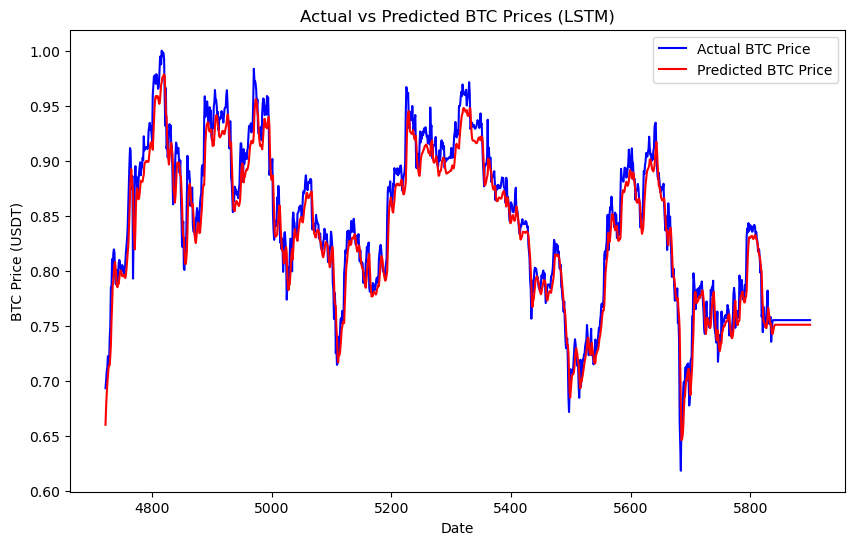

In [99]:
# Assuming btc_data has the 'timestamp' column or index for plotting
test_dates = btc_data.iloc[-len(y_test_btc):].index  # Get the corresponding date index for the test data

# Plot the actual vs predicted values for BTC
plt.figure(figsize=(10, 6))
plt.plot(test_dates, y_test_btc, label='Actual BTC Price', color='blue')
plt.plot(test_dates, y_pred_lstm, label='Predicted BTC Price', color='red')
plt.title('Actual vs Predicted BTC Prices (LSTM)')
plt.xlabel('Date')
plt.ylabel('BTC Price (USDT)')
plt.legend()
plt.show()


**Model Evaluation and Selection**

In [100]:
# Step 4: Save the Best Model
if best_model_result['model_name'] == 'Linear Regression':
    best_model = lr_model
elif best_model_result['model_name'] == 'LSTM':
    best_model = lstm_model
elif best_model_result['model_name'] == 'Random Forest':
    best_model = rf_model
elif best_model_result['model_name'] == 'XGBoost with PSO':
    best_model = xgb_model
elif best_model_result['model_name'] == 'Extra Trees Regressor':
    best_model = et_model

joblib.dump("Linear Regression", 'best_btc_model.pkl')  # Save the best model to disk

['best_btc_model.pkl']

**Full Code with Plotting for All Models**

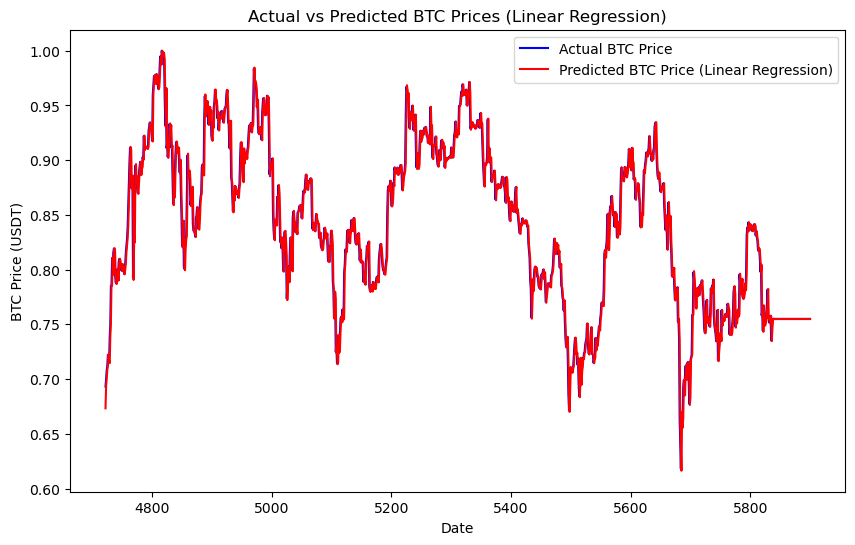

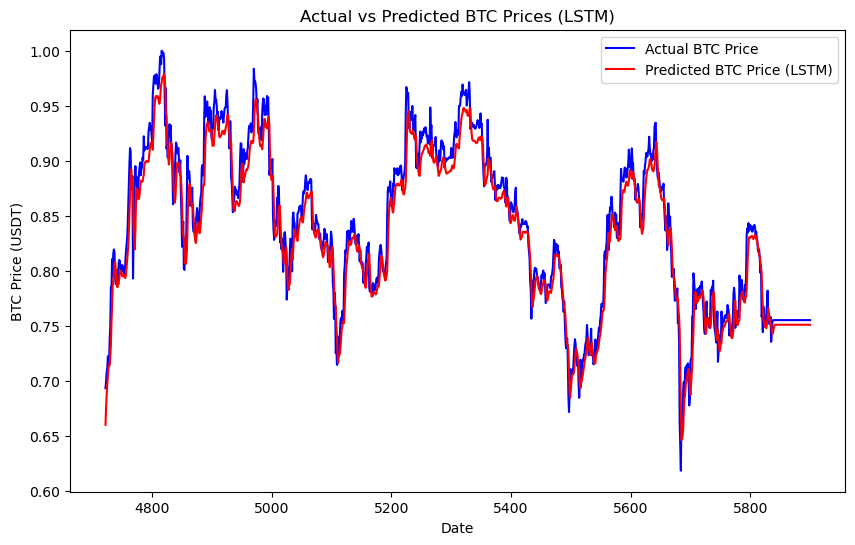

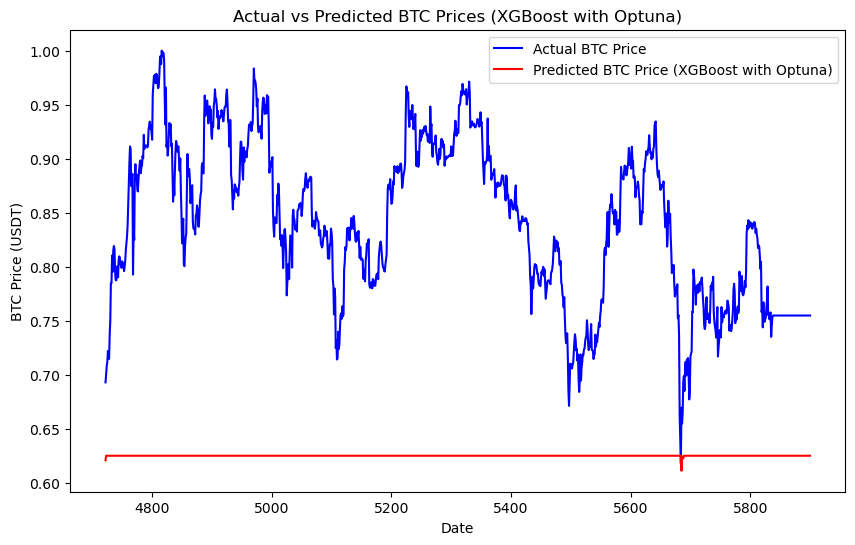

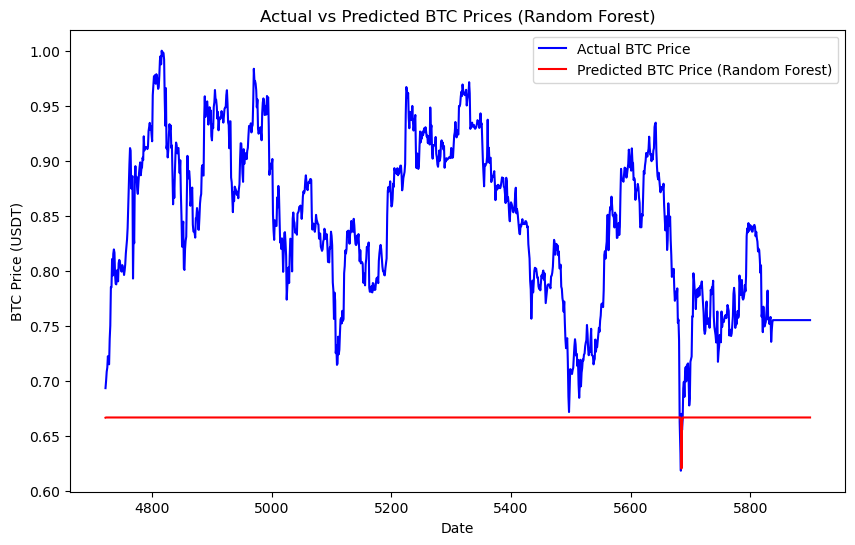

In [101]:
# Assuming btc_data contains the 'timestamp' index or column
test_dates = btc_data.iloc[-len(y_test_btc):].index  # Extract corresponding test set dates

# Plot for Linear Regression
plt.figure(figsize=(10, 6))
plt.plot(test_dates, y_test_btc, label='Actual BTC Price', color='blue')
plt.plot(test_dates, y_pred_lr, label='Predicted BTC Price (Linear Regression)', color='red')
plt.title('Actual vs Predicted BTC Prices (Linear Regression)')
plt.xlabel('Date')
plt.ylabel('BTC Price (USDT)')
plt.legend()
plt.show()

# Plot for LSTM
plt.figure(figsize=(10, 6))
plt.plot(test_dates, y_test_btc, label='Actual BTC Price', color='blue')
plt.plot(test_dates, y_pred_lstm, label='Predicted BTC Price (LSTM)', color='red')
plt.title('Actual vs Predicted BTC Prices (LSTM)')
plt.xlabel('Date')
plt.ylabel('BTC Price (USDT)')
plt.legend()
plt.show()

# Plot for XGBoost with Optuna
plt.figure(figsize=(10, 6))
plt.plot(test_dates, y_test_btc, label='Actual BTC Price', color='blue')
plt.plot(test_dates, y_pred_xgb, label='Predicted BTC Price (XGBoost with Optuna)', color='red')
plt.title('Actual vs Predicted BTC Prices (XGBoost with Optuna)')
plt.xlabel('Date')
plt.ylabel('BTC Price (USDT)')
plt.legend()
plt.show()

# Plot for Random Forest
plt.figure(figsize=(10, 6))
plt.plot(test_dates, y_test_btc, label='Actual BTC Price', color='blue')
plt.plot(test_dates, y_pred_rf, label='Predicted BTC Price (Random Forest)', color='red')
plt.title('Actual vs Predicted BTC Prices (Random Forest)')
plt.xlabel('Date')
plt.ylabel('BTC Price (USDT)')
plt.legend()
plt.show()


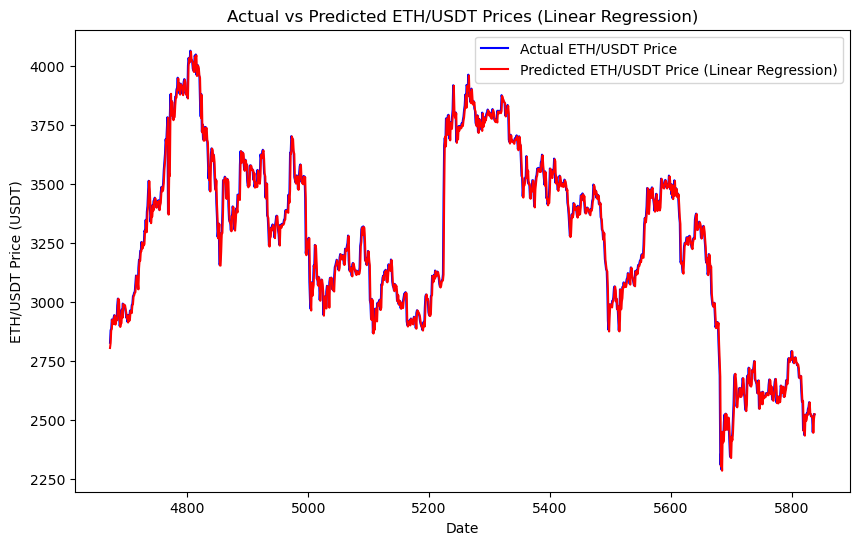

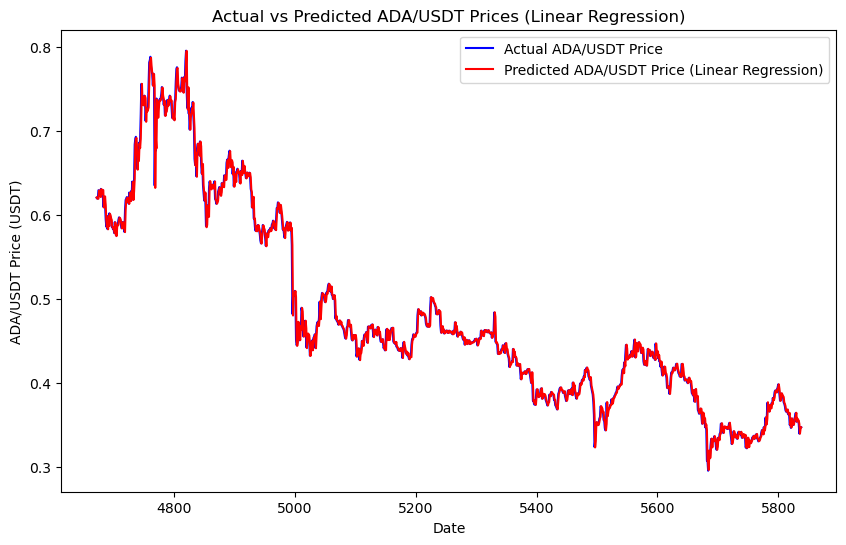

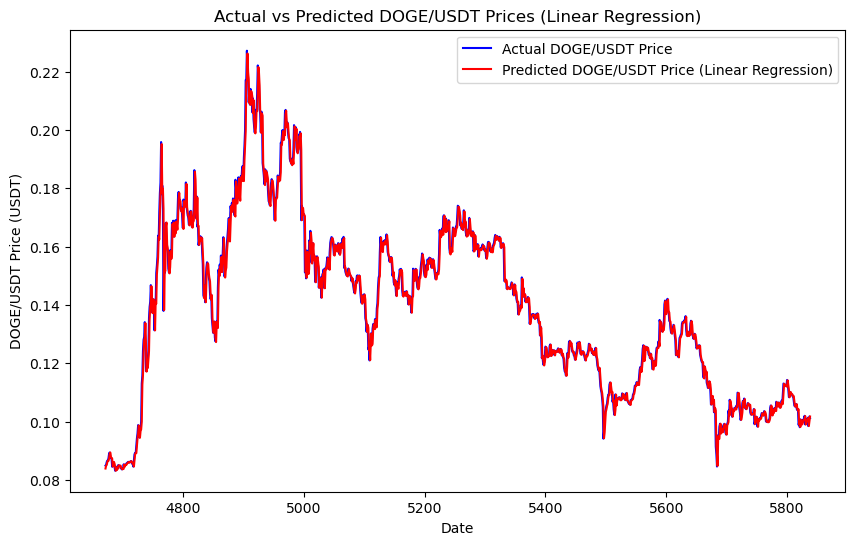

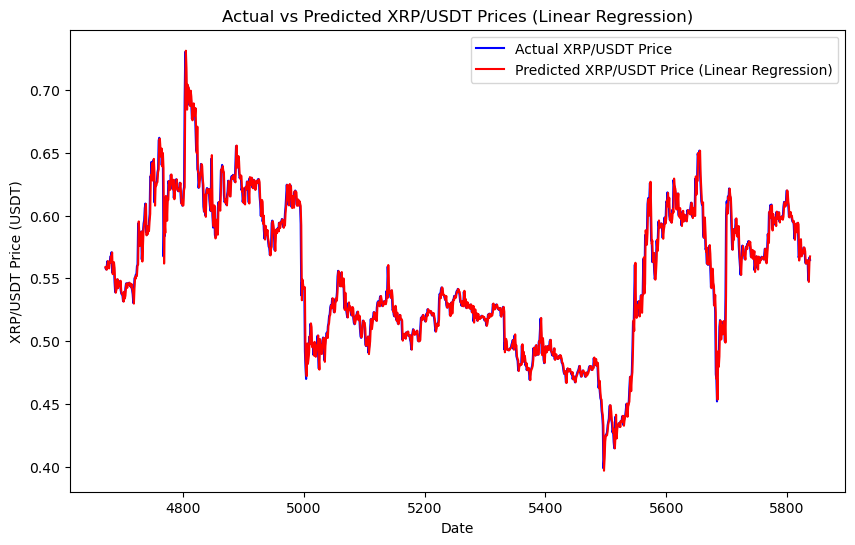

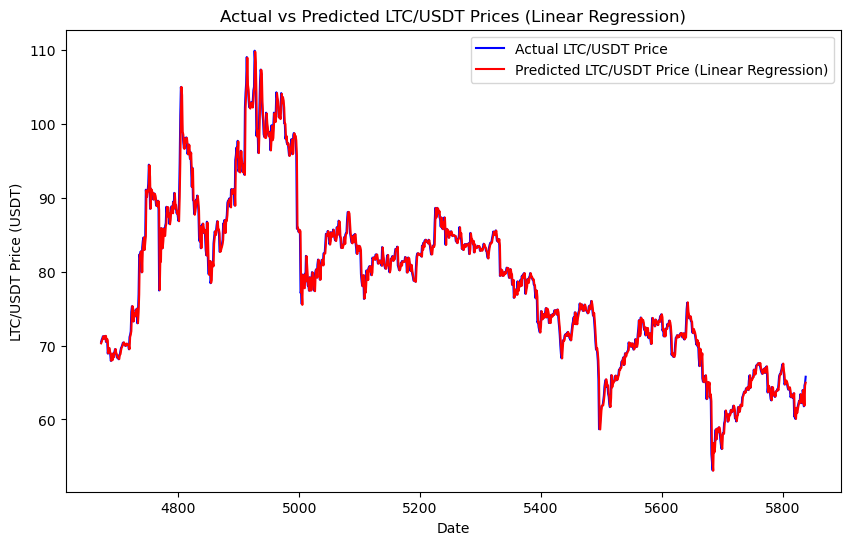

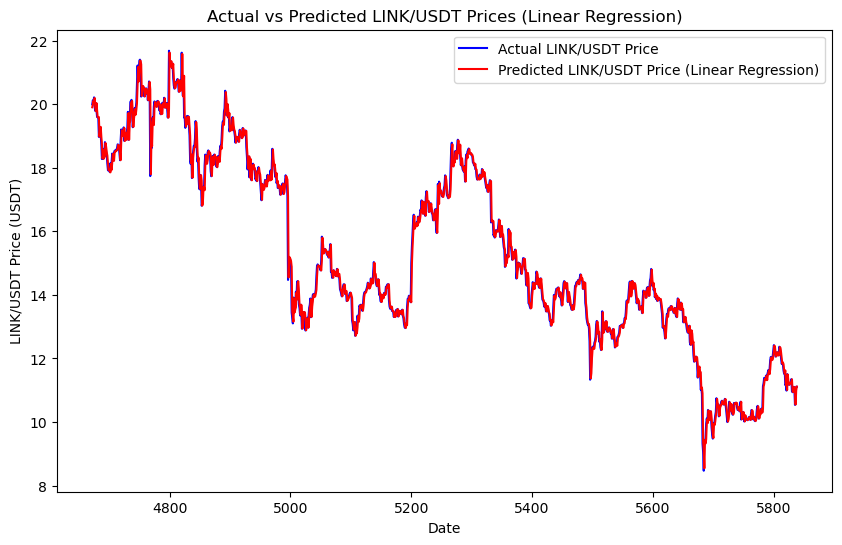

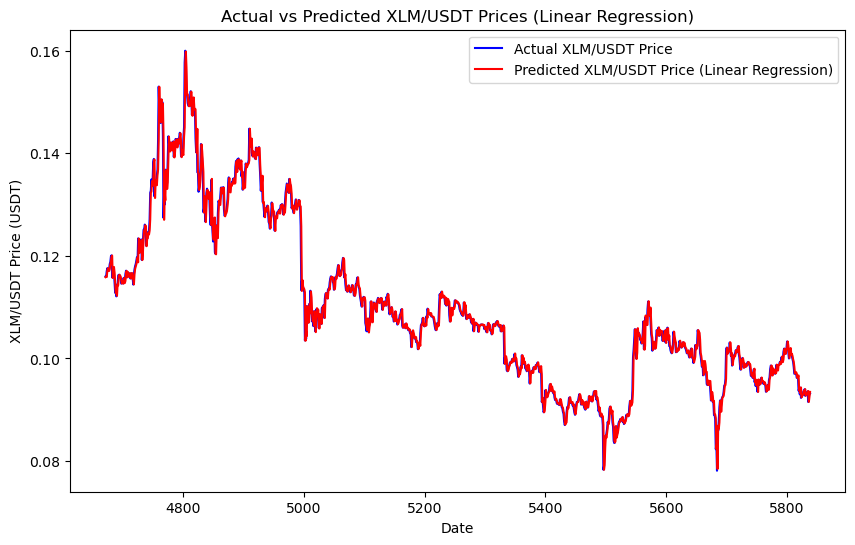

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have the following:
# - y_test and y_pred for each coin stored in a dictionary called `predicted_coins_no_btc`
# - `symbols` is a list of coin symbols, for example: ['BTC/USDT', 'ETH/USDT', 'ADA/USDT', ...]

# Loop through all coins in the symbols list except 'BTC/USDT' and plot predictions vs actual prices
for symbol in symbols:
    if symbol == 'BTC/USDT':  # Skip BTC/USDT
        continue
    
    # Extract actual and predicted values for the current coin
    test_data = predicted_coins_no_btc[symbol]
    y_test = test_data['y_test']  # Actual prices
    y_pred = test_data['y_pred']  # Predicted prices
    
    # Assuming that 'aligned_data_dict' contains the full dataset for each coin
    df = aligned_data_dict[symbol]
    
    # Get the test set dates (same length as y_test)
    test_dates = df.iloc[-len(y_test):].index  # Extract corresponding test set dates
    
    # Plot actual vs predicted prices for each coin
    plt.figure(figsize=(10, 6))
    plt.plot(test_dates, y_test, label=f'Actual {symbol} Price', color='blue')
    plt.plot(test_dates, y_pred, label=f'Predicted {symbol} Price (Linear Regression)', color='red')
    plt.title(f'Actual vs Predicted {symbol} Prices (Linear Regression)')
    plt.xlabel('Date')
    plt.ylabel(f'{symbol} Price (USDT)')
    plt.legend()
    plt.show()


**Trading Strategy Design**

ETH/USDT Prediction (No BTC) - RMSE: 46.00389756067349, MAE: 30.250143302410095, R-squared: 0.9854394523200481
ADA/USDT Prediction (No BTC) - RMSE: 0.009606725983774001, MAE: 0.005774532434227402, R-squared: 0.9933117488654116
DOGE/USDT Prediction (No BTC) - RMSE: 0.003552613099891613, MAE: 0.002248832550880753, R-squared: 0.9859153720413065
XRP/USDT Prediction (No BTC) - RMSE: 0.009168417103398243, MAE: 0.005764027233645064, R-squared: 0.9745009514855135
LTC/USDT Prediction (No BTC) - RMSE: 1.3109443334627862, MAE: 0.8055934126163901, R-squared: 0.9857548148350573
LINK/USDT Prediction (No BTC) - RMSE: 0.28948990728760693, MAE: 0.1872543887332364, R-squared: 0.9905939979023619
XLM/USDT Prediction (No BTC) - RMSE: 0.0017929810023674597, MAE: 0.001104066349996723, R-squared: 0.9874165870496845
Final portfolio value: $993.39


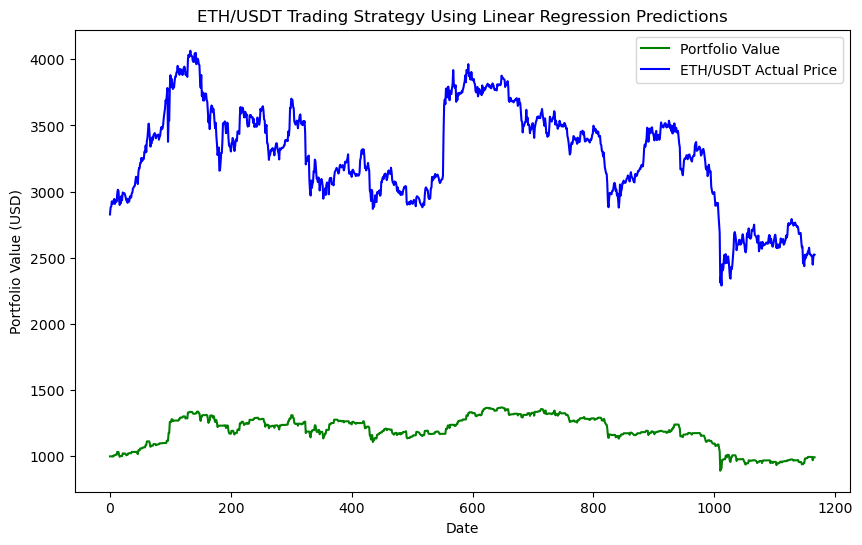

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assume 'other_coins_data' contains the training and testing data for all coins
# and 'scalers' contains the scalers used to normalize the data for each coin

predicted_coins_no_btc = {}

# Iterate over each coin and predict its price without using BTC as a feature
for symbol, (X_train, X_test, y_train, y_test) in other_coins_data.items():
    # Train the model (using Linear Regression)
    model_coin = LinearRegression()
    model_coin.fit(X_train, y_train)

    # Predict the coin's prices using the test set
    y_pred_coin = model_coin.predict(X_test)
    
    # Inverse transform the predictions back to the original scale
    y_pred_coin_original = scalers[symbol].inverse_transform(y_pred_coin.reshape(-1, 1))
    y_test_original = scalers[symbol].inverse_transform(y_test.reshape(-1, 1))
    
    # Store the results
    predicted_coins_no_btc[symbol] = {
        'y_pred': y_pred_coin_original,
        'y_test': y_test_original
    }
    
    # Evaluate and print the results for the coin
    mse_coin = mean_squared_error(y_test_original, y_pred_coin_original)
    rmse_coin = np.sqrt(mse_coin)
    mae_coin = mean_absolute_error(y_test_original, y_pred_coin_original)
    r2_coin = r2_score(y_test_original, y_pred_coin_original)
    
    print(f"{symbol} Prediction (No BTC) - RMSE: {rmse_coin}, MAE: {mae_coin}, R-squared: {r2_coin}")

# Now we apply this predicted data to a trading strategy

# Assume we want to create a trading strategy for one of the coins, e.g., 'ETH/USDT'
df = pd.DataFrame({
    'actual_price': predicted_coins_no_btc['ETH/USDT']['y_test'].flatten(),
    'predicted_price': predicted_coins_no_btc['ETH/USDT']['y_pred'].flatten()
})

# Generate trading signals based on predicted prices
df['signal'] = 0  # 0 means Hold
df.loc[df['predicted_price'] > df['actual_price'], 'signal'] = 1  # Buy signal
df.loc[df['predicted_price'] < df['actual_price'], 'signal'] = -1  # Sell signal

# Simulate a trading strategy
initial_balance = 1000  # Starting capital in USD
position = 0  # Initial position (no holdings)
portfolio_value = initial_balance  # Initial portfolio value

# Track portfolio value and position changes
portfolio_values = []
for i, row in df.iterrows():
    signal = row['signal']
    current_price = row['actual_price']
    
    if signal == 1 and position == 0:  # Buy
        position = portfolio_value / current_price  # Buy the coin with all capital
        portfolio_value = 0  # Capital is now in the coin
    elif signal == -1 and position > 0:  # Sell
        portfolio_value = position * current_price  # Sell all holdings
        position = 0  # Reset position to 0
    
    # Track the portfolio value (either in cash or coin holdings)
    current_portfolio_value = portfolio_value if position == 0 else position * current_price
    portfolio_values.append(current_portfolio_value)

# Add portfolio values to the DataFrame
df['portfolio_value'] = portfolio_values

# Output the final portfolio value
print(f"Final portfolio value: ${portfolio_values[-1]:.2f}")

# Visualize the strategy's performance
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df.index, df['portfolio_value'], label='Portfolio Value', color='green')
plt.plot(df.index, df['actual_price'], label='ETH/USDT Actual Price', color='blue')
plt.title('ETH/USDT Trading Strategy Using Linear Regression Predictions')
plt.xlabel('Date')
plt.ylabel('Portfolio Value (USD)')
plt.legend()
plt.show()


Final portfolio value: $1225.37


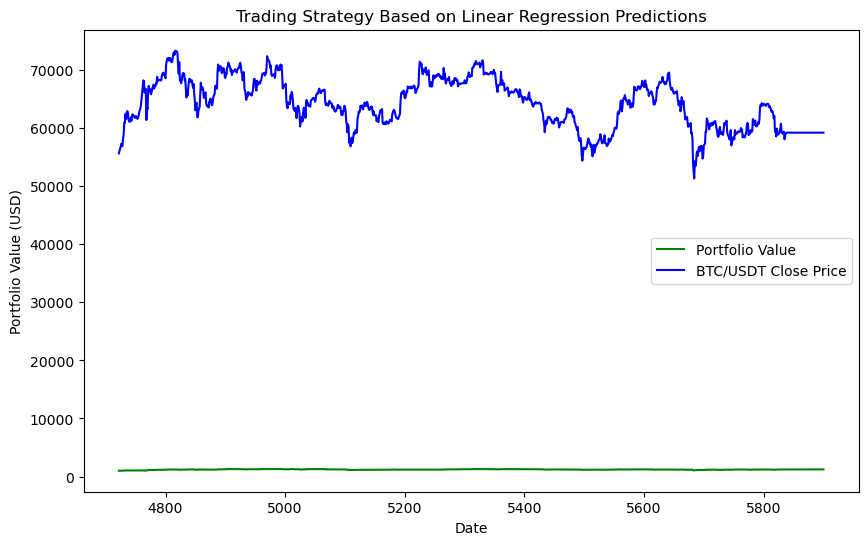

In [103]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression

# Example data (replace with actual data)
# aligned_data_dict is a dictionary of DataFrames with coins data
# Assume 'close' column represents the closing price of the coin

# Load BTC/USDT data for illustration (replace with actual coin data)
df = aligned_data_dict['BTC/USDT']

# Train the Linear Regression Model (using lagged features)
n_lags = 4  # Example: using 5 lagged days as features
X = df[[f'lag_{i}' for i in range(1, n_lags + 1)]].values
y = df['close'].values

# Split the data into training and testing sets (already done previously)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Initialize and train the Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Predict the closing prices using the test data
y_pred = lr_model.predict(X_test)

# Adding the predicted prices back to the dataframe for simulation purposes
df_test = df[-len(y_test):].copy()  # Get the test part of the dataframe
df_test['predicted_close'] = y_pred  # Add predicted prices

# Generate Trading Signals:
# 1 means Buy, -1 means Sell, 0 means Hold
df_test['signal'] = 0
df_test.loc[df_test['predicted_close'] > df_test['close'], 'signal'] = 1  # Buy signal
df_test.loc[df_test['predicted_close'] < df_test['close'], 'signal'] = -1  # Sell signal

# Simulating a simple trading strategy
initial_balance = 1000  # Initial capital in USD
position = 0  # No initial position (start without holding any coin)
portfolio_value = initial_balance  # Start with the initial balance

# Create lists to track portfolio value and trades
portfolio_values = []
positions = []

for i, row in df_test.iterrows():
    signal = row['signal']
    close_price = row['close']
    
    if signal == 1 and position == 0:  # Buy
        position = portfolio_value / close_price  # Buy coin with all available capital
        portfolio_value = 0  # Capital is now in the coin
        positions.append(position)
    elif signal == -1 and position > 0:  # Sell
        portfolio_value = position * close_price  # Sell all and convert to USD
        position = 0  # No more coins held
        positions.append(position)
    
    # Track the portfolio value over time
    current_value = portfolio_value if position == 0 else position * close_price
    portfolio_values.append(current_value)

# Add portfolio value to the dataframe
df_test['portfolio_value'] = portfolio_values

# Print the final portfolio value
print(f"Final portfolio value: ${portfolio_values[-1]:.2f}")

# Visualize the portfolio performance
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df_test.index, df_test['portfolio_value'], label='Portfolio Value', color='green')
plt.plot(df_test.index, df_test['close'], label='BTC/USDT Close Price', color='blue')
plt.title('Trading Strategy Based on Linear Regression Predictions')
plt.xlabel('Date')
plt.ylabel('Portfolio Value (USD)')
plt.legend()
plt.show()


Processing ETH/USDT...
ETH/USDT - RMSE: 45.311526967680166, MAE: 28.97177671333053, R-squared: 0.9878139860107985
Final portfolio value for ETH/USDT: $978.97
Processing ADA/USDT...
ADA/USDT - RMSE: 0.00940255753242272, MAE: 0.00546618844241273, R-squared: 0.9936211404497791
Final portfolio value for ADA/USDT: $1100.25
Processing DOGE/USDT...
DOGE/USDT - RMSE: 0.003529810017463429, MAE: 0.002202617288446677, R-squared: 0.9851826294199094
Final portfolio value for DOGE/USDT: $974.16
Processing XRP/USDT...
XRP/USDT - RMSE: 0.009063754651485007, MAE: 0.005558087414184063, R-squared: 0.9748634425377101
Final portfolio value for XRP/USDT: $1104.01
Processing LTC/USDT...
LTC/USDT - RMSE: 1.3001267547993094, MAE: 0.7834815721215509, R-squared: 0.9864307352823662
Final portfolio value for LTC/USDT: $1087.70
Processing LINK/USDT...
LINK/USDT - RMSE: 0.28400413921291034, MAE: 0.17779709899748514, R-squared: 0.9910833750627136
Final portfolio value for LINK/USDT: $915.09
Processing XLM/USDT...
XLM

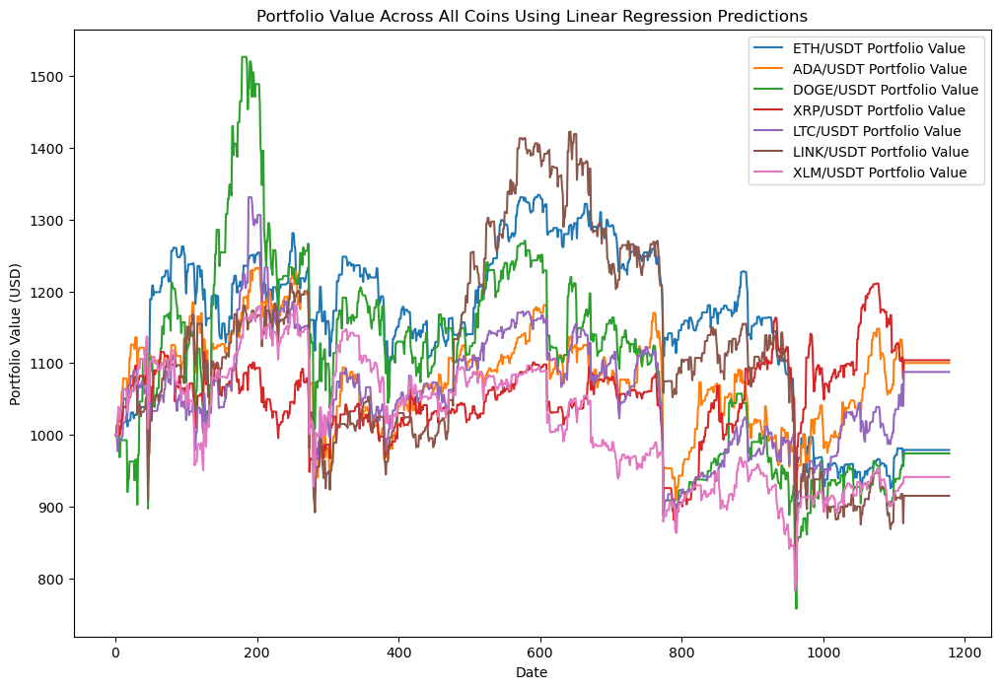

In [106]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Assuming 'aligned_data_dict' contains all coins' data
# and 'other_coins_data' contains train/test data and scalers for each coin

# Simulating and plotting trading strategy for all coins
def trading_strategy(df, y_pred, initial_balance=1000):
    """
    Apply a simple trading strategy based on predicted prices.
    Buy (1) when the predicted price is higher than the actual close price, 
    sell (-1) when the predicted price is lower.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing 'close' and other features
    y_pred (np.array): Predicted prices from the model
    initial_balance (float): Initial trading capital
    
    Returns:
    df: DataFrame with signals, portfolio value
    final_portfolio_value: Final portfolio value at the end of the simulation
    """
    df['predicted_close'] = y_pred
    df['signal'] = 0
    df.loc[df['predicted_close'] > df['close'], 'signal'] = 1  # Buy signal
    df.loc[df['predicted_close'] < df['close'], 'signal'] = -1  # Sell signal

    # Simulate a trading strategy
    position = 0  # Initial position (no holdings)
    portfolio_value = initial_balance  # Initial portfolio value

    portfolio_values = []
    for i, row in df.iterrows():
        signal = row['signal']
        close_price = row['close']
        
        if signal == 1 and position == 0:  # Buy
            position = portfolio_value / close_price  # Buy the coin with all capital
            portfolio_value = 0  # Capital is now in the coin
        elif signal == -1 and position > 0:  # Sell
            portfolio_value = position * close_price  # Sell all holdings
            position = 0  # Reset position to 0
        
        # Track portfolio value (either in cash or coin holdings)
        current_portfolio_value = portfolio_value if position == 0 else position * close_price
        portfolio_values.append(current_portfolio_value)

    df['portfolio_value'] = portfolio_values
    final_portfolio_value = portfolio_values[-1]
    return df, final_portfolio_value

# Iterate over all coins and apply the trading strategy
strategy_results = {}

initial_balance = 1000  # Starting capital

for symbol, (X_train, X_test, y_train, y_test) in other_coins_data.items():
    print(f"Processing {symbol}...")

    # Train the Linear Regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Predict the coin's prices using the test set
    y_pred = model.predict(X_test)

    # Inverse transform the predictions back to the original scale if necessary
    y_pred_original = scalers[symbol].inverse_transform(y_pred.reshape(-1, 1))
    y_test_original = scalers[symbol].inverse_transform(y_test.reshape(-1, 1))

    # Evaluate and print the results for the coin
    mse = mean_squared_error(y_test_original, y_pred_original)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test_original, y_pred_original)
    r2 = r2_score(y_test_original, y_pred_original)

    print(f"{symbol} - RMSE: {rmse}, MAE: {mae}, R-squared: {r2}")

    # Prepare the DataFrame with the test part of the original data
    df_test = pd.DataFrame({
        'close': y_test_original.flatten(),
        'predicted_close': y_pred_original.flatten()
    })

    # Apply the trading strategy
    df_test, final_portfolio_value = trading_strategy(df_test, y_pred_original, initial_balance)

    strategy_results[symbol] = {
        'final_portfolio_value': final_portfolio_value,
        'df': df_test
    }

    print(f"Final portfolio value for {symbol}: ${final_portfolio_value:.2f}")

# Plot the results for all coins
plt.figure(figsize=(12, 8))
for symbol, result in strategy_results.items():
    plt.plot(result['df'].index, result['df']['portfolio_value'], label=f'{symbol} Portfolio Value')

plt.title('Portfolio Value Across All Coins Using Linear Regression Predictions')
plt.xlabel('Date')
plt.ylabel('Portfolio Value (USD)')
plt.legend()
plt.show()


**Trading Strategy Design**

**Backtesting**

Coins with positive and relevant correlation with BTC: ['ETH/USDT', 'DOGE/USDT', 'LINK/USDT']
Running backtest for ETH/USDT...

ETH/USDT Backtest Results:
Final Balance: $978.97
Total Return: -2.10%
CAGR: -0.66%
Sharpe Ratio: 0.01
Max Drawdown: -0.34%
Volatility: 0.19%
Number of Trades: 578


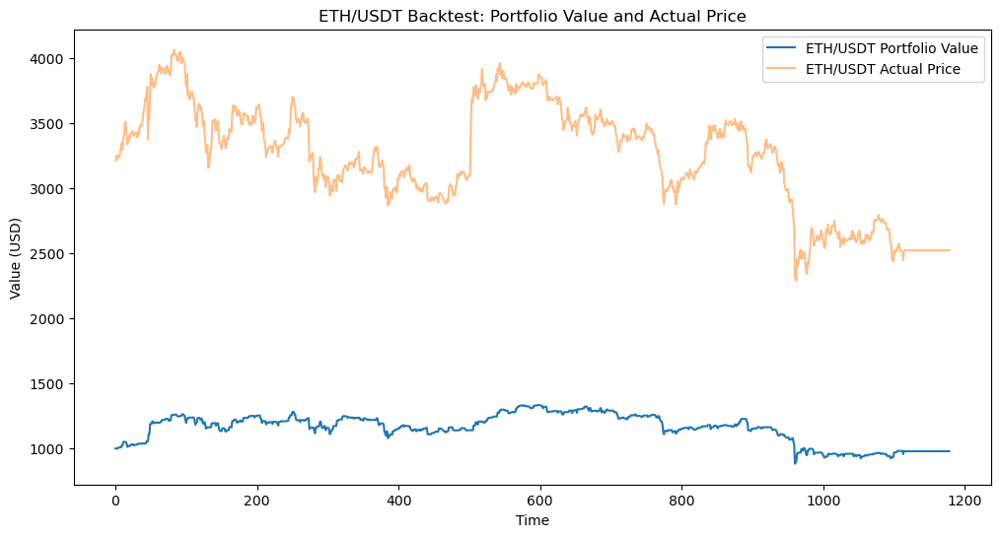

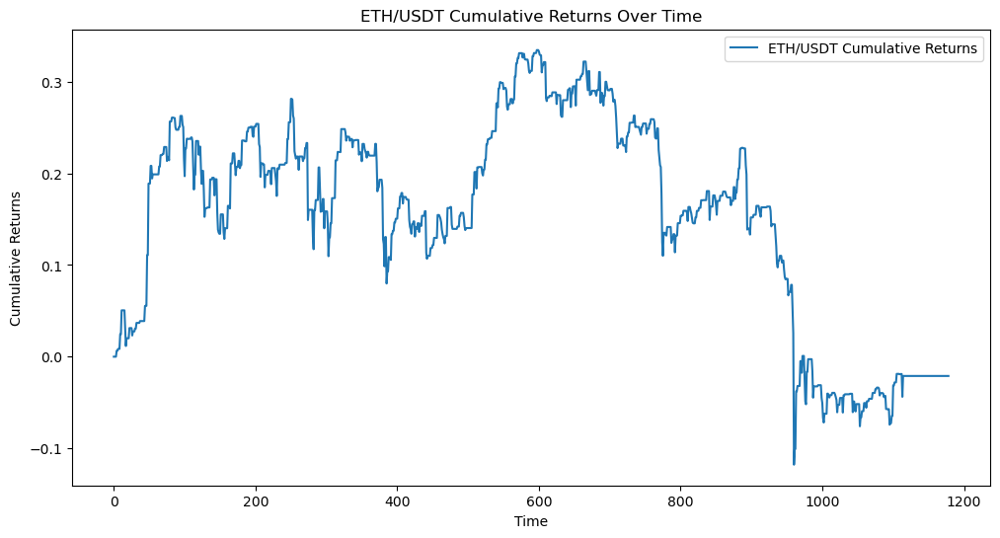

Running backtest for DOGE/USDT...

DOGE/USDT Backtest Results:
Final Balance: $974.16
Total Return: -2.58%
CAGR: -0.81%
Sharpe Ratio: 0.12
Max Drawdown: -0.50%
Volatility: 0.34%
Number of Trades: 552


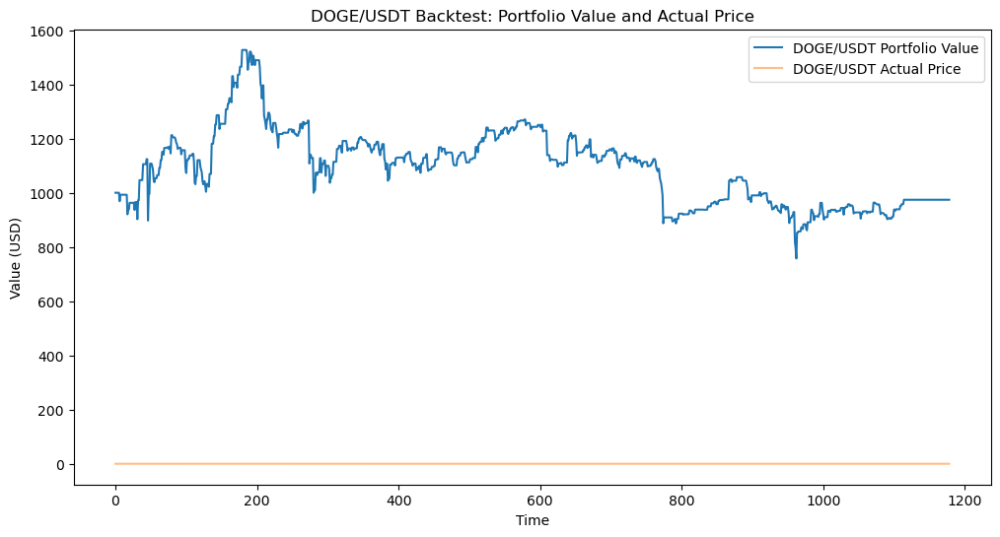

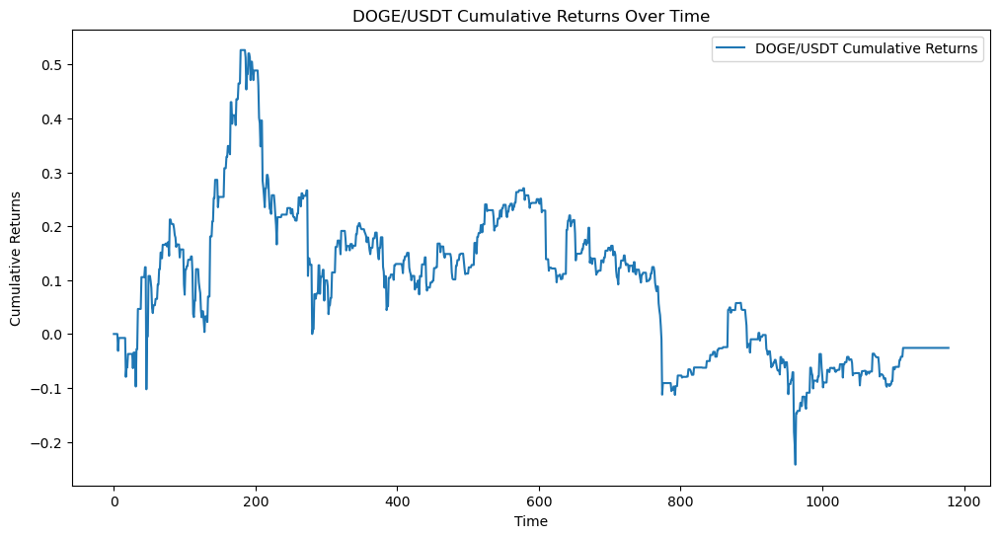

Running backtest for LINK/USDT...

LINK/USDT Backtest Results:
Final Balance: $915.09
Total Return: -8.49%
CAGR: -2.71%
Sharpe Ratio: 0.01
Max Drawdown: -0.44%
Volatility: 0.28%
Number of Trades: 568


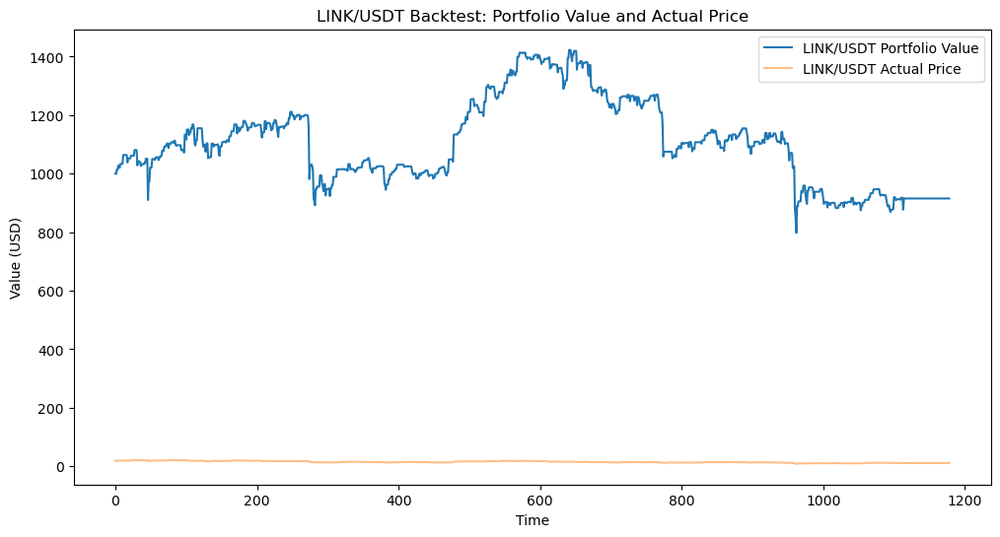

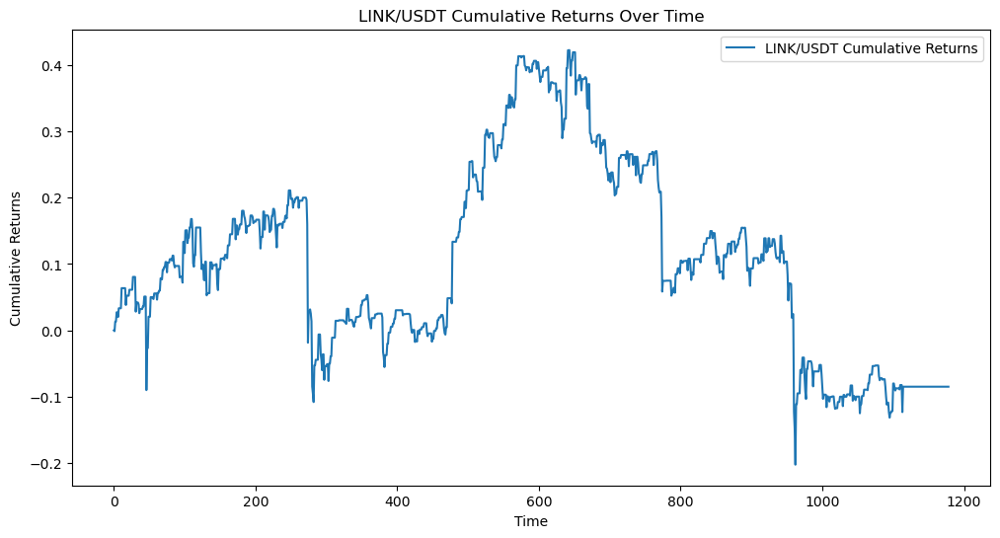

In [107]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# Filter coins that have positive and significant correlation with BTC (e.g., > 0.5)
correlated_coins = correlation_matrix.loc['BTC/USDT', correlation_matrix.loc['BTC/USDT'] > 0.5].index.tolist()
correlated_coins.remove('BTC/USDT')  # Remove BTC/USDT itself from the list

print(f"Coins with positive and relevant correlation with BTC: {correlated_coins}")

# Backtest function for a given strategy (previously defined)
def backtest_strategy(df, initial_balance=1000, risk_free_rate=0.01):
    """
    Backtest a strategy by simulating the buy/sell signals over the historical data.
    """
    position = 0
    portfolio_value = initial_balance
    portfolio_values = []
    cash = initial_balance
    trades = 0

    for i, row in df.iterrows():
        signal = row['signal']
        current_price = row['actual_price']

        if signal == 1 and position == 0:  # Buy signal and no current position
            position = cash / current_price
            cash = 0
            trades += 1
        elif signal == -1 and position > 0:  # Sell signal and currently holding
            cash = position * current_price
            position = 0
            trades += 1

        current_value = position * current_price if position > 0 else cash
        portfolio_values.append(current_value)

    df['portfolio_value'] = portfolio_values
    final_balance = df['portfolio_value'].iloc[-1]
    total_return = (final_balance - initial_balance) / initial_balance * 100
    df['returns'] = df['portfolio_value'].pct_change().fillna(0)
    df['cumulative_returns'] = (1 + df['returns']).cumprod() - 1

    num_days = len(df)
    num_years = num_days / 365.0
    cagr = ((final_balance / initial_balance) ** (1 / num_years) - 1) * 100

    mean_returns = df['returns'].mean()
    std_returns = df['returns'].std()
    sharpe_ratio = (mean_returns - risk_free_rate / 365) / std_returns * np.sqrt(365)

    rolling_max = df['portfolio_value'].cummax()
    drawdown = (df['portfolio_value'] - rolling_max) / rolling_max
    max_drawdown = drawdown.min()

    volatility = df['returns'].std() * np.sqrt(365)

    return {
        'df': df,
        'final_balance': final_balance,
        'total_return': total_return,
        'cagr': cagr,
        'sharpe_ratio': sharpe_ratio,
        'max_drawdown': max_drawdown,
        'volatility': volatility,
        'trades': trades
    }

# Example: Running the backtest for each correlated coin
for symbol in correlated_coins:
    print(f"Running backtest for {symbol}...")

    # Assume you have predicted prices and actual prices stored in predicted_coins_no_btc
    df = pd.DataFrame({
        'actual_price': predicted_coins_no_btc[symbol]['y_test'].flatten(),
        'predicted_price': predicted_coins_no_btc[symbol]['y_pred'].flatten()
    })

    # Generate trading signals
    df['signal'] = 0
    df.loc[df['predicted_price'] > df['actual_price'], 'signal'] = 1  # Buy signal
    df.loc[df['predicted_price'] < df['actual_price'], 'signal'] = -1  # Sell signal

    # Run the backtest
    backtest_results = backtest_strategy(df)

    # Print KPIs for the coin
    print(f"\n{symbol} Backtest Results:")
    print(f"Final Balance: ${backtest_results['final_balance']:.2f}")
    print(f"Total Return: {backtest_results['total_return']:.2f}%")
    print(f"CAGR: {backtest_results['cagr']:.2f}%")
    print(f"Sharpe Ratio: {backtest_results['sharpe_ratio']:.2f}")
    print(f"Max Drawdown: {backtest_results['max_drawdown']:.2f}%")
    print(f"Volatility: {backtest_results['volatility']:.2f}%")
    print(f"Number of Trades: {backtest_results['trades']}")

    # Plot the results for the coin
    plt.figure(figsize=(12, 6))
    plt.plot(backtest_results['df'].index, backtest_results['df']['portfolio_value'], label=f'{symbol} Portfolio Value')
    plt.plot(backtest_results['df'].index, backtest_results['df']['actual_price'], label=f'{symbol} Actual Price', alpha=0.5)
    plt.title(f'{symbol} Backtest: Portfolio Value and Actual Price')
    plt.xlabel('Time')
    plt.ylabel('Value (USD)')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(backtest_results['df'].index, backtest_results['df']['cumulative_returns'], label=f'{symbol} Cumulative Returns')
    plt.title(f'{symbol} Cumulative Returns Over Time')
    plt.xlabel('Time')
    plt.ylabel('Cumulative Returns')
    plt.legend()
    plt.show()


In [1]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
